In [1]:
# Data Preparation and Understanding - Assignment 1
# [Your Name]
# [Date]

# Import necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import xml.etree.ElementTree as ET
from skimage import io, color, filters, feature, exposure
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances, cosine_distances
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import json

# Set up paths
IMAGE_DIR = r'C:\Users\David\programmingAssignment1\Images'
ANNOTATION_DIR = r'C:\Users\David\programmingAssignment1\Annotation'
OUTPUT_DIR = r'C:\Users\David\programmingAssignment1\output'

# Function to get bounding boxes from XML annotation
def get_bounding_boxes(annot):
    tree = ET.parse(annot)
    root = tree.getroot()
    objects = root.findall('object')
    bbox = []
    for o in objects:
        bndbox = o.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bbox.append((xmin,ymin,xmax,ymax))
    return bbox

print("Setup complete. Ready to start the assignment tasks.")

Setup complete. Ready to start the assignment tasks.


In [2]:
import os

def add_xml_extension(annotation_dir):
    """Rename annotation files to include the .xml extension."""
    for root, _, files in os.walk(annotation_dir):
        for filename in files:
            # Check if the file does not have an extension
            if '.' not in filename:
                old_path = os.path.join(root, filename)
                new_path = os.path.join(root, filename + '.xml')
                os.rename(old_path, new_path)

# Specify the path to your annotation directory
ANNOTATION_DIR = r'C:\Users\David\programmingAssignment1\Annotation'

# Add the .xml extension to all annotation files
add_xml_extension(ANNOTATION_DIR)


In [6]:
import os
from PIL import Image
import xml.etree.ElementTree as ET

def get_bounding_boxes_and_filename(annot):
    """Extract bounding box coordinates and the image filename from an XML annotation file."""
    try:
        tree = ET.parse(annot)
        root = tree.getroot()
        
        # Extract the <filename> value (e.g., n02085782_2)
        filename = root.find('filename').text

        # Extract bounding boxes from <object> tags
        bbox = []
        for obj in root.findall('object'):
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            bbox.append((xmin, ymin, xmax, ymax))
        
        return bbox, filename
    except Exception as e:
        print(f"Error parsing annotation file {annot}: {str(e)}")
        return [], None

def crop_and_resize_images(image_dir, annotation_dir, output_dir, target_size=(128, 128)):
    """Crop and resize images based on bounding boxes from XML annotations."""
   

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    processed_count = 0
    xml_count = 0

    # Traverse subdirectories in the annotations folder
    for breed_dir in os.listdir(annotation_dir):
        breed_annotation_dir = os.path.join(annotation_dir, breed_dir)
        breed_image_dir = os.path.join(image_dir, breed_dir)

        # Check if both image and annotation subfolders exist
        if not os.path.isdir(breed_annotation_dir) or not os.path.isdir(breed_image_dir):
            continue

        for filename in os.listdir(breed_annotation_dir):
            # Detect annotation files (assuming they have .xml extension)
            if filename.lower().endswith('.xml'):
                xml_count += 1
                annot_path = os.path.join(breed_annotation_dir, filename)

                # Get bounding boxes and the filename from the XML file
                bbox, img_filename = get_bounding_boxes_and_filename(annot_path)
                
                # Append the .jpg extension to the filename extracted from XML
                img_filename += '.jpg'
                img_path = os.path.join(breed_image_dir, img_filename)

                # Check if the image file exists
                if not os.path.exists(img_path):
                    print(f"Image not found for annotation: {img_filename}")
                    continue
                

                # Open the image
                img = Image.open(img_path)
                
                for i, (xmin, ymin, xmax, ymax) in enumerate(bbox):
                    try:
                        cropped_img = img.crop((xmin, ymin, xmax, ymax))
                        resized_img = cropped_img.resize(target_size, Image.LANCZOS)
                        
                        # Save to the output directory, preserving breed subfolder structure
                        output_subdir = os.path.join(output_dir, breed_dir)
                        if not os.path.exists(output_subdir):
                            os.makedirs(output_subdir)

                        output_filename = f"{os.path.splitext(img_filename)[0]}_{i}.jpg"
                        output_path = os.path.join(output_subdir, output_filename)
                        resized_img.save(output_path)
                        processed_count += 1
                    except Exception as e:
                        print(f"Error processing bounding box {i} for {img_filename}: {str(e)}")

# Use the function with the correct paths
IMAGE_DIR = r'C:\Users\David\programmingAssignment1\Images'
ANNOTATION_DIR = r'C:\Users\David\programmingAssignment1\Annotation'
OUTPUT_DIR = r'C:\Users\David\programmingAssignment1\output'

crop_and_resize_images(IMAGE_DIR, ANNOTATION_DIR, OUTPUT_DIR)


Found 754 images. Processing...
Image 1: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10079_0.jpg


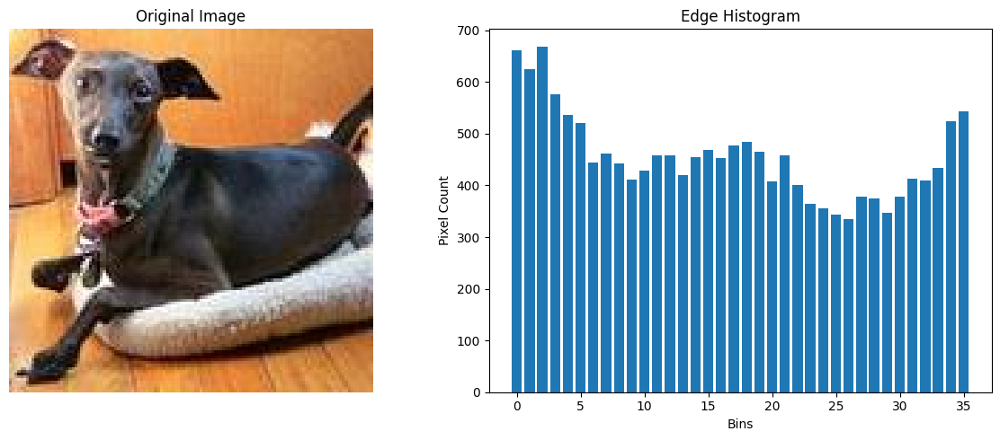

Image 2: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10079_1.jpg


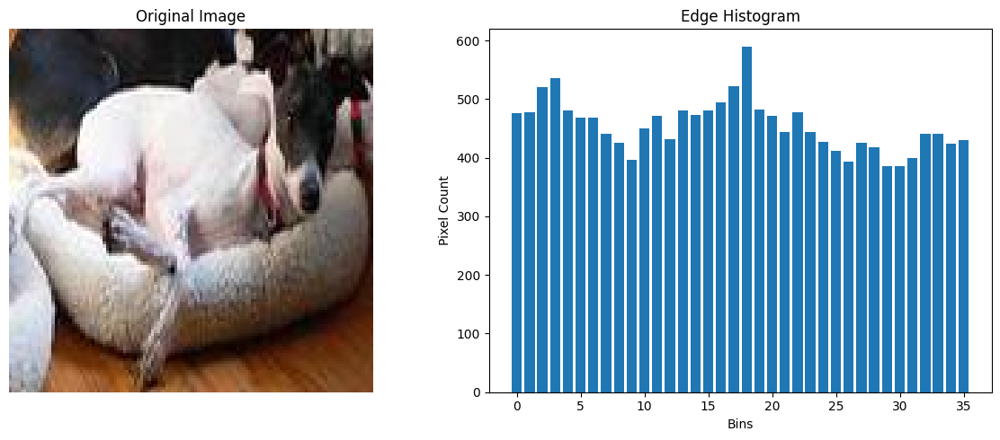

Image 3: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10079_2.jpg


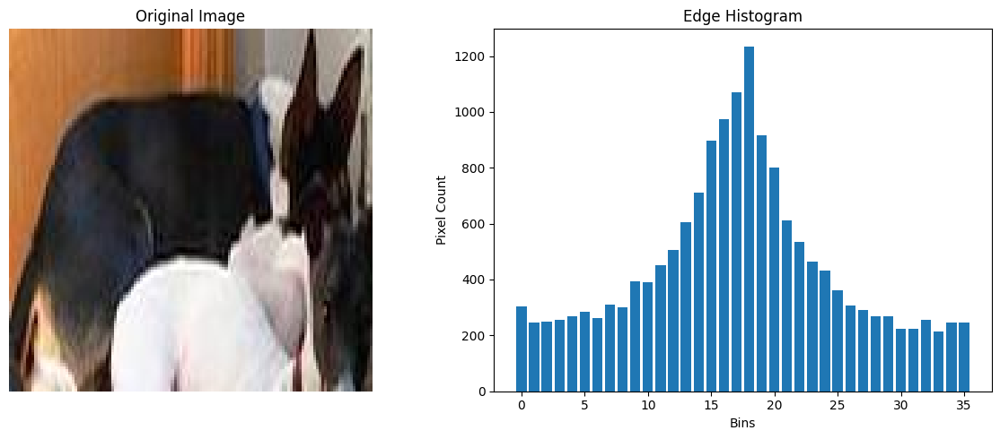

Image 4: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_102_0.jpg


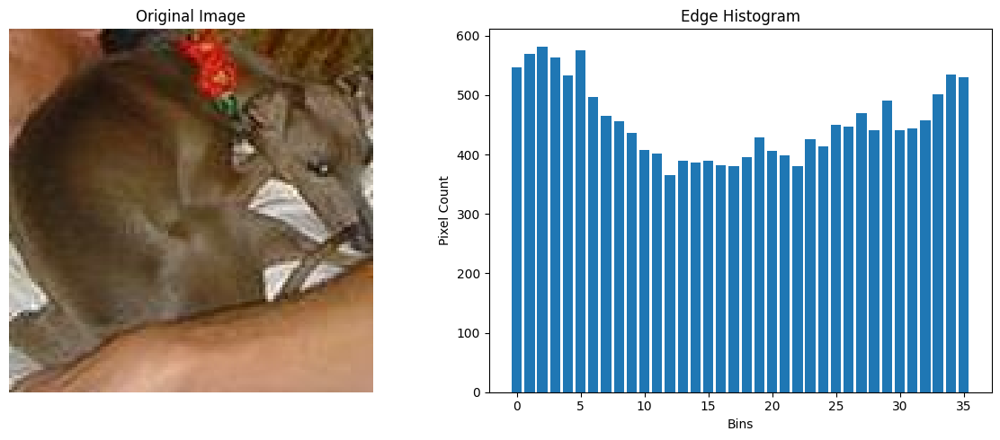

Image 5: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10300_0.jpg


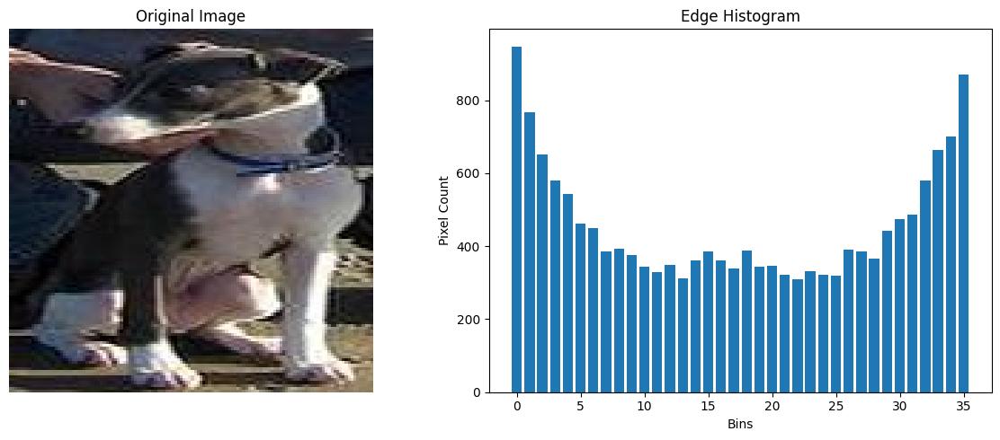

Image 6: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1030_0.jpg


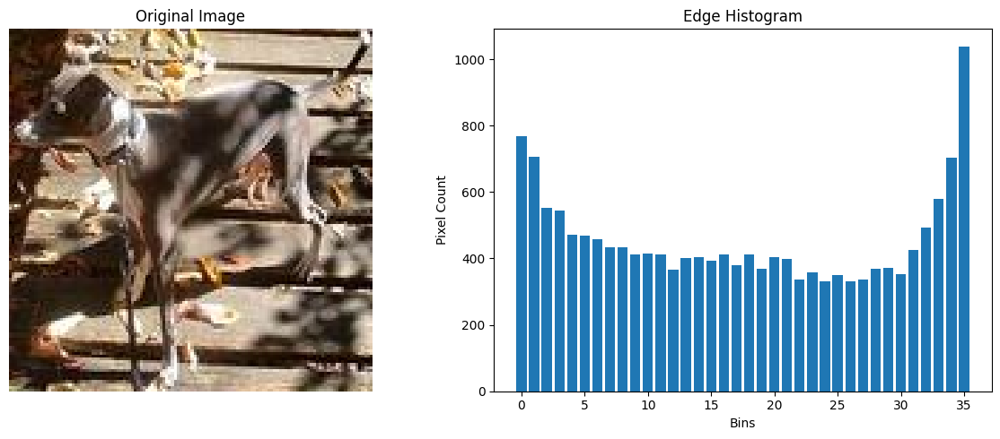

Image 7: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10314_0.jpg


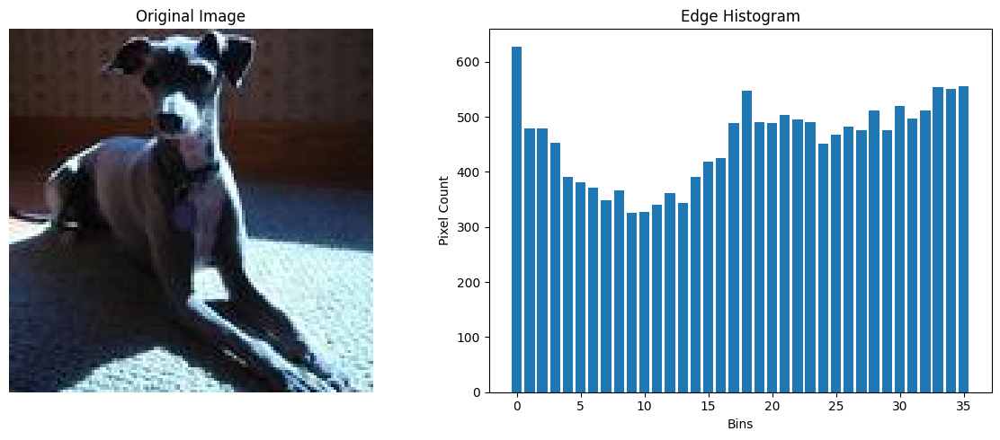

Image 8: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1034_0.jpg


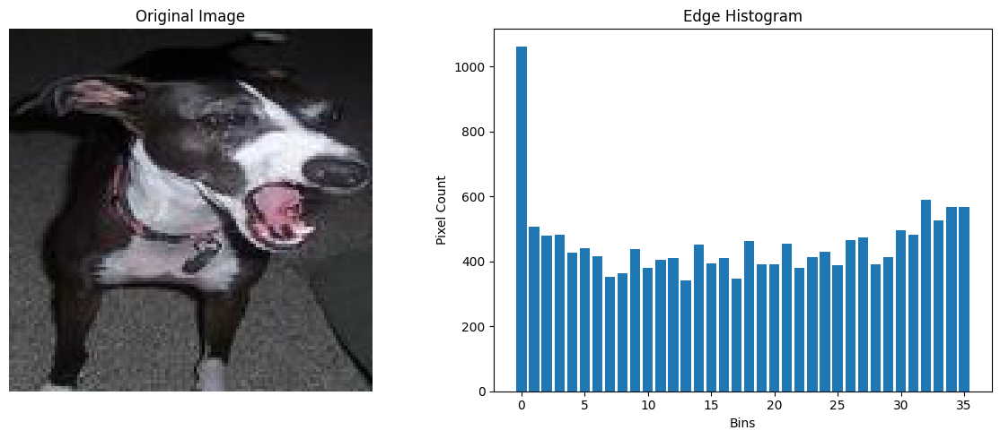

Image 9: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10352_0.jpg


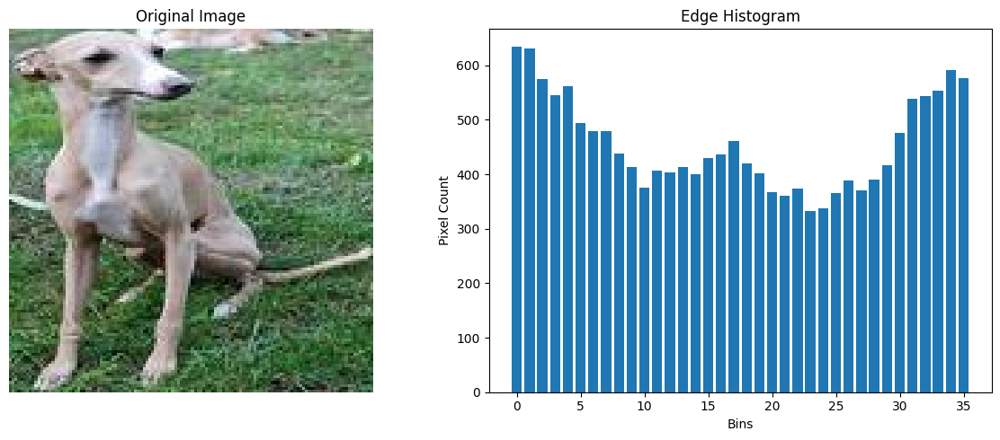

Image 10: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1041_0.jpg


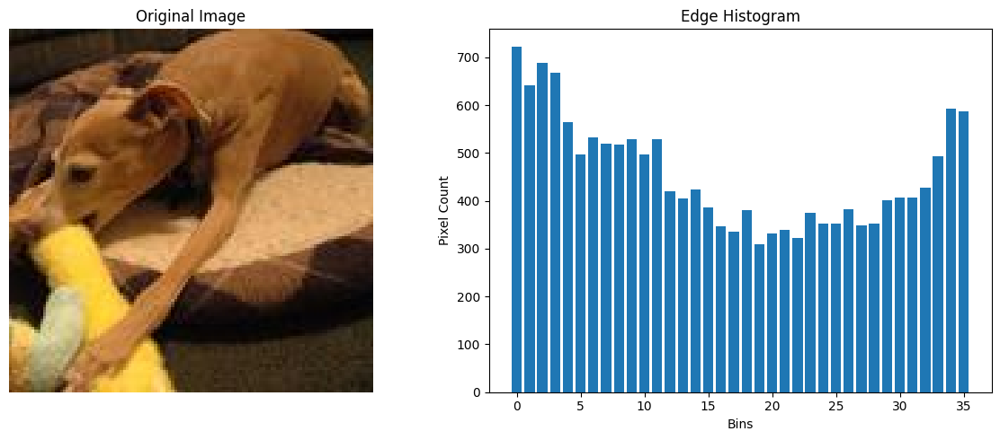

Image 11: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10435_0.jpg


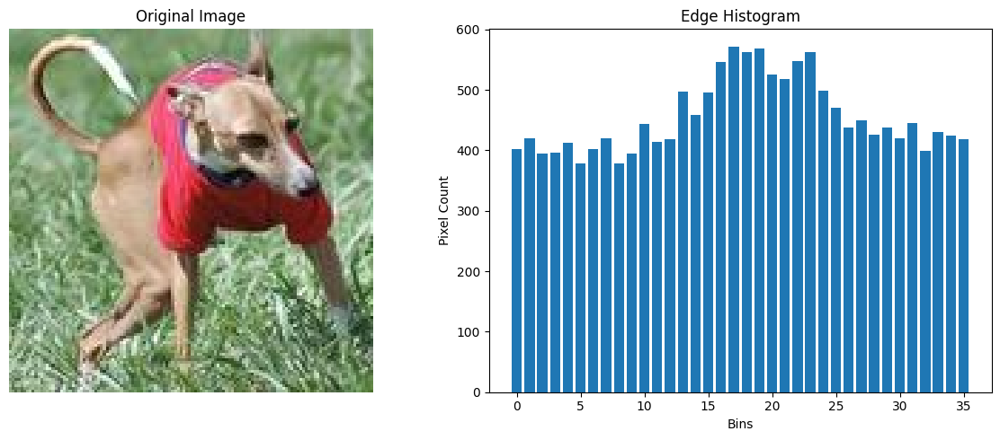

Image 12: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10449_0.jpg


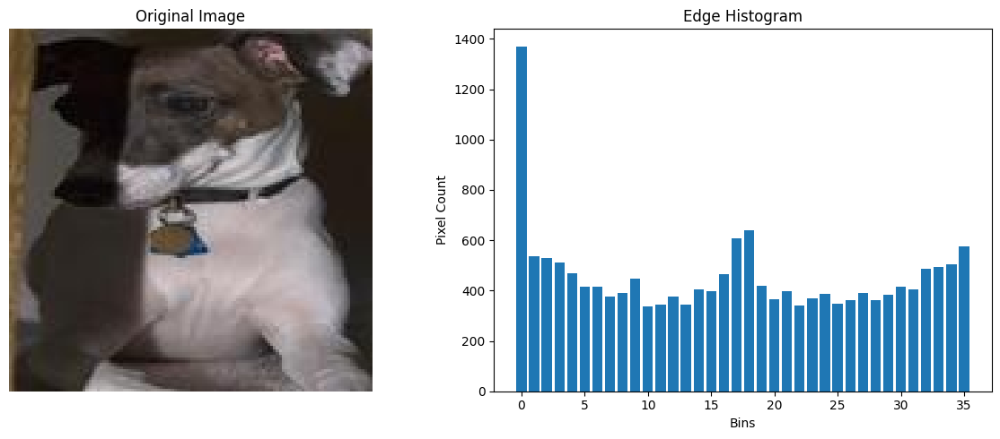

Image 13: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10507_0.jpg


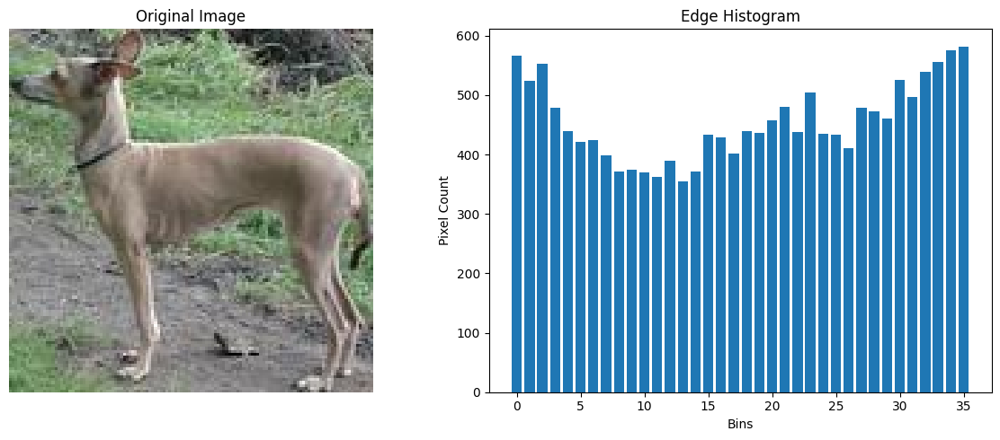

Image 14: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10644_0.jpg


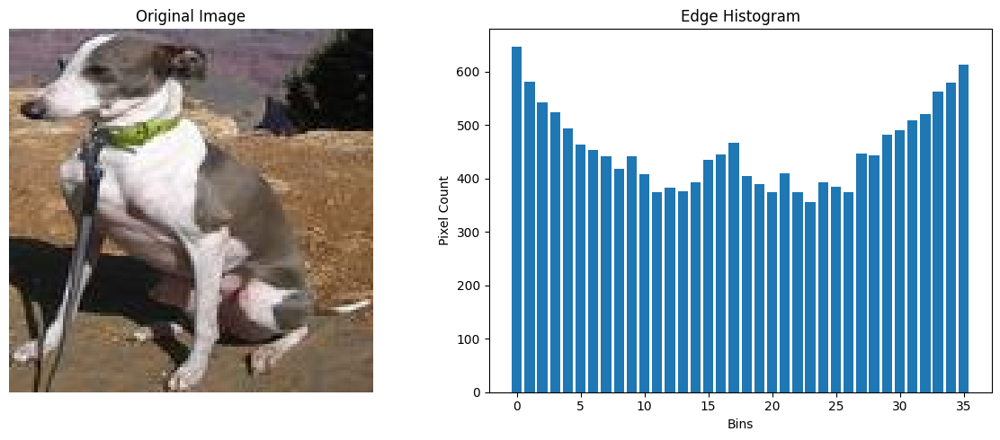

Image 15: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10688_0.jpg


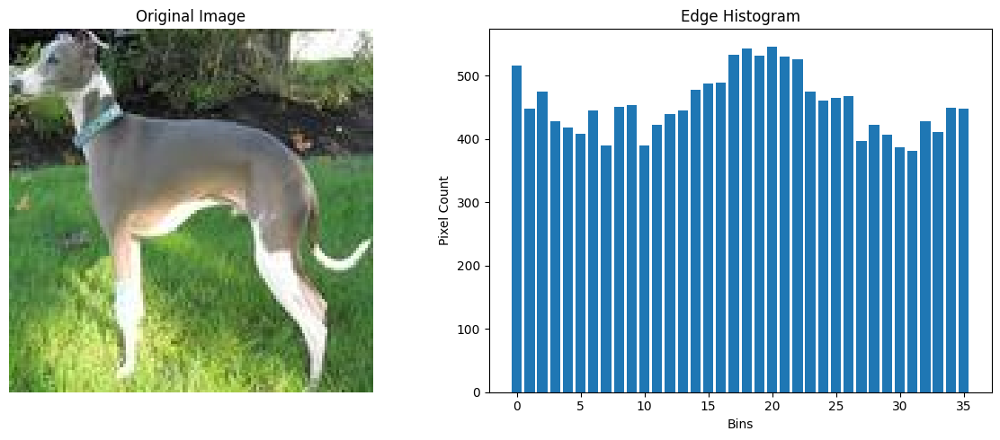

Image 16: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1071_0.jpg


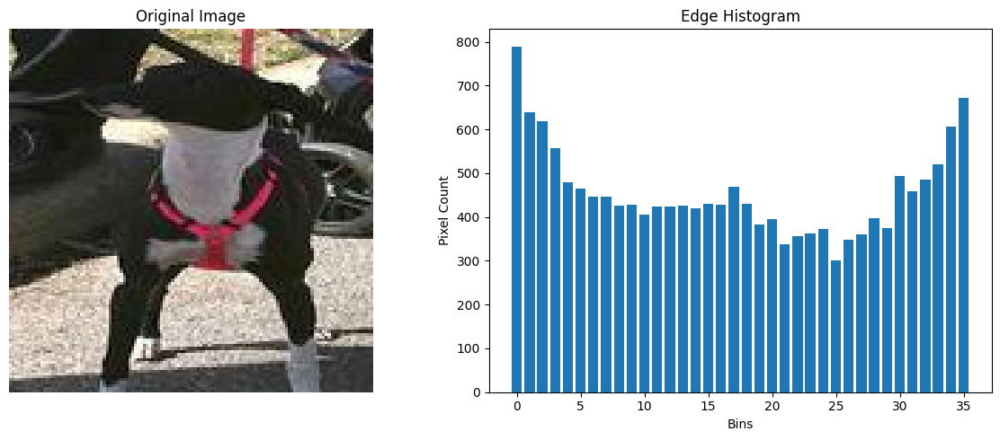

Image 17: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1072_0.jpg


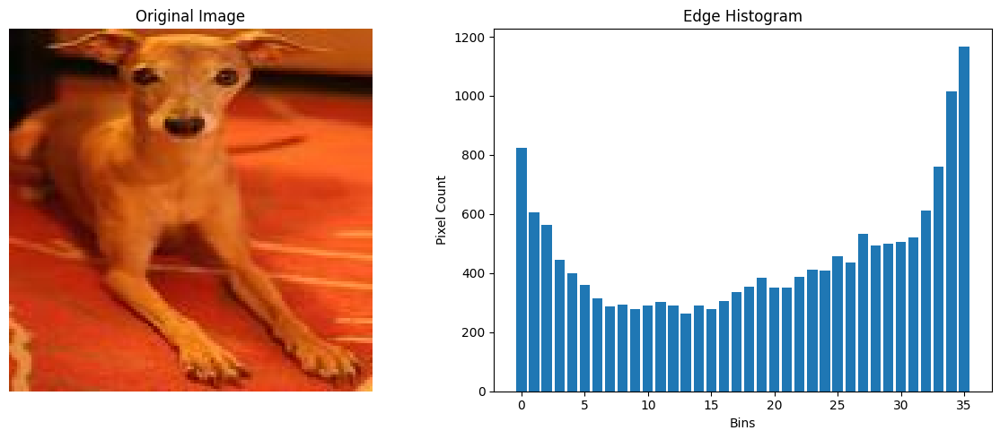

Image 18: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_10984_0.jpg


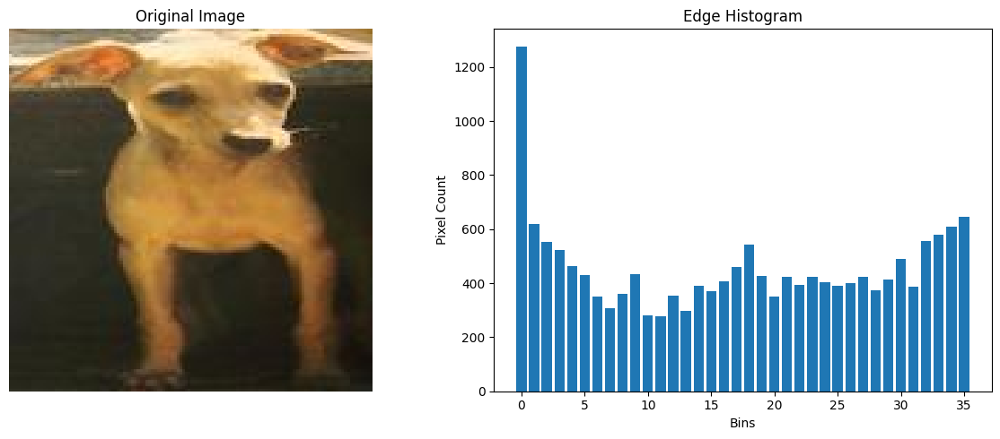

Image 19: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1100_0.jpg


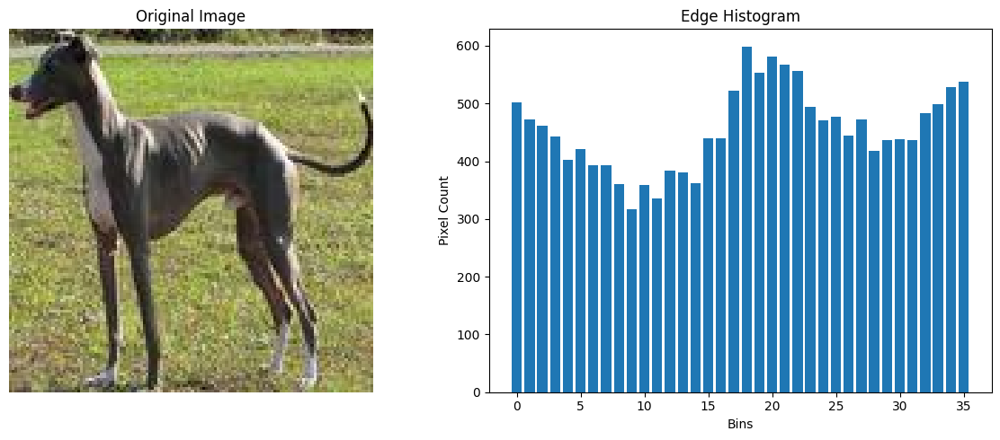

Image 20: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11062_0.jpg


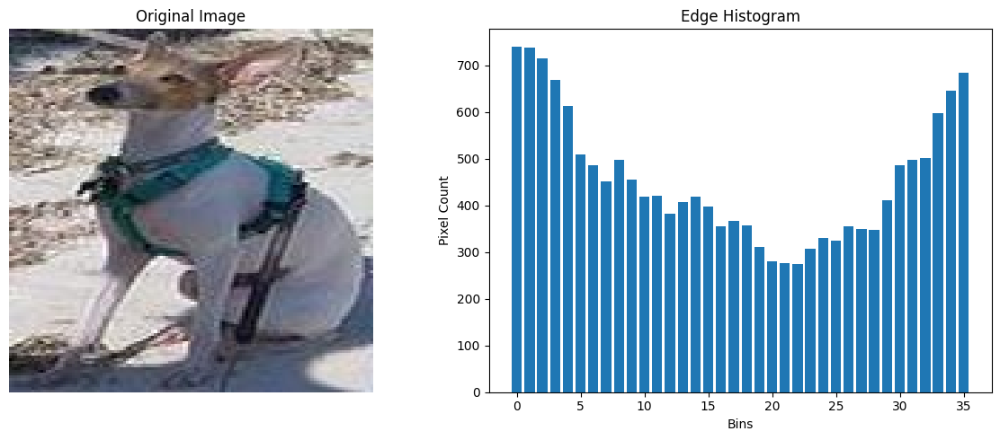

Image 21: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11088_0.jpg


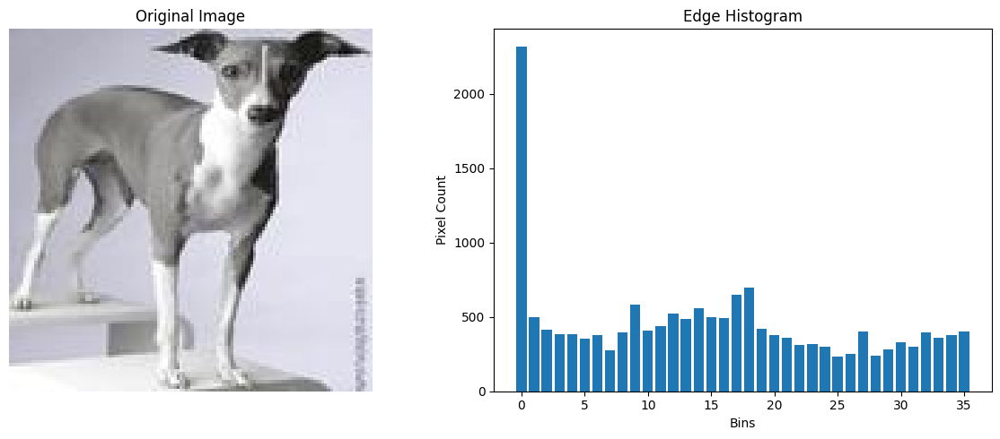

Image 22: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11119_0.jpg


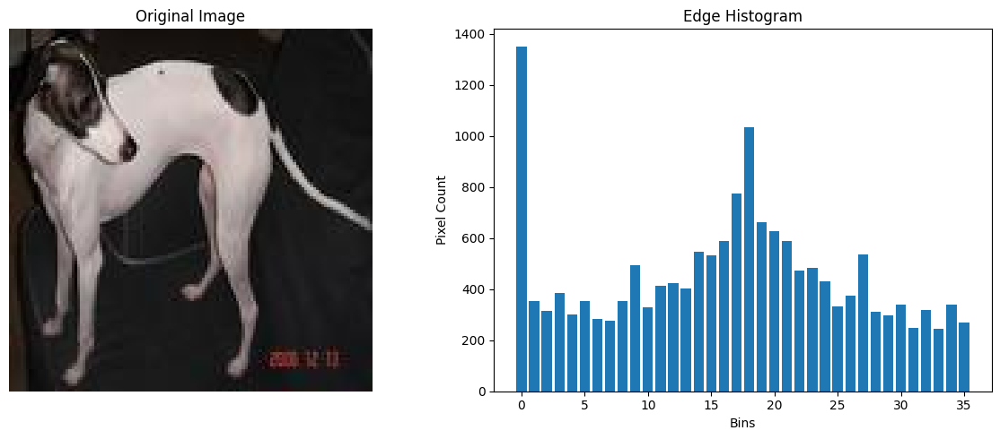

Image 23: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1121_0.jpg


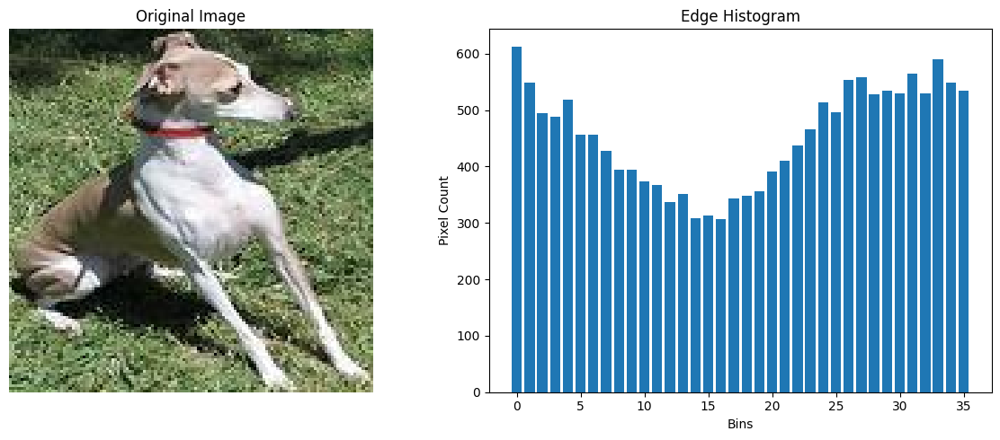

Image 24: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1140_0.jpg


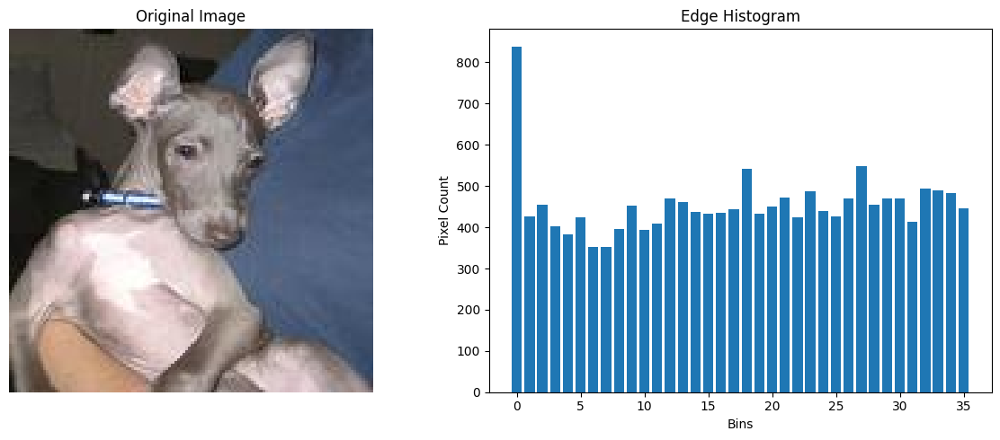

Image 25: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11549_0.jpg


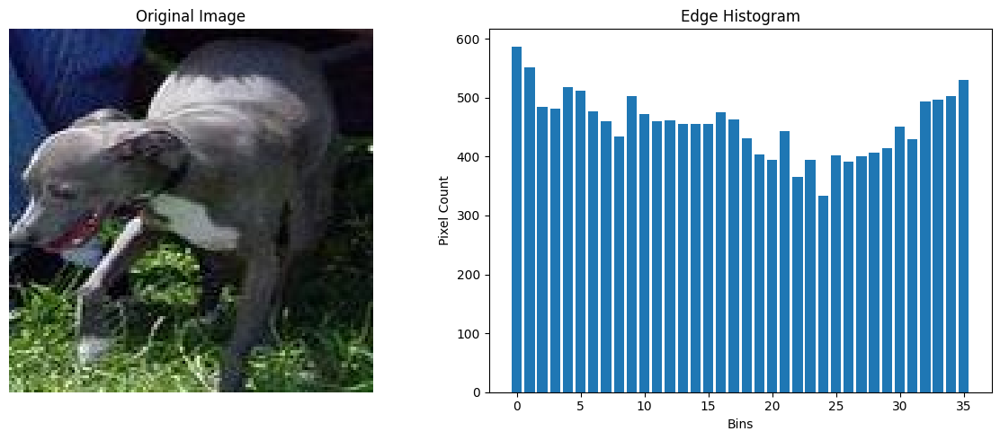

Image 26: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11549_1.jpg


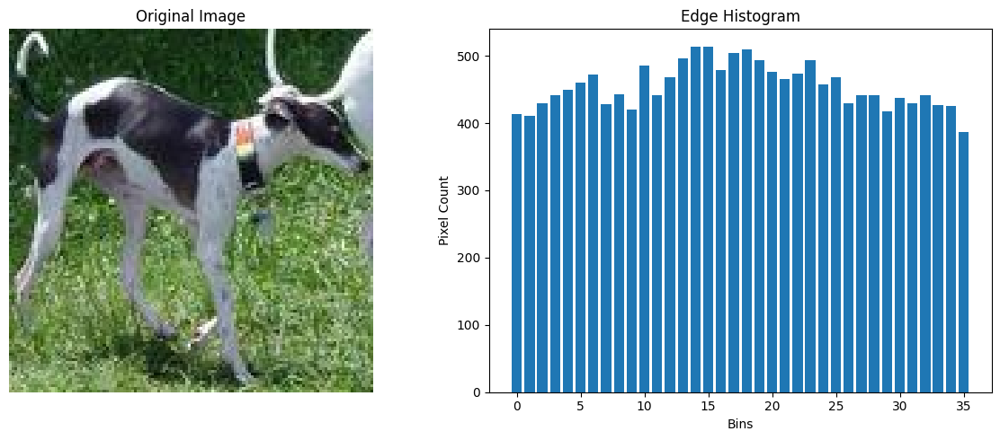

Image 27: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11549_2.jpg


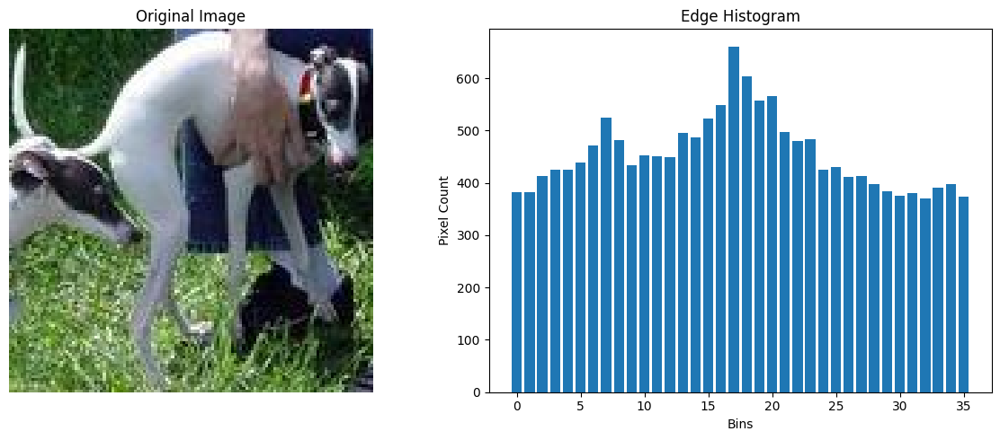

Image 28: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1158_0.jpg


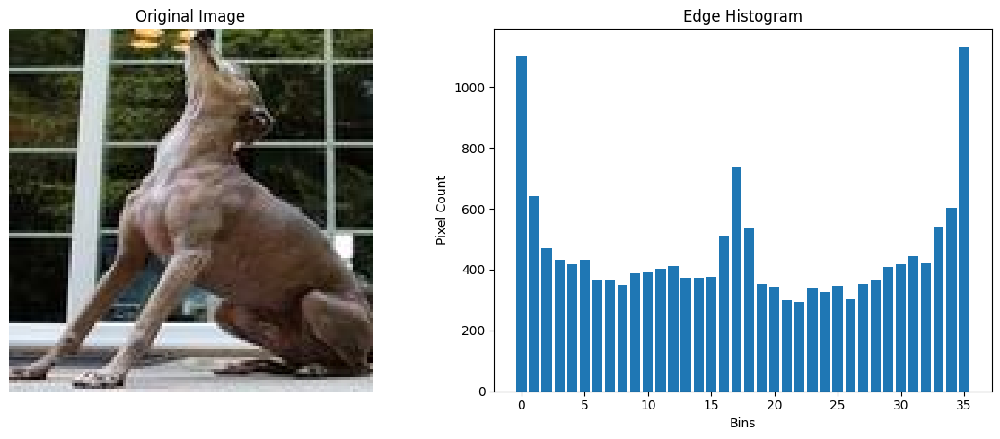

Image 29: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11626_0.jpg


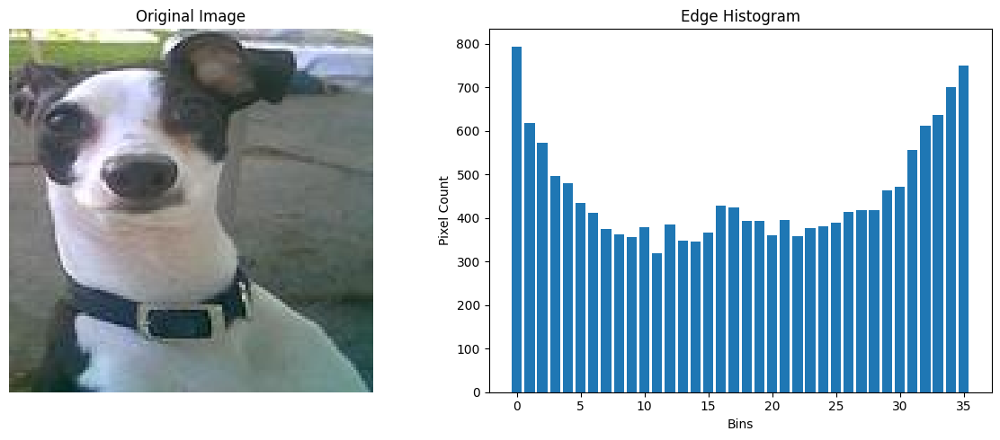

Image 30: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11660_0.jpg


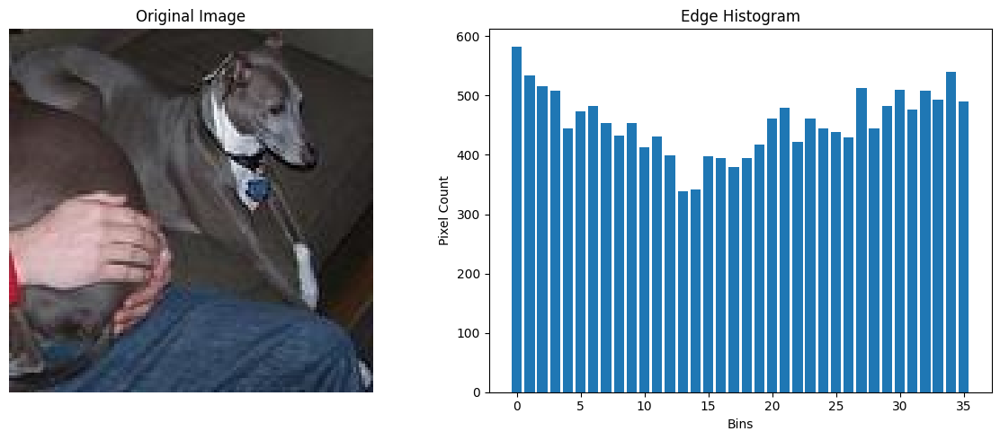

Image 31: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11660_1.jpg


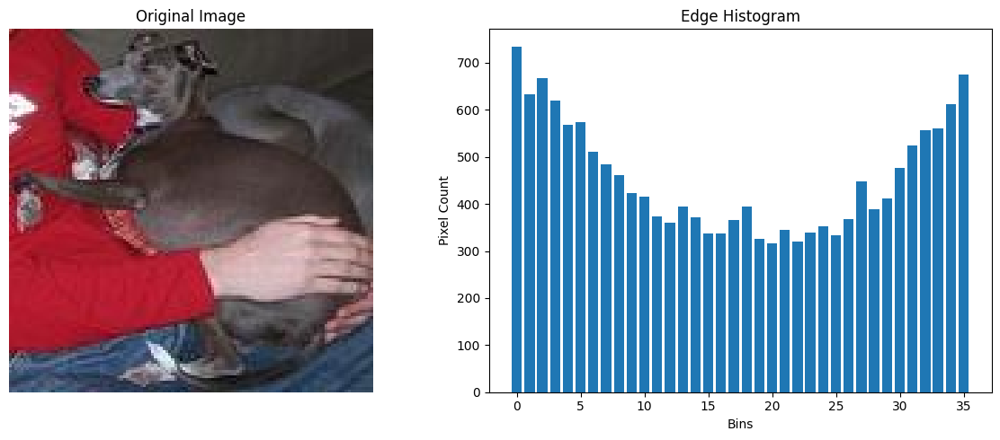

Image 32: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1170_0.jpg


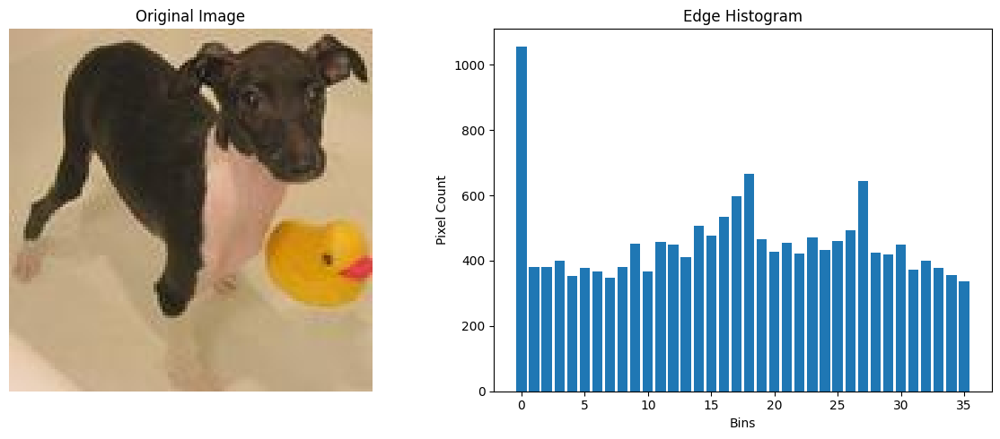

Image 33: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11812_0.jpg


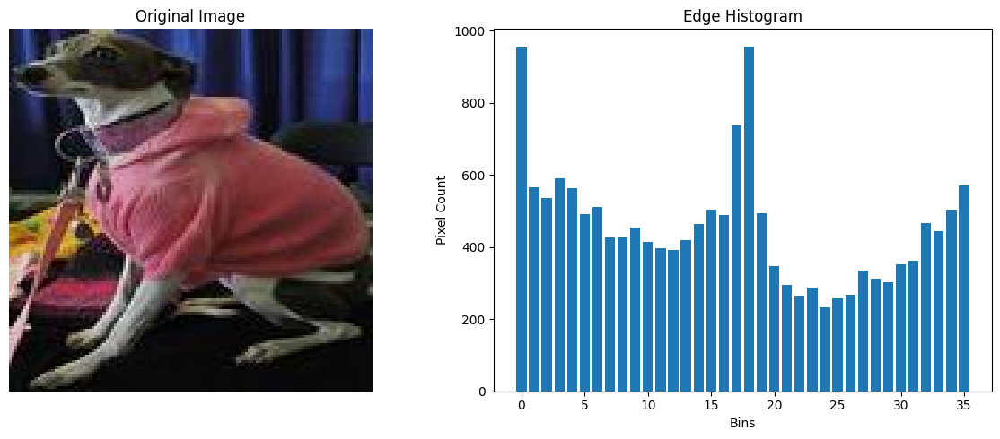

Image 34: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11843_0.jpg


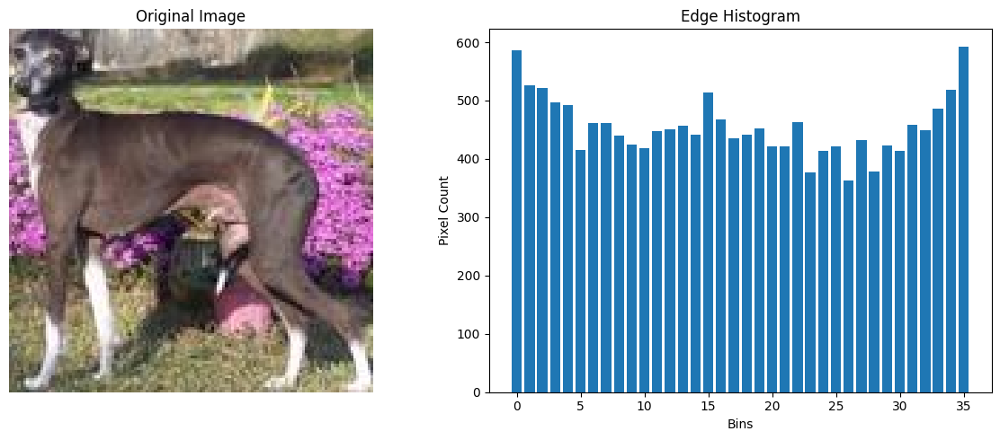

Image 35: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11998_0.jpg


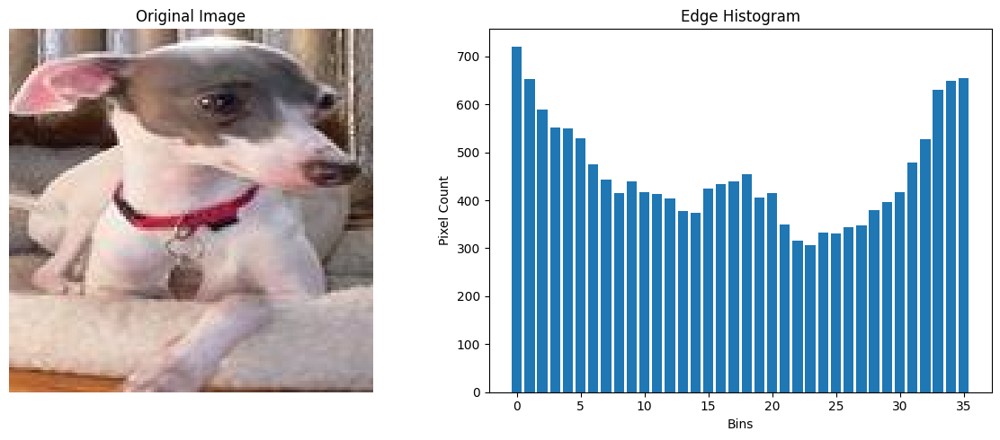

Image 36: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_11998_1.jpg


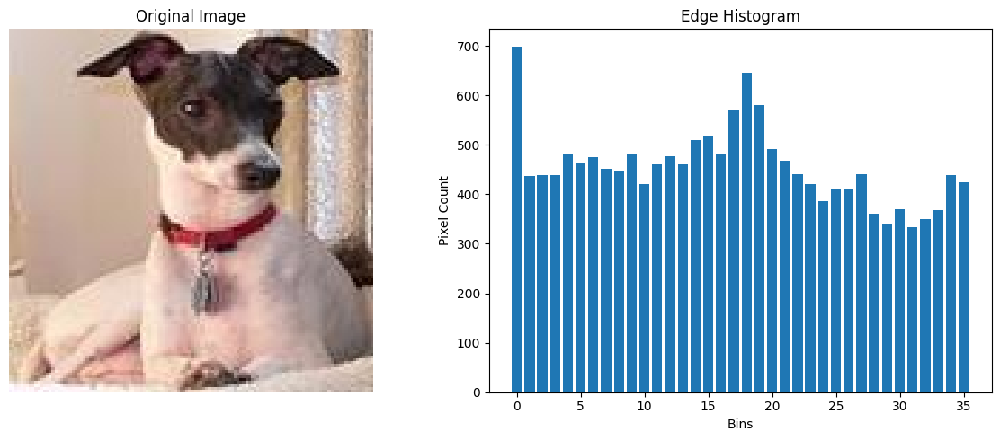

Image 37: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_12013_0.jpg


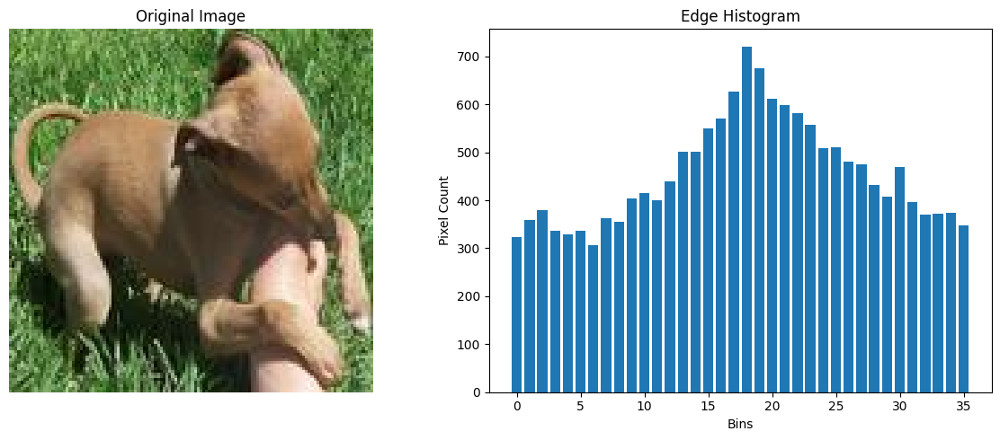

Image 38: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_12113_0.jpg


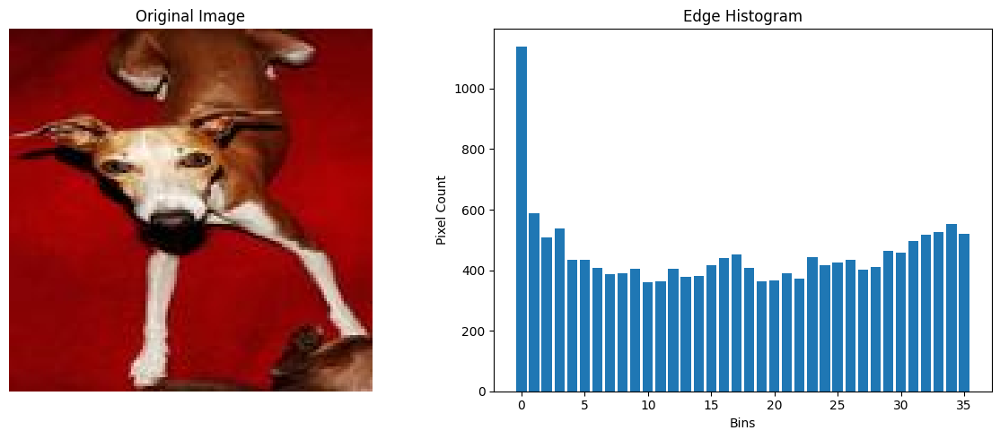

Image 39: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_12113_1.jpg


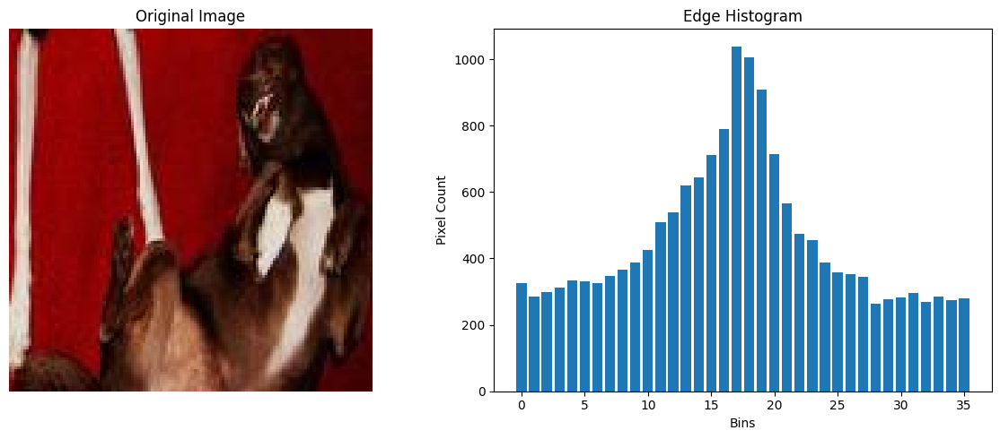

Image 40: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_12144_0.jpg


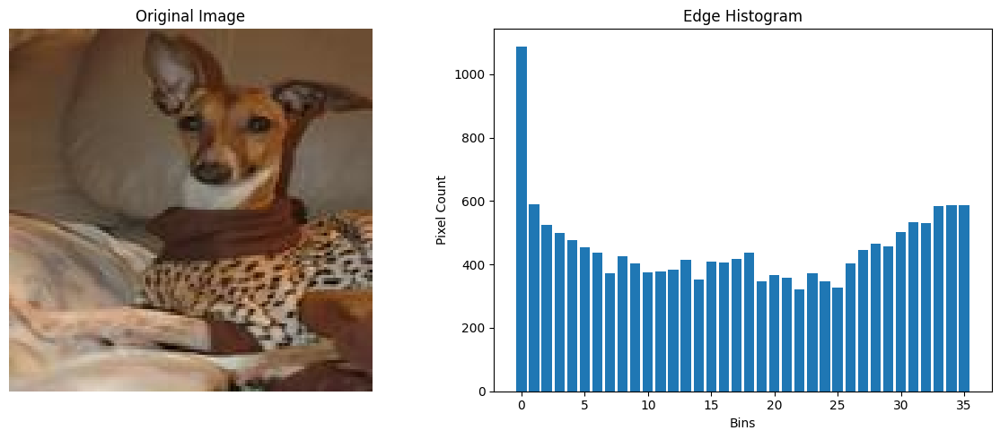

Image 41: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1228_0.jpg


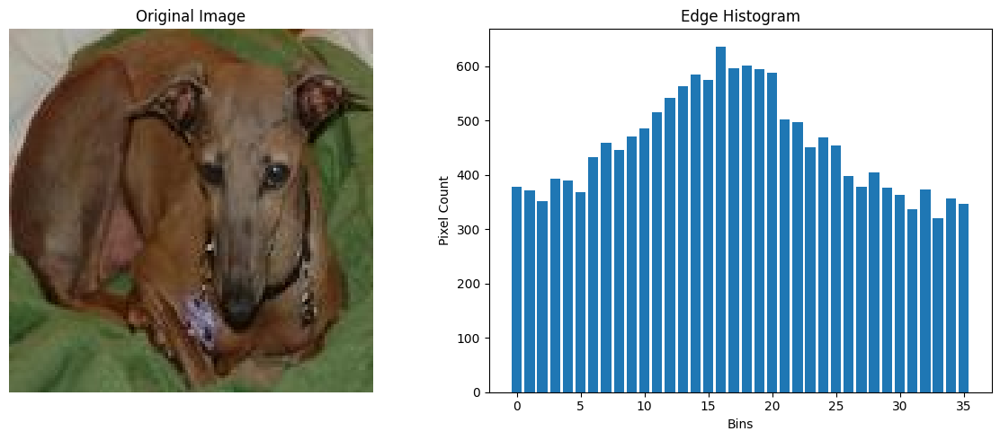

Image 42: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1248_0.jpg


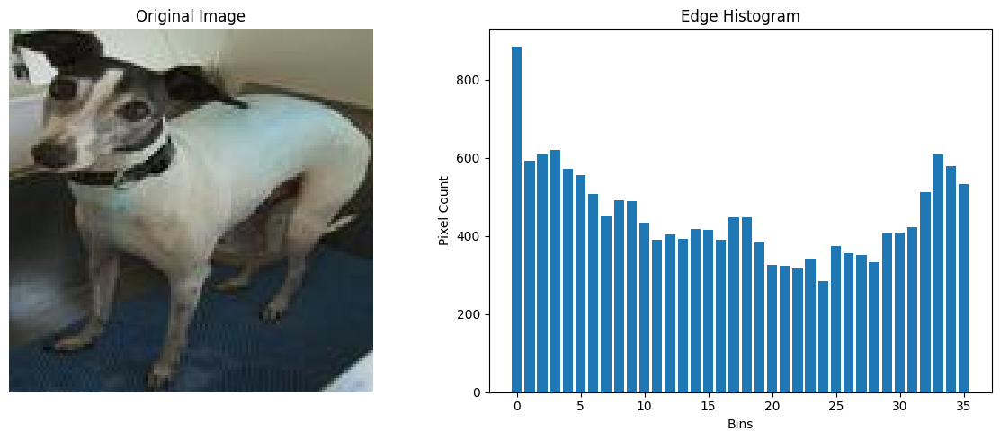

Image 43: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1266_0.jpg


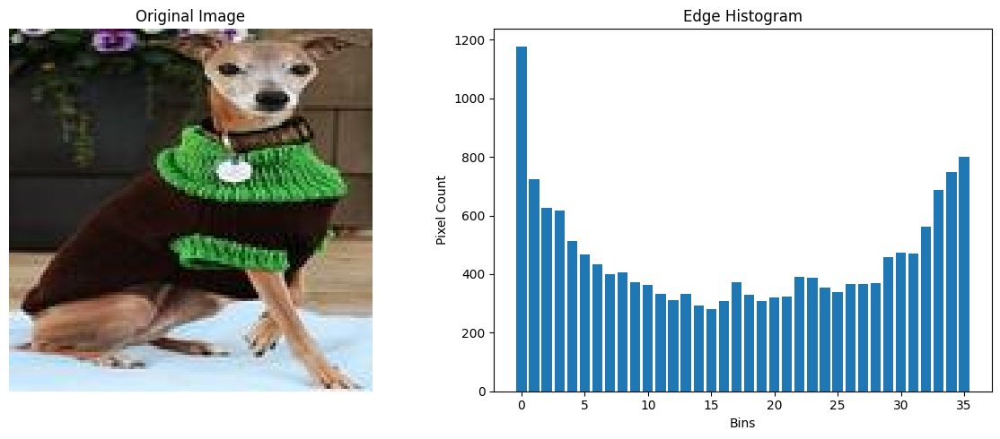

Image 44: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1358_0.jpg


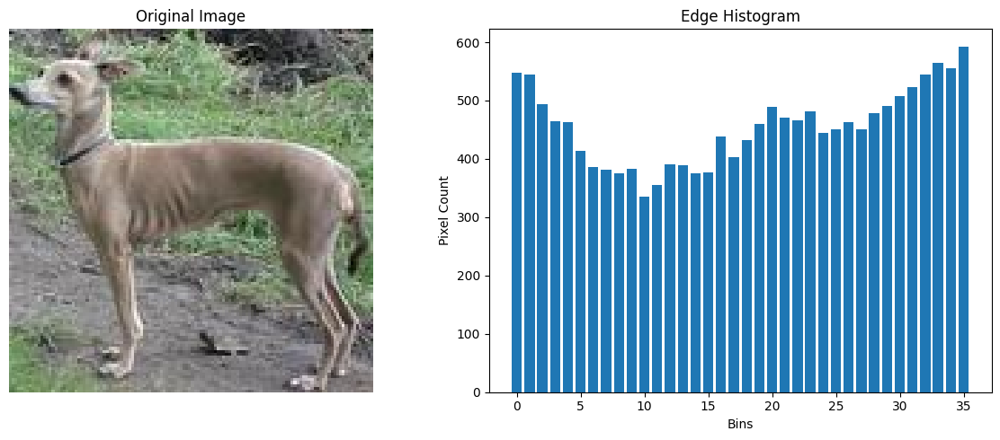

Image 45: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_135_0.jpg


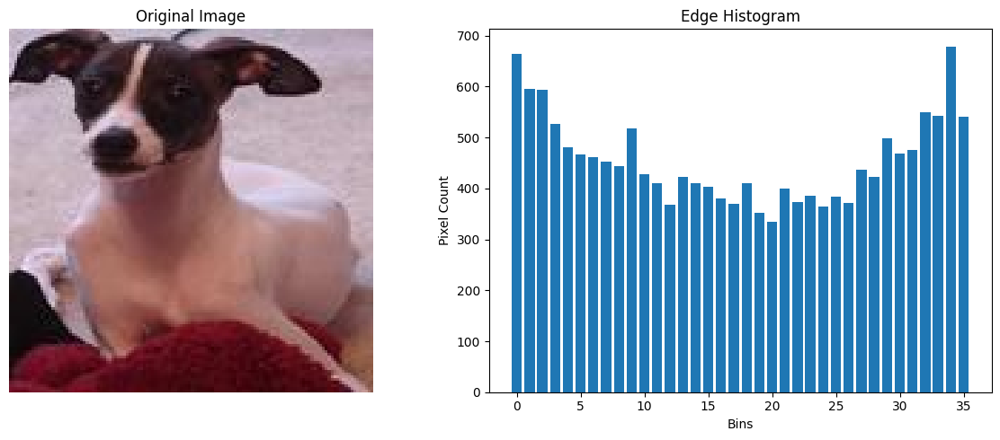

Image 46: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1360_0.jpg


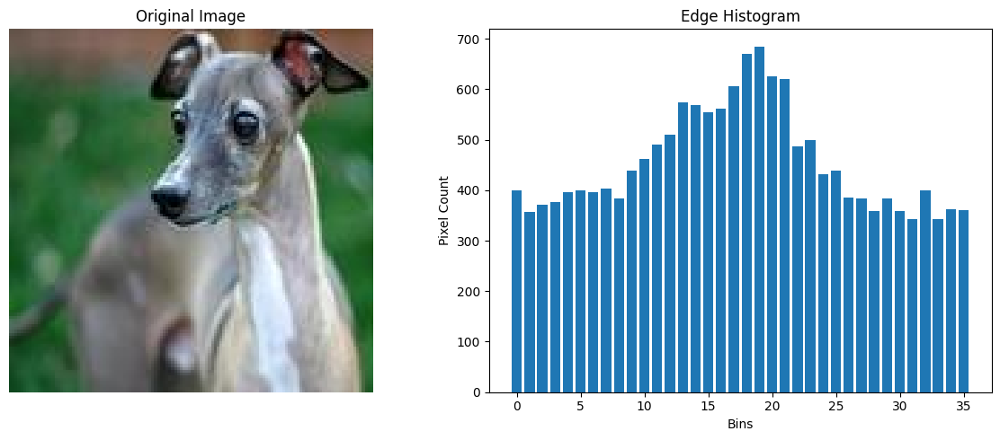

Image 47: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1389_0.jpg


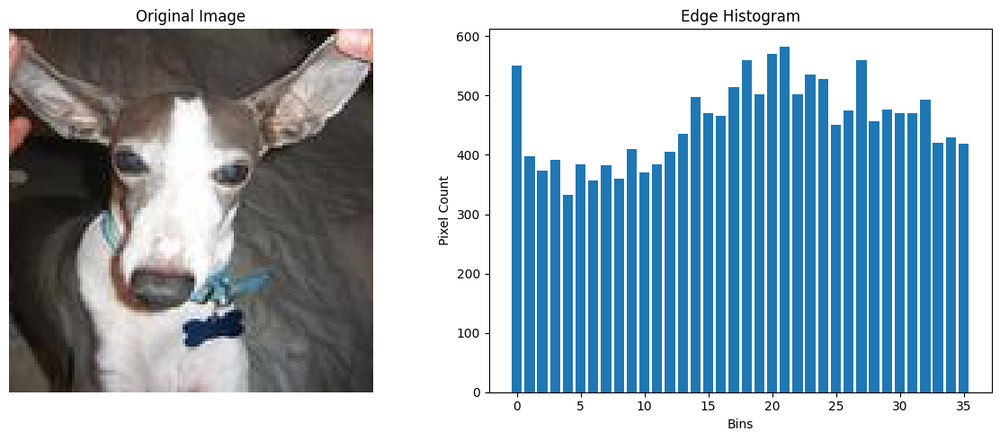

Image 48: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1396_0.jpg


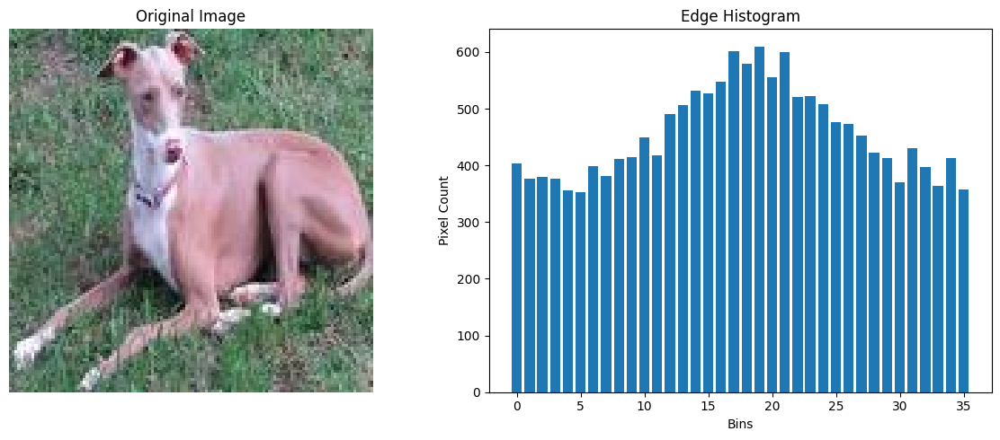

Image 49: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1400_0.jpg


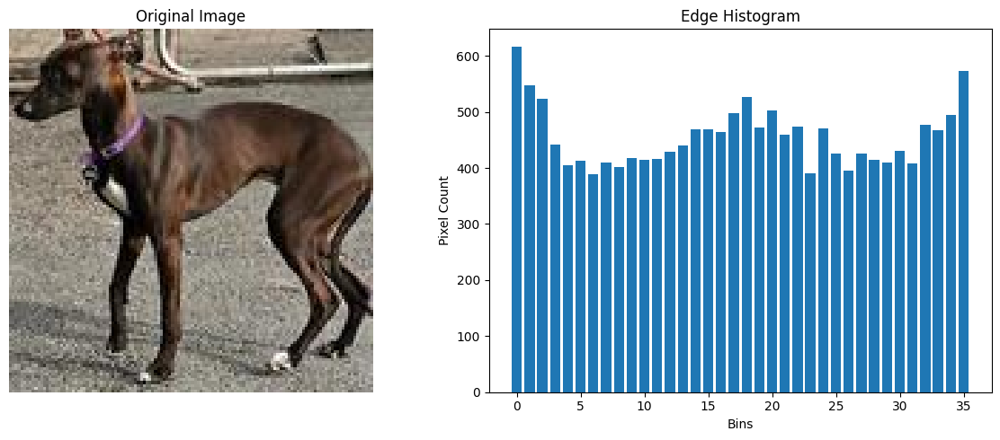

Image 50: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1441_0.jpg


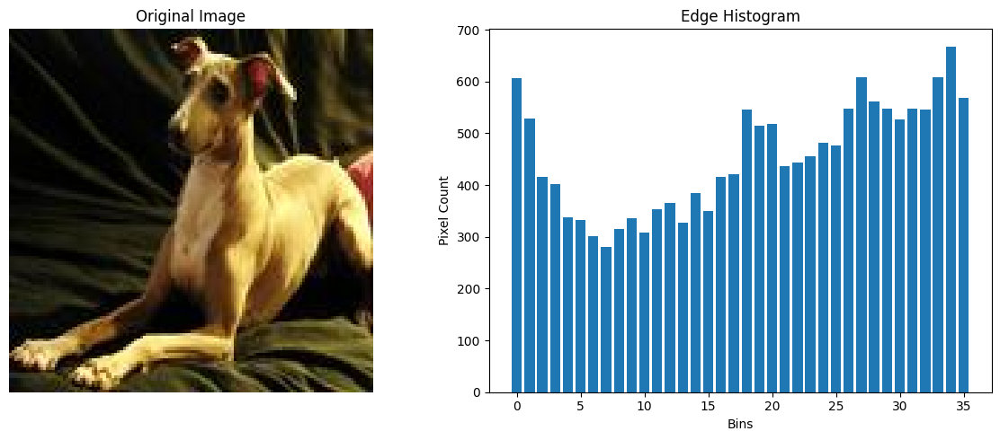

Image 51: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1457_0.jpg


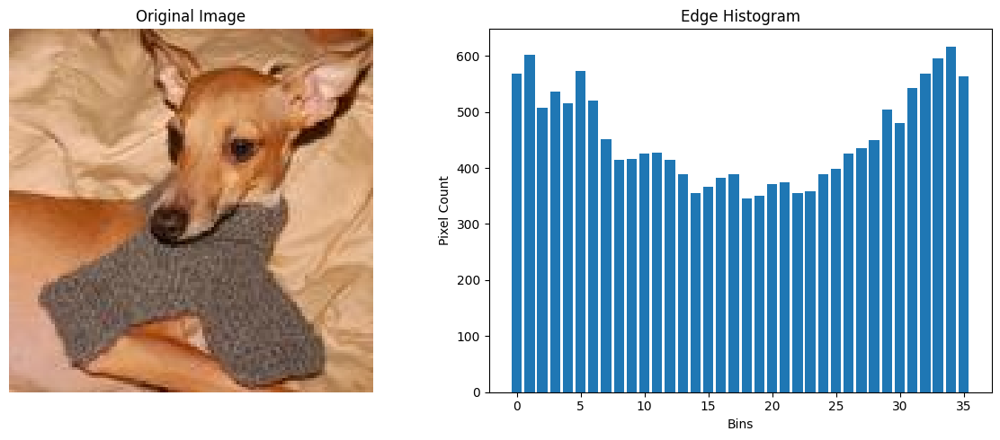

Image 52: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1470_0.jpg


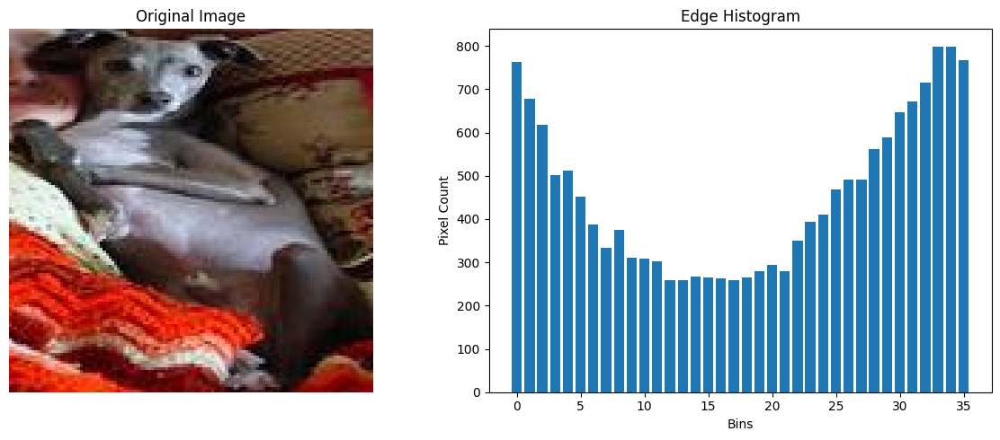

Image 53: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1481_0.jpg


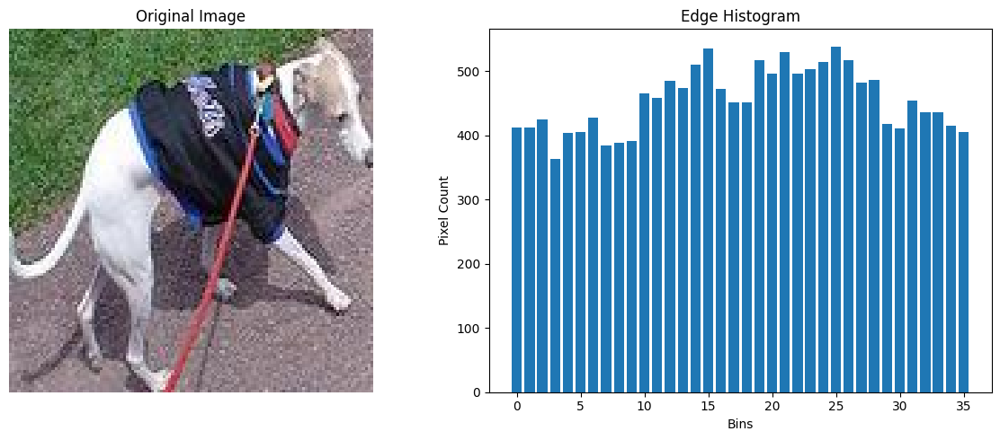

Image 54: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1518_0.jpg


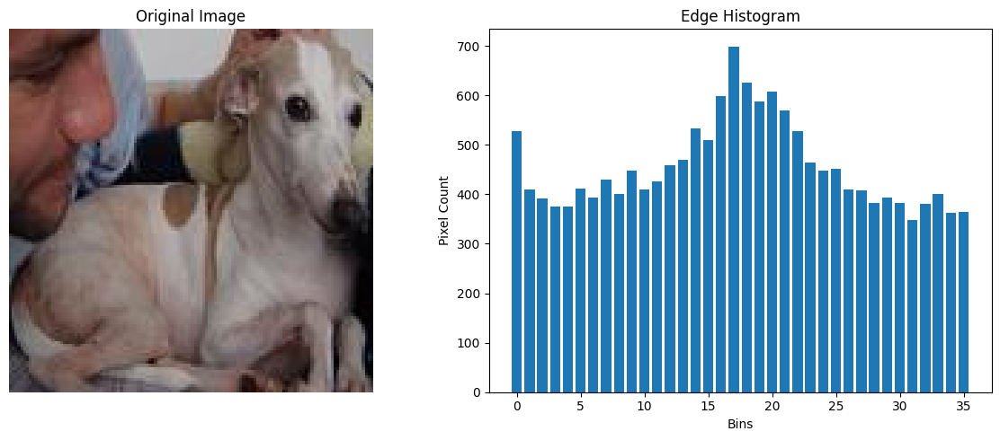

Image 55: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1529_0.jpg


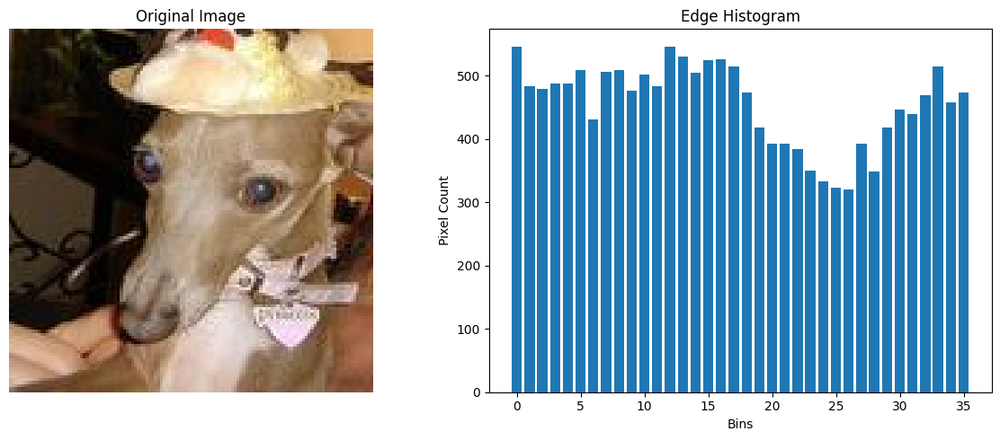

Image 56: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1547_0.jpg


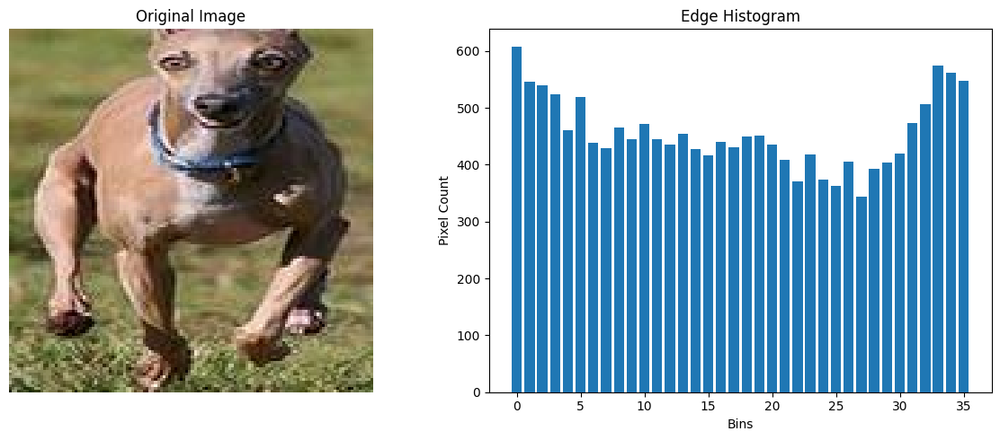

Image 57: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1564_0.jpg


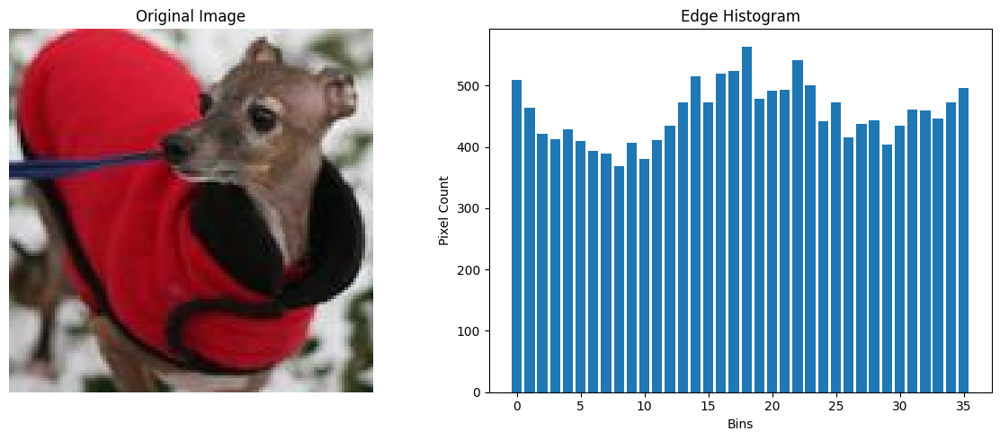

Image 58: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1574_0.jpg


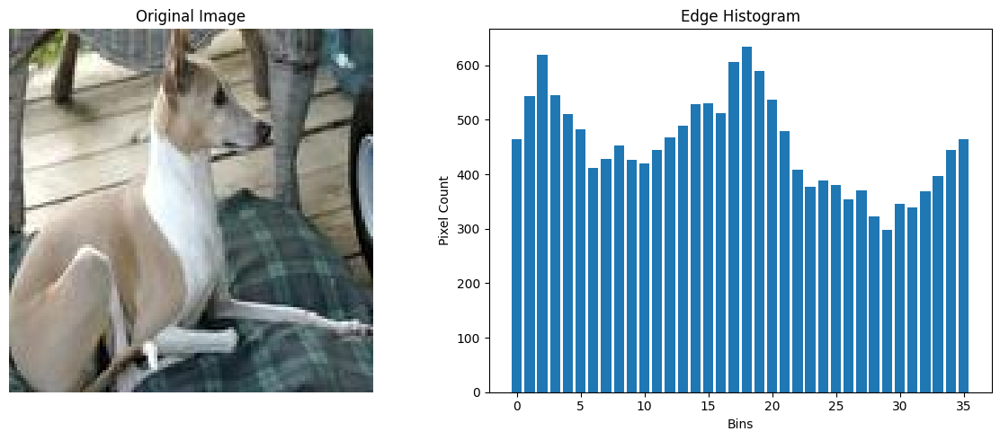

Image 59: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1635_0.jpg


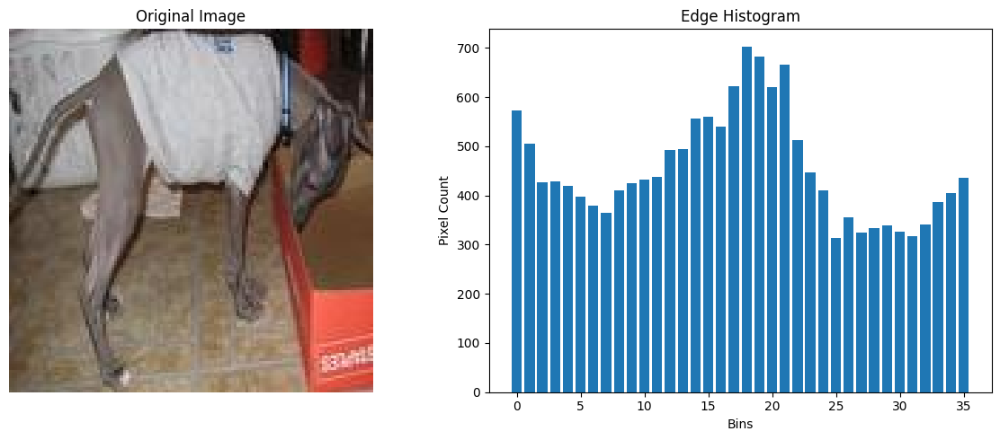

Image 60: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1636_0.jpg


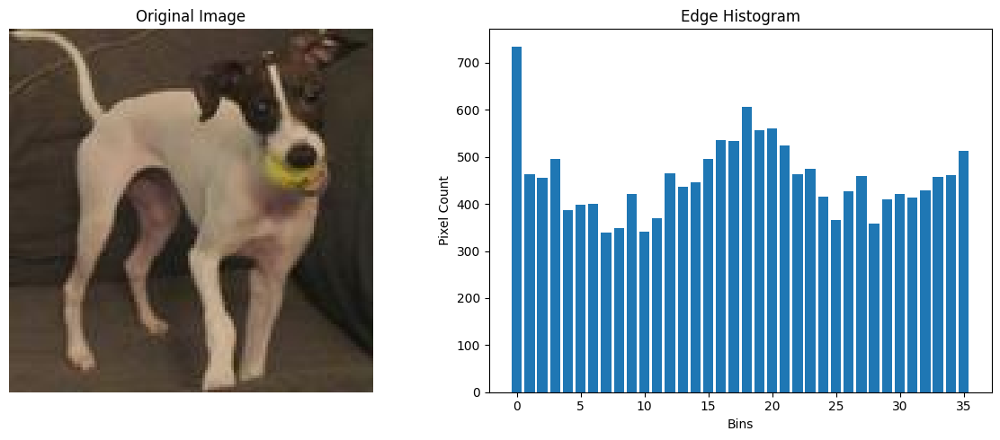

Image 61: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1649_0.jpg


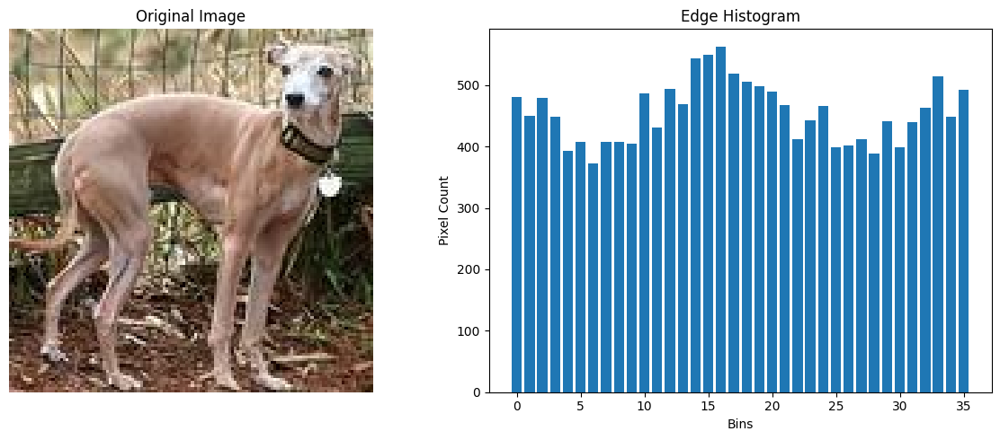

Image 62: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1679_0.jpg


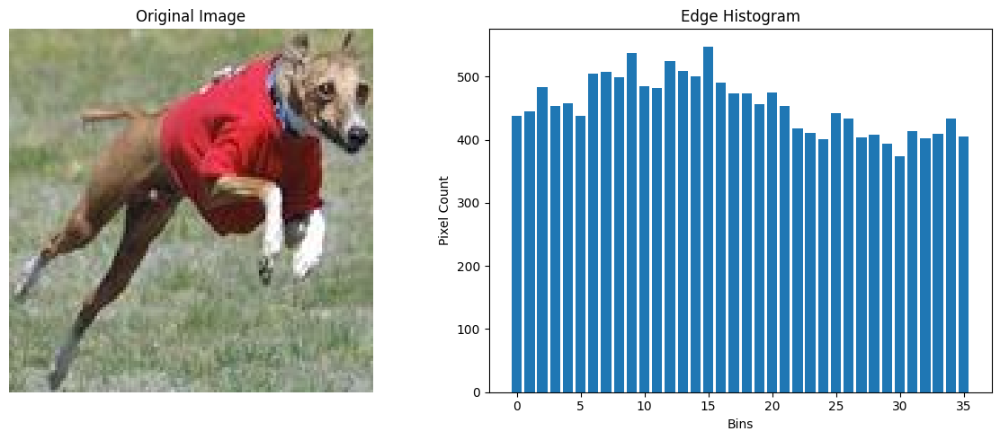

Image 63: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1680_0.jpg


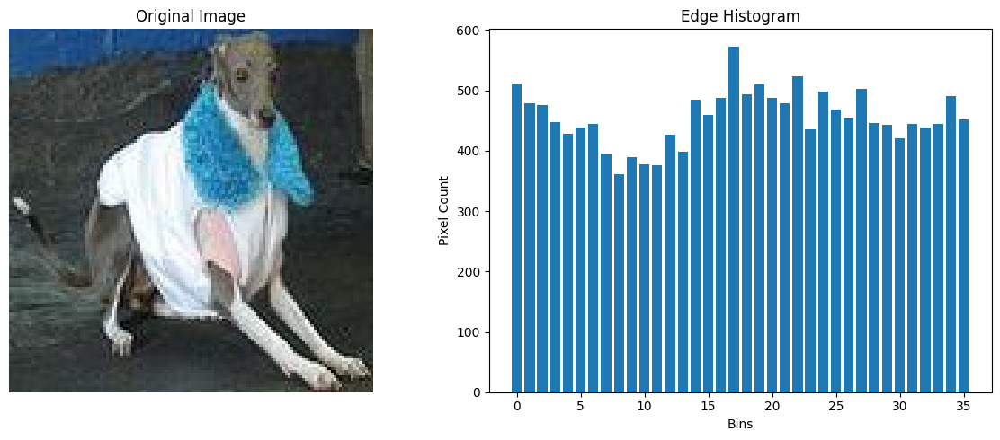

Image 64: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1680_1.jpg


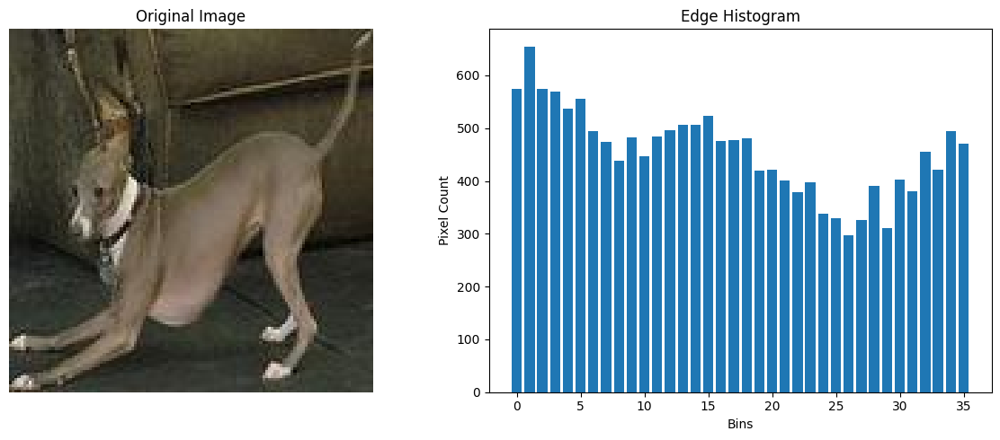

Image 65: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1684_0.jpg


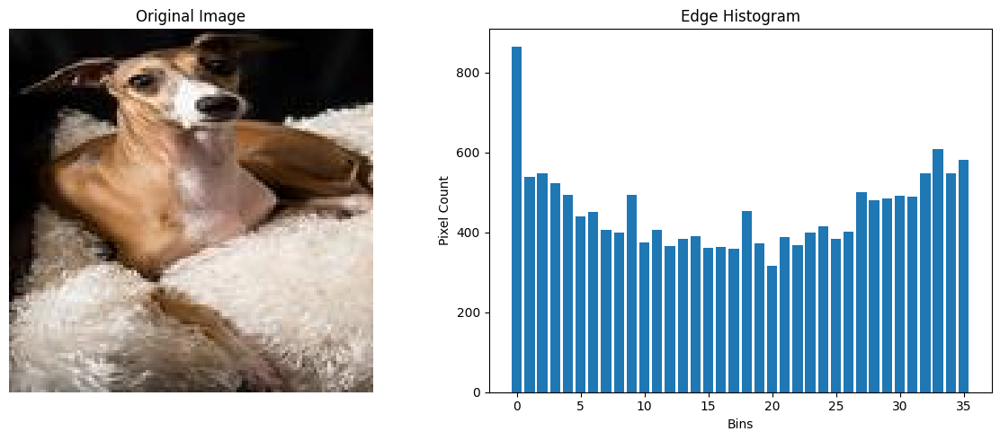

Image 66: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1690_0.jpg


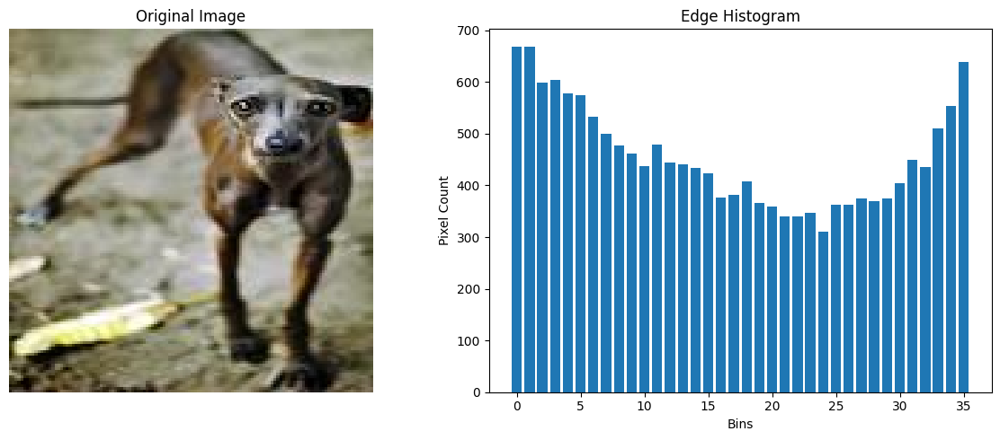

Image 67: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1743_0.jpg


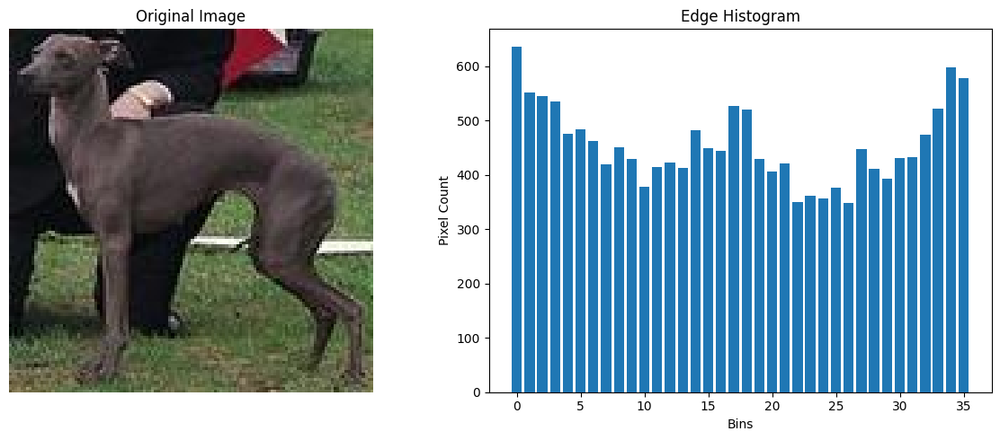

Image 68: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1743_1.jpg


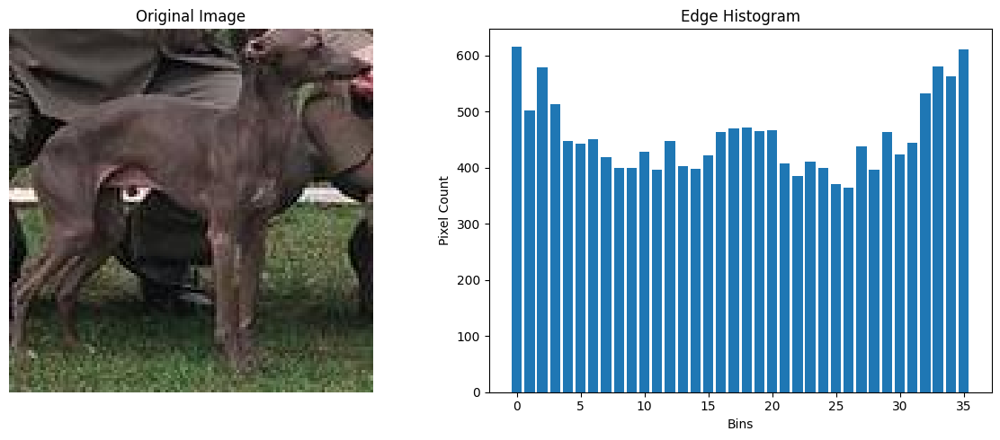

Image 69: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1773_0.jpg


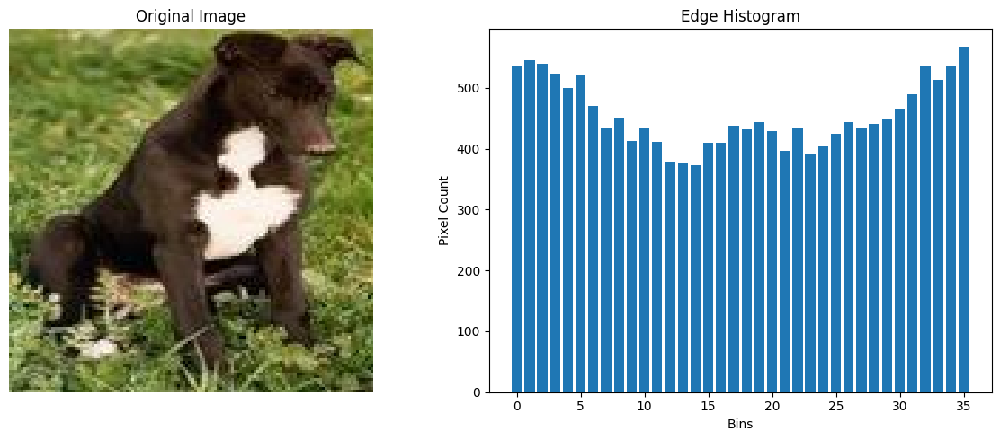

Image 70: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1783_0.jpg


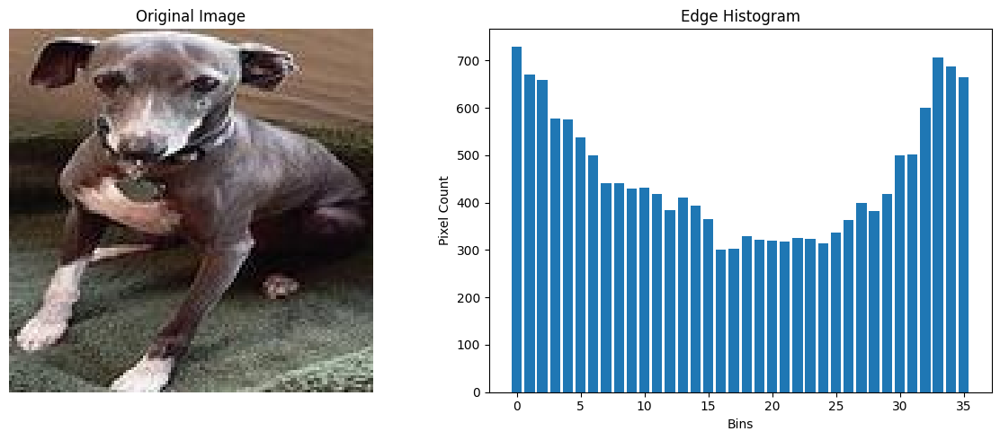

Image 71: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1884_0.jpg


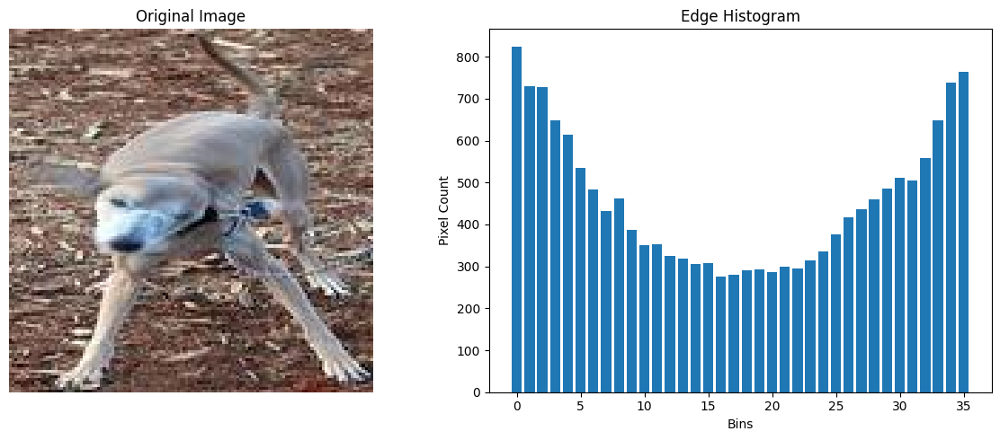

Image 72: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1894_0.jpg


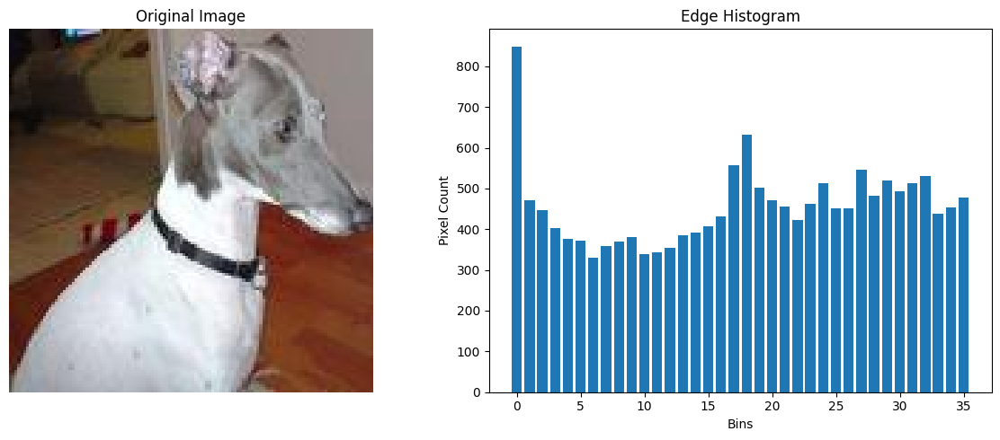

Image 73: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_18_0.jpg


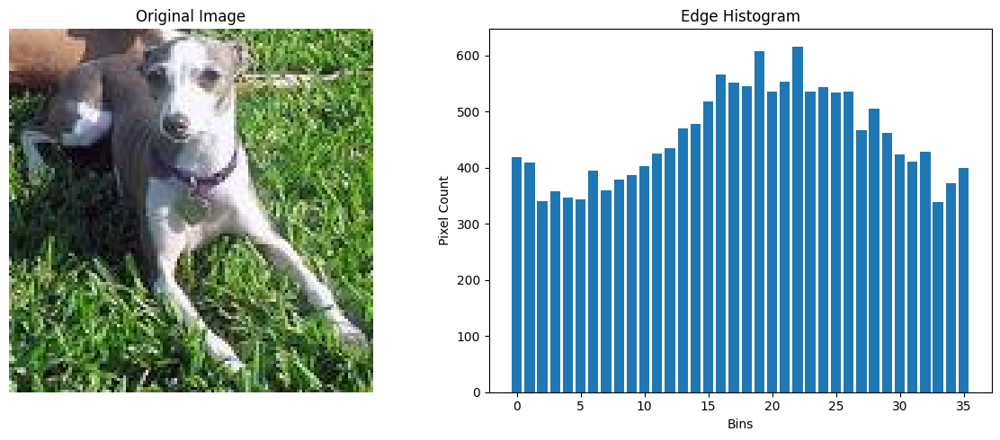

Image 74: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_18_1.jpg


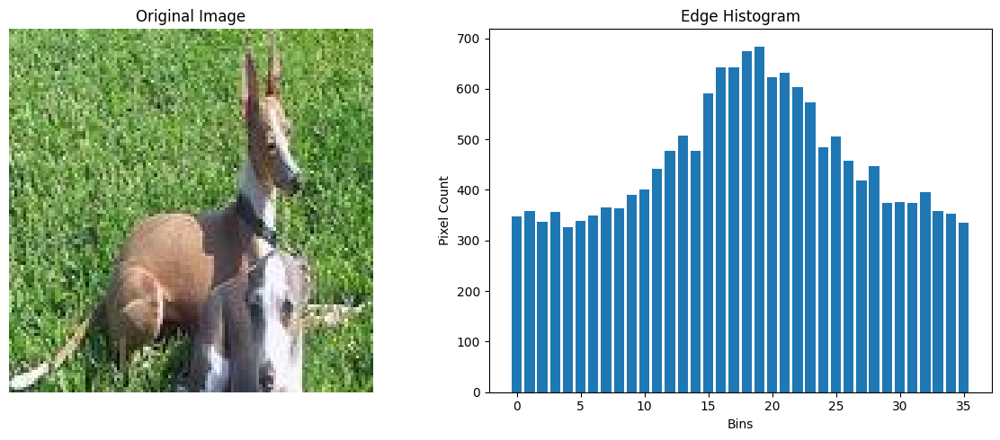

Image 75: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1918_0.jpg


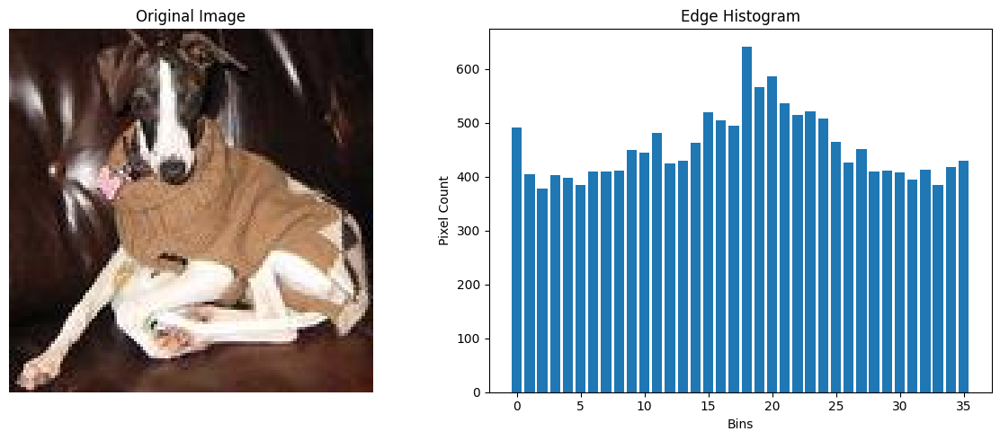

Image 76: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_1933_0.jpg


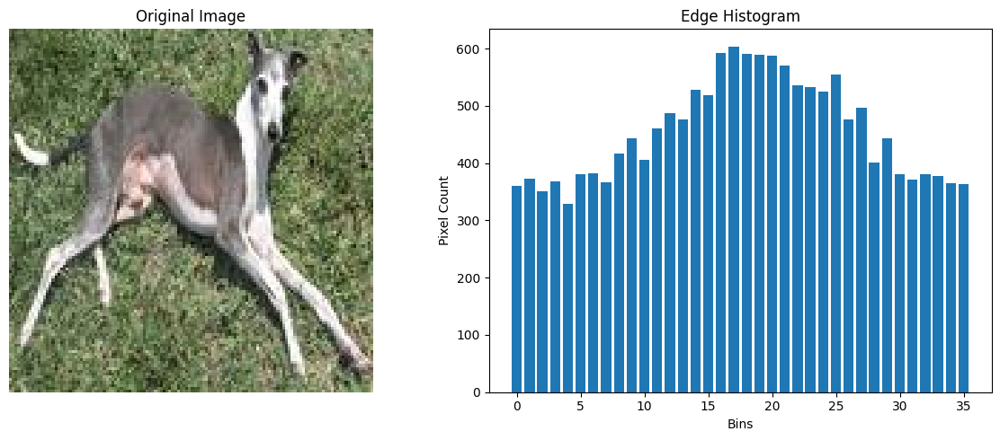

Image 77: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_20_0.jpg


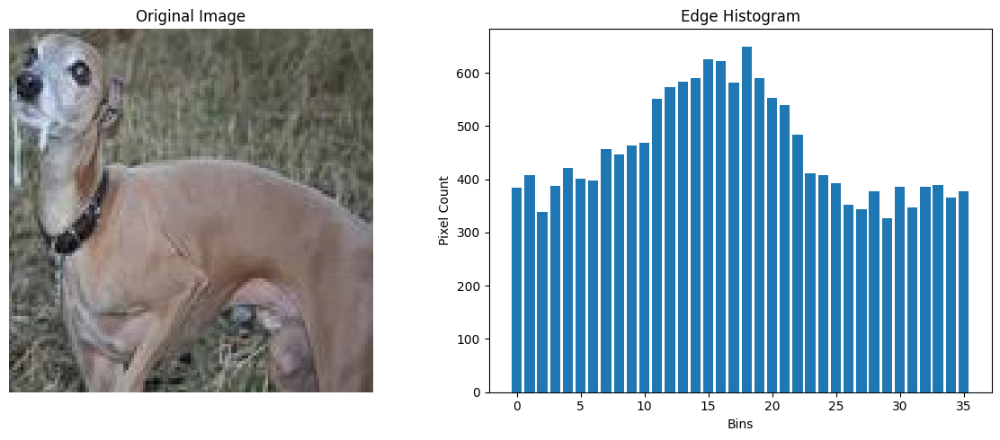

Image 78: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_212_0.jpg


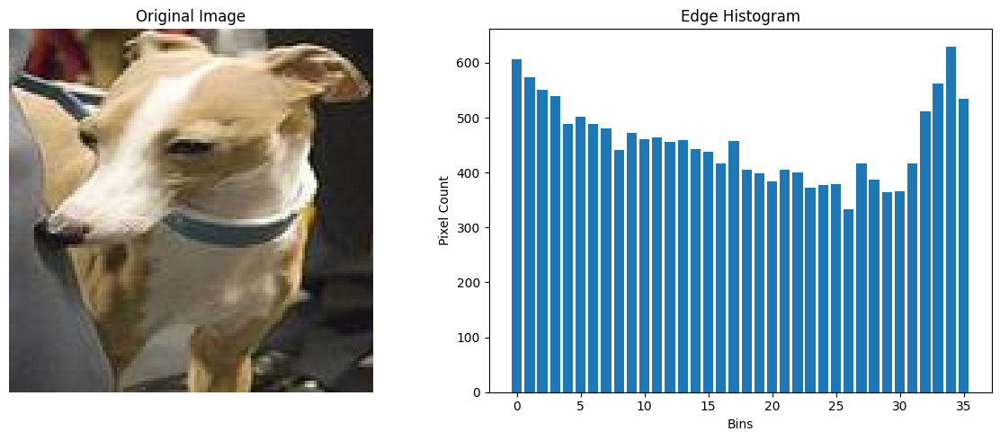

Image 79: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_212_1.jpg


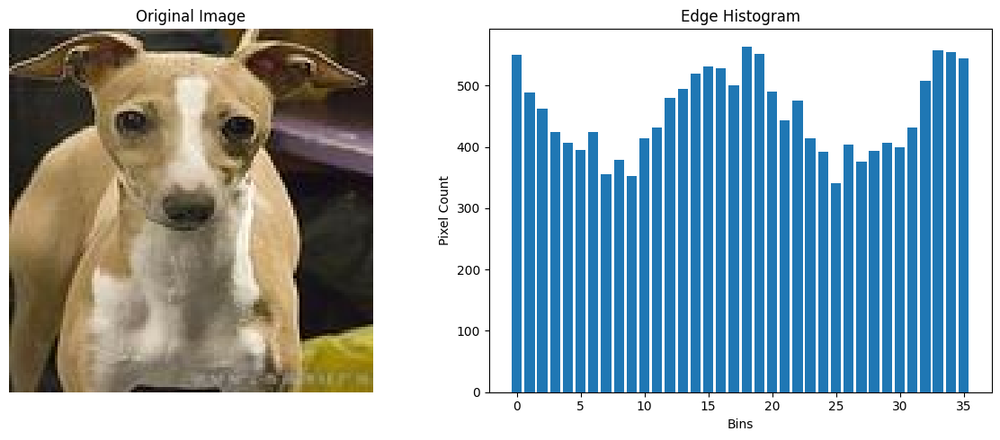

Image 80: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_2178_0.jpg


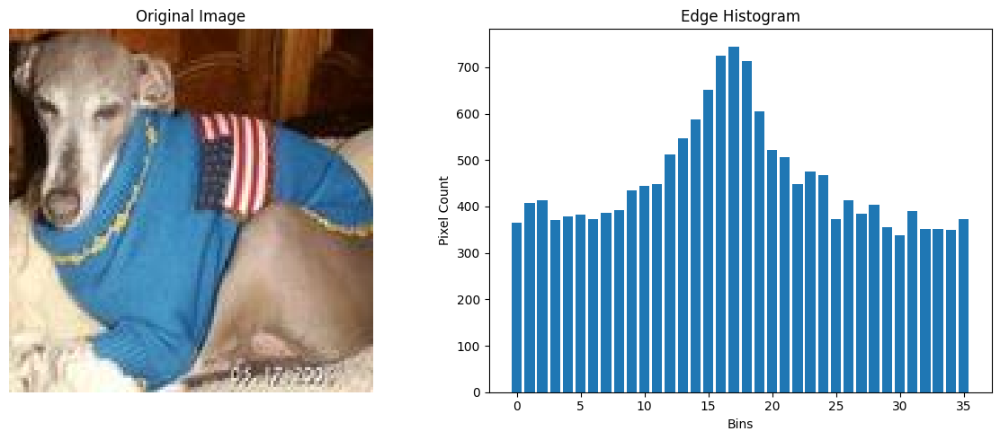

Image 81: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_2180_0.jpg


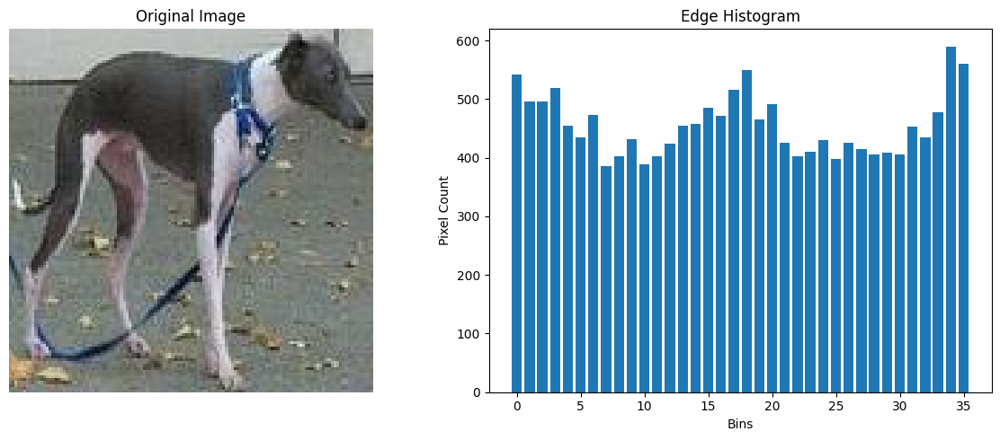

Image 82: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_2472_0.jpg


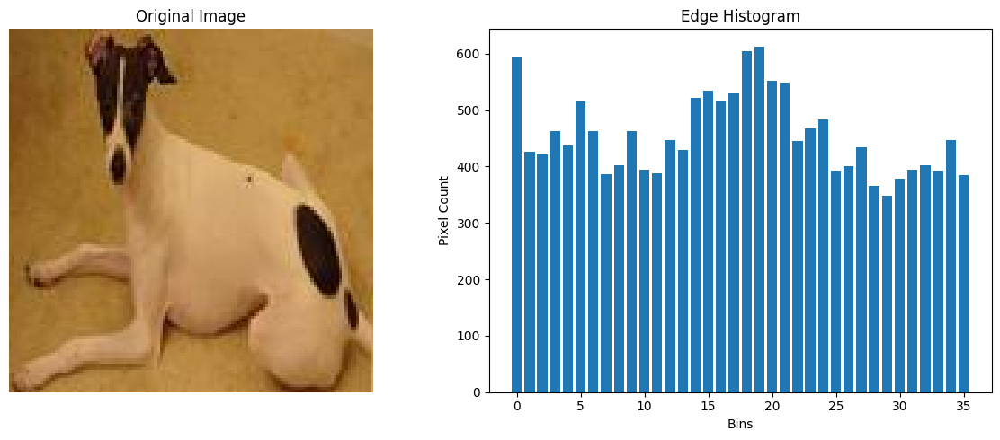

Image 83: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_256_0.jpg


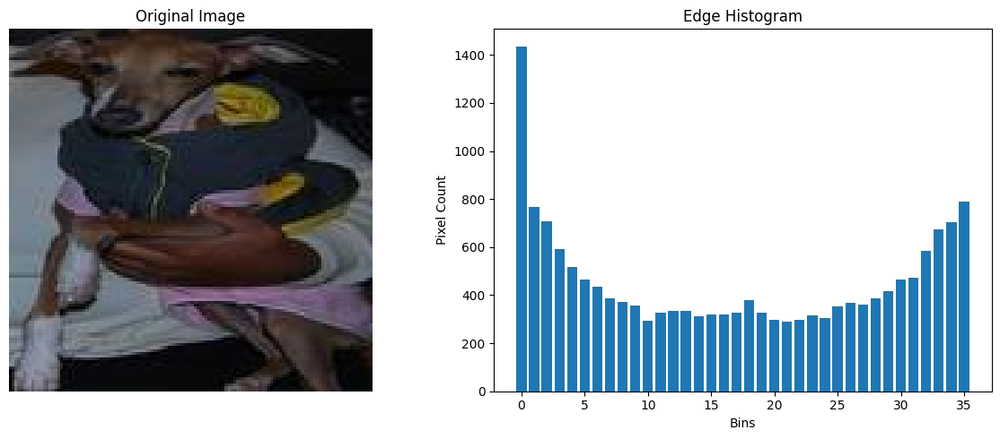

Image 84: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_2687_0.jpg


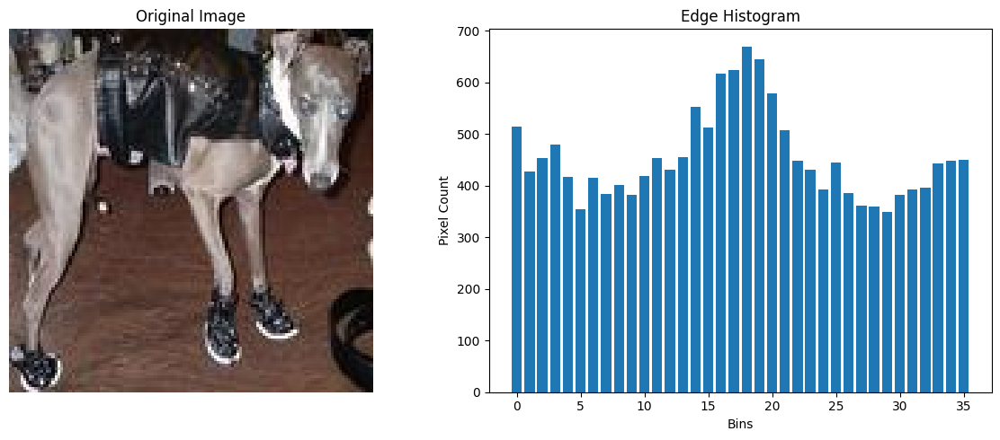

Image 85: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3050_0.jpg


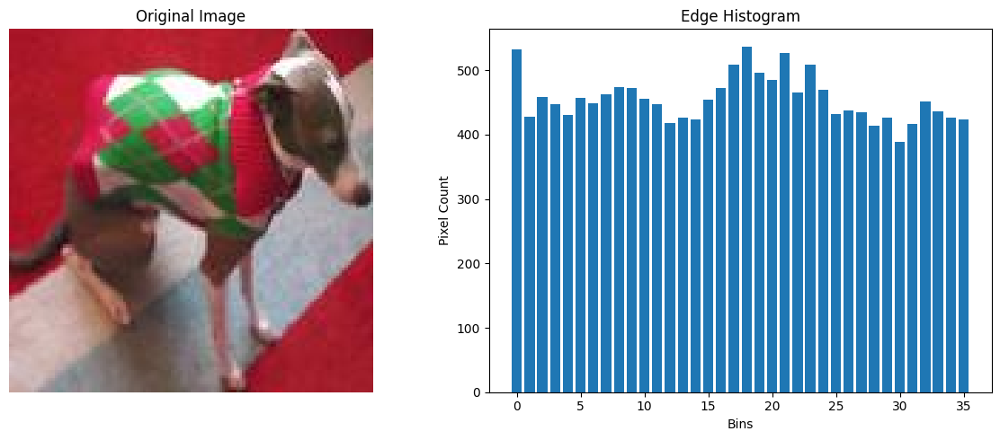

Image 86: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_309_0.jpg


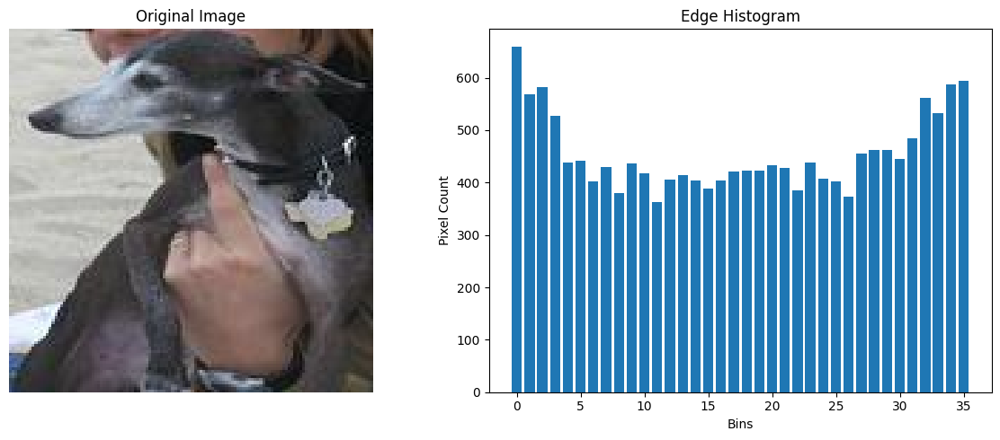

Image 87: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3213_0.jpg


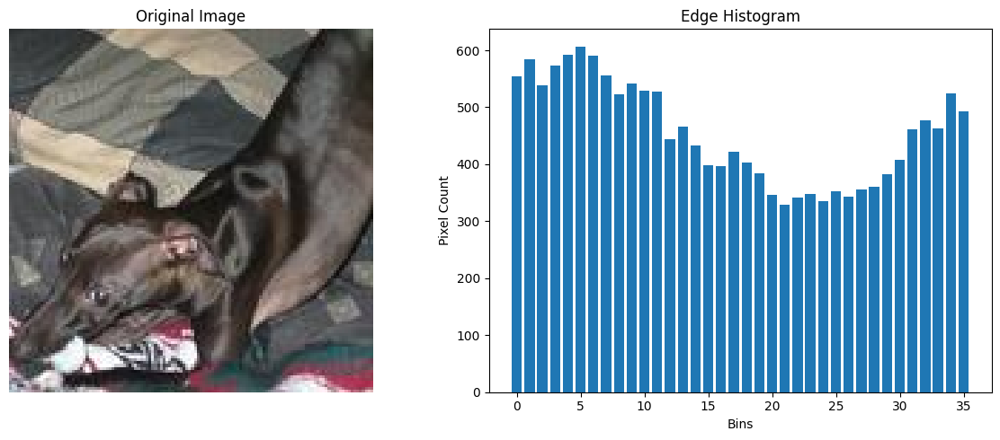

Image 88: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3277_0.jpg


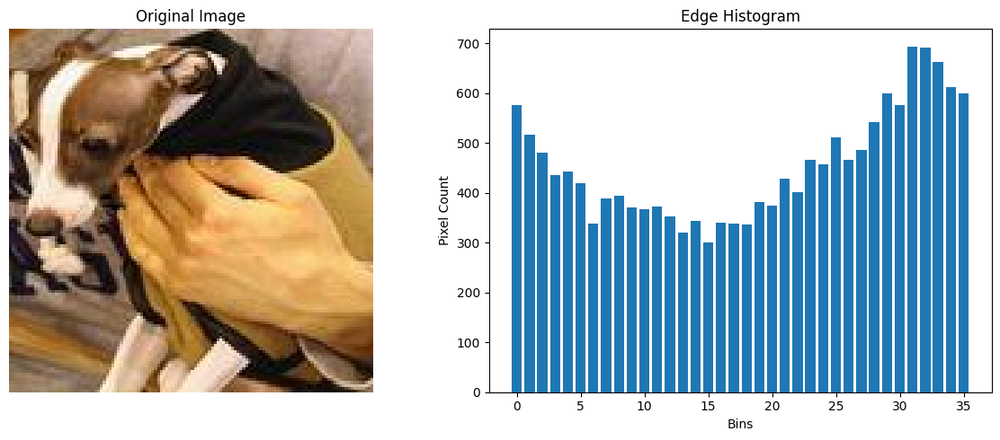

Image 89: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3277_1.jpg


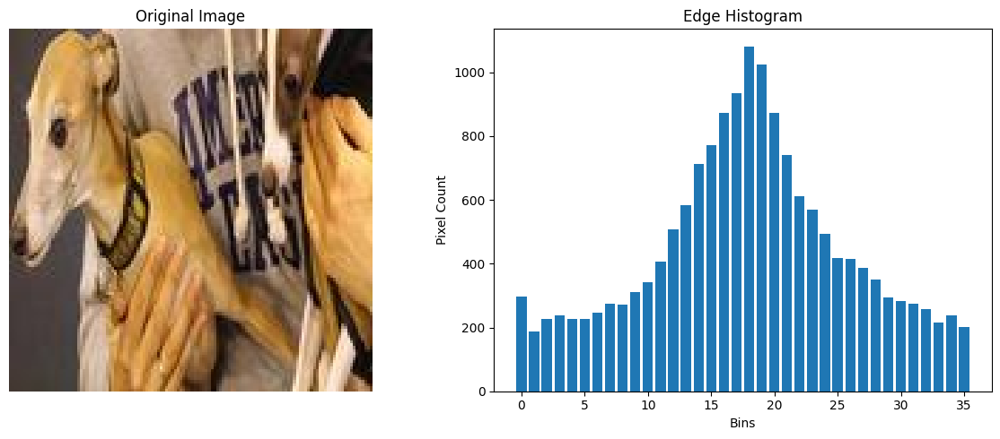

Image 90: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_334_0.jpg


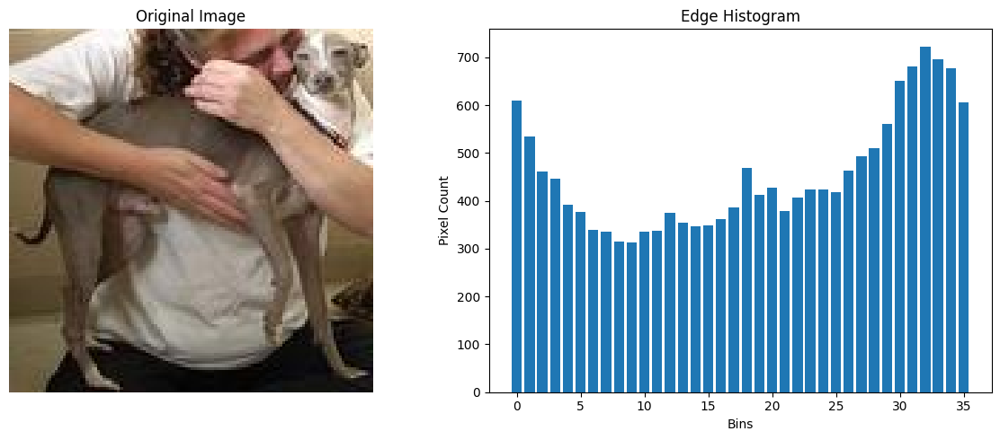

Image 91: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3470_0.jpg


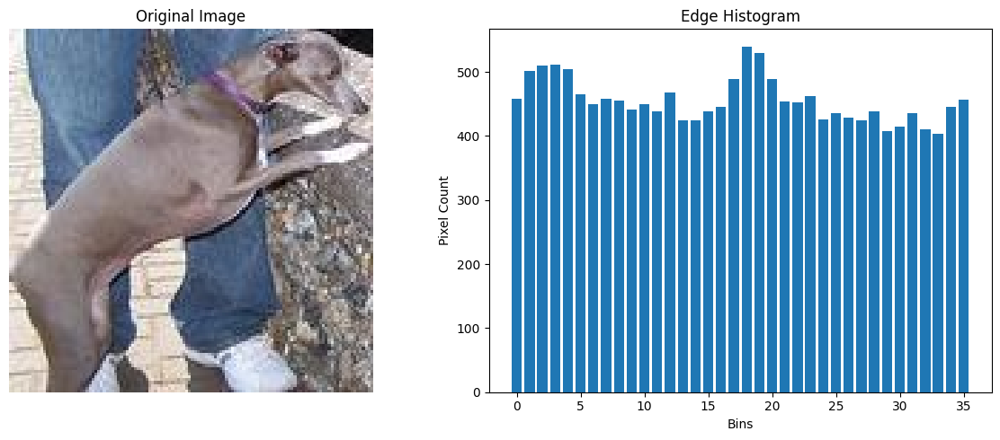

Image 92: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_347_0.jpg


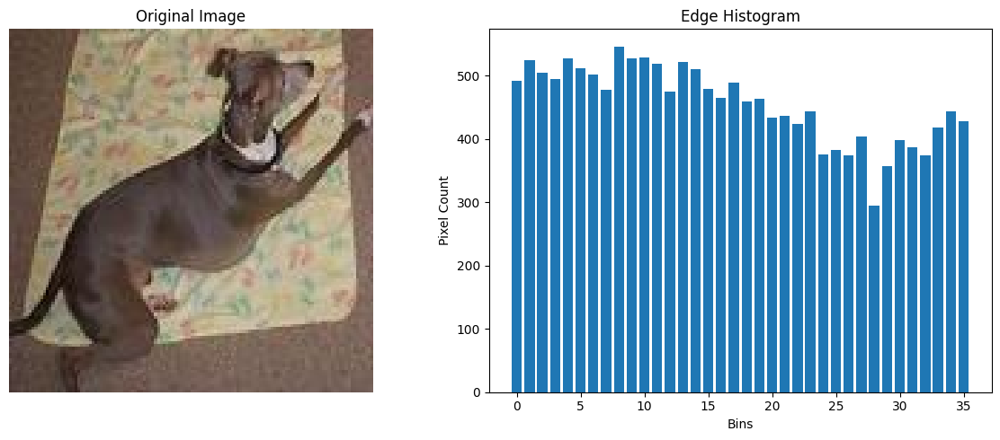

Image 93: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_347_1.jpg


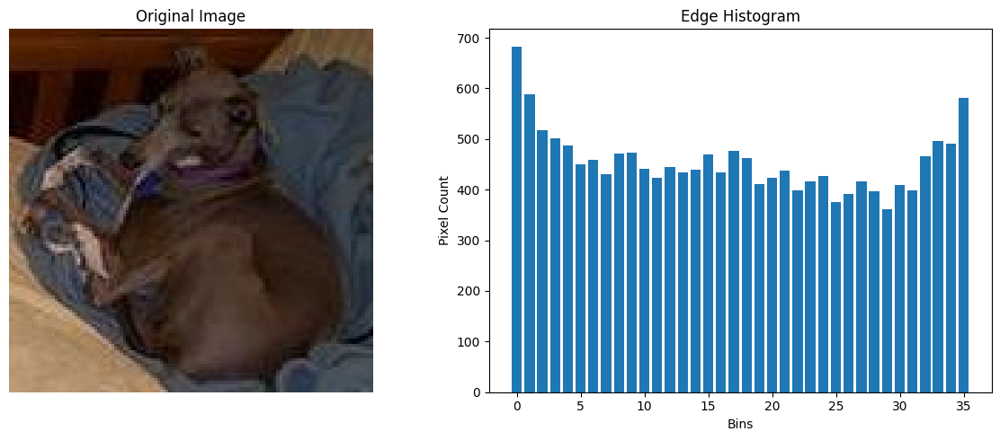

Image 94: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3564_0.jpg


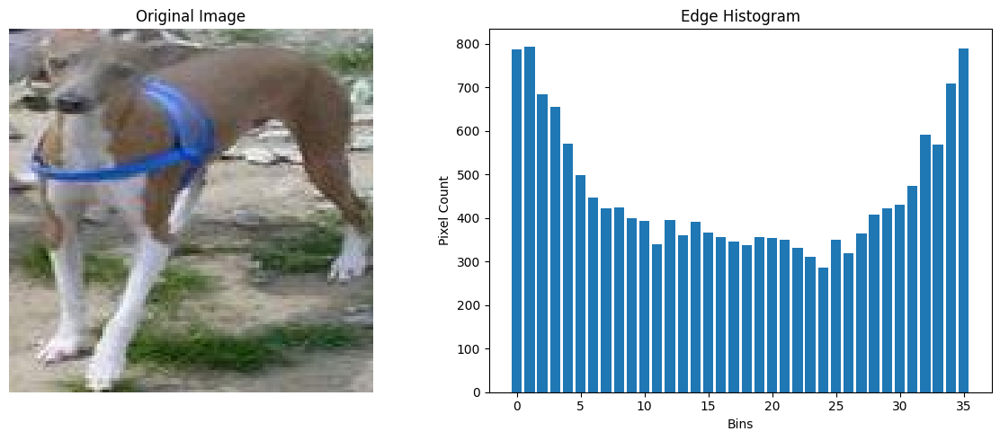

Image 95: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3564_1.jpg


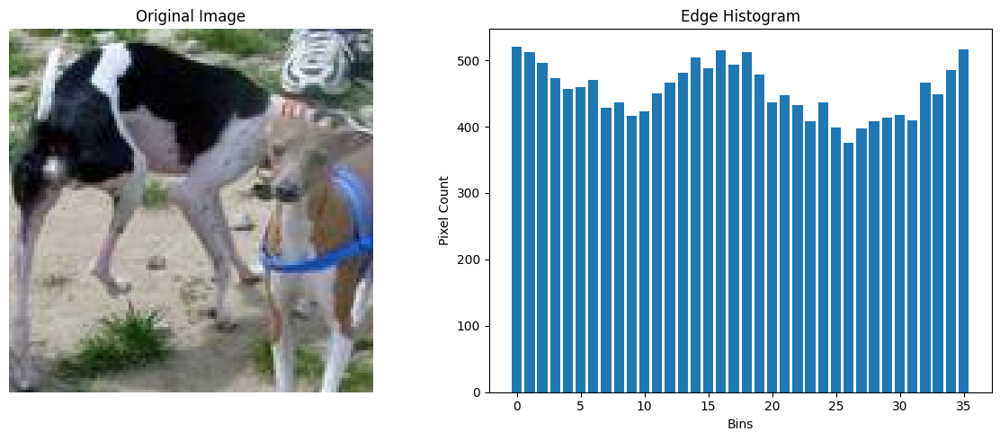

Image 96: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3564_2.jpg


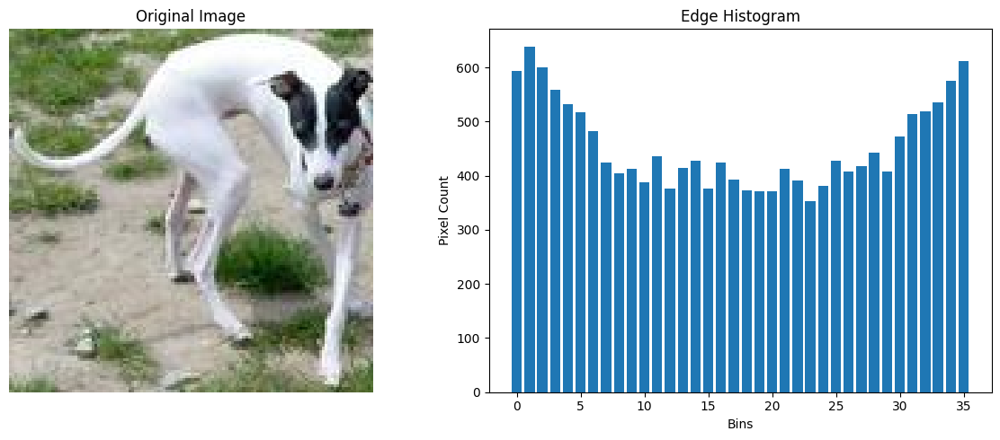

Image 97: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_358_0.jpg


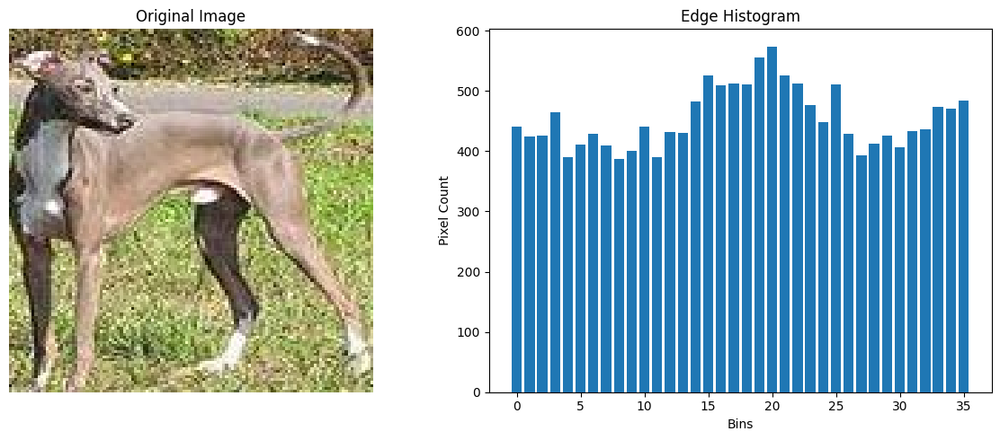

Image 98: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_36_0.jpg


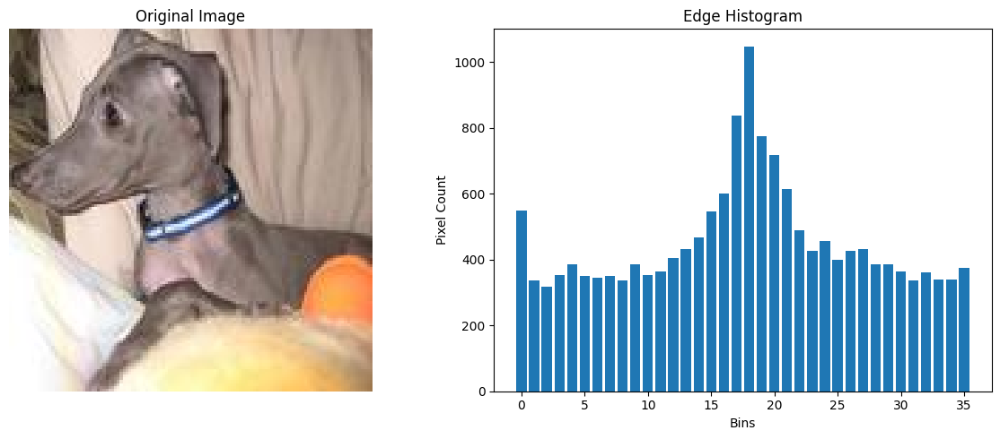

Image 99: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_372_0.jpg


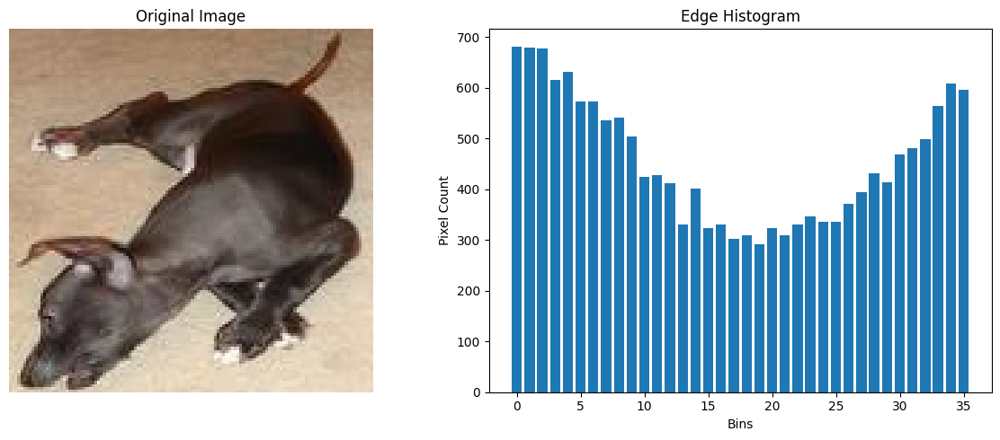

Image 100: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3763_0.jpg


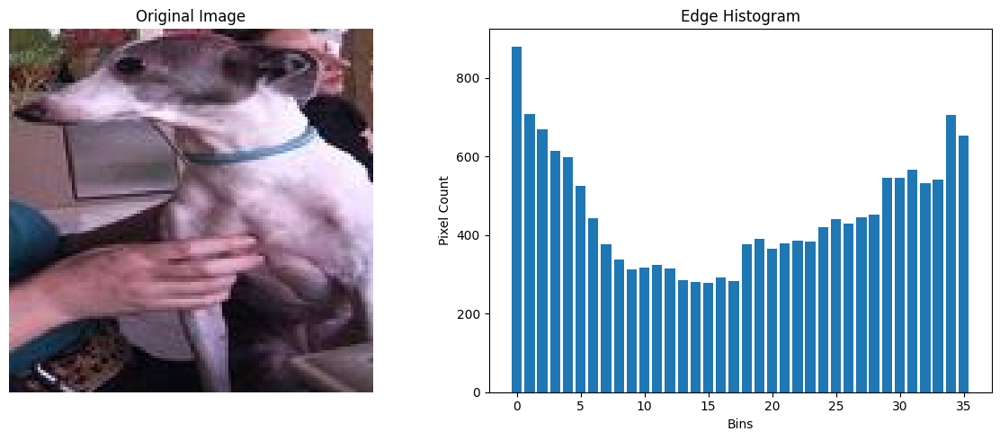

Image 101: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_378_0.jpg


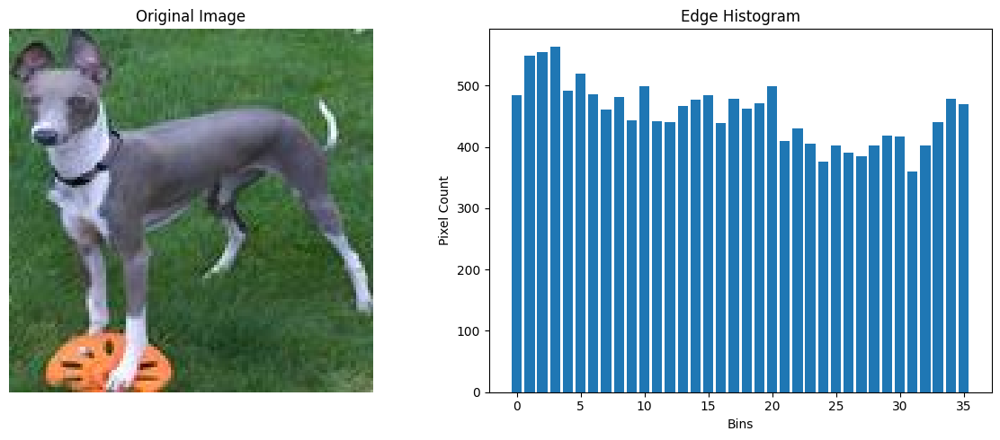

Image 102: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3875_0.jpg


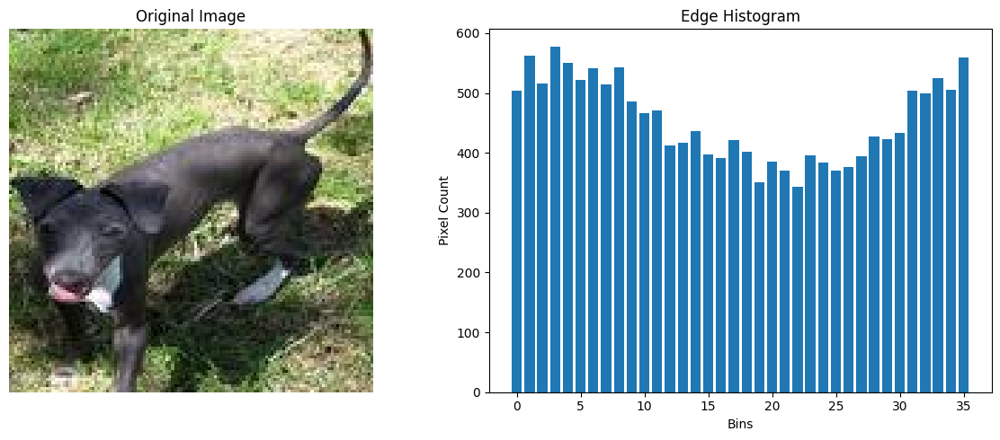

Image 103: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3886_0.jpg


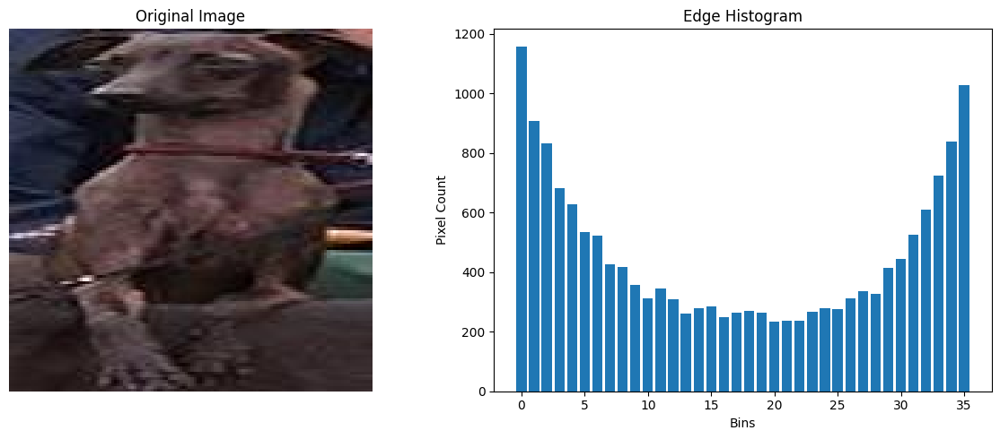

Image 104: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3886_1.jpg


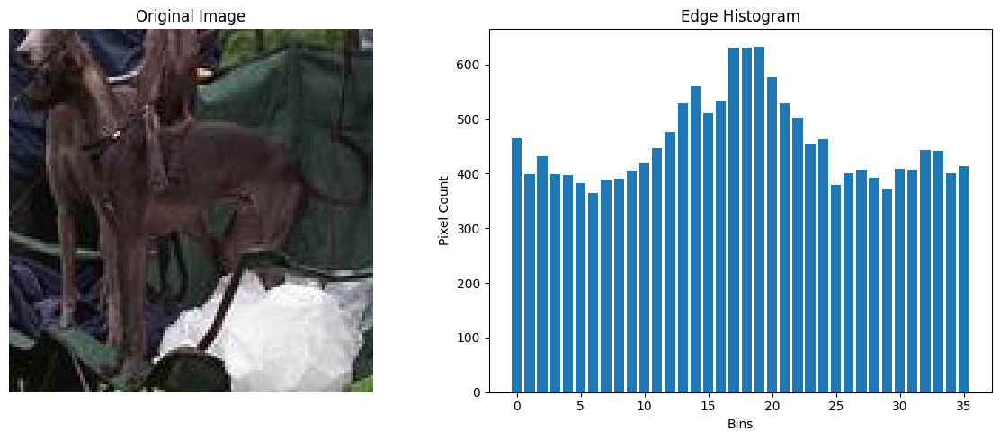

Image 105: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3886_2.jpg


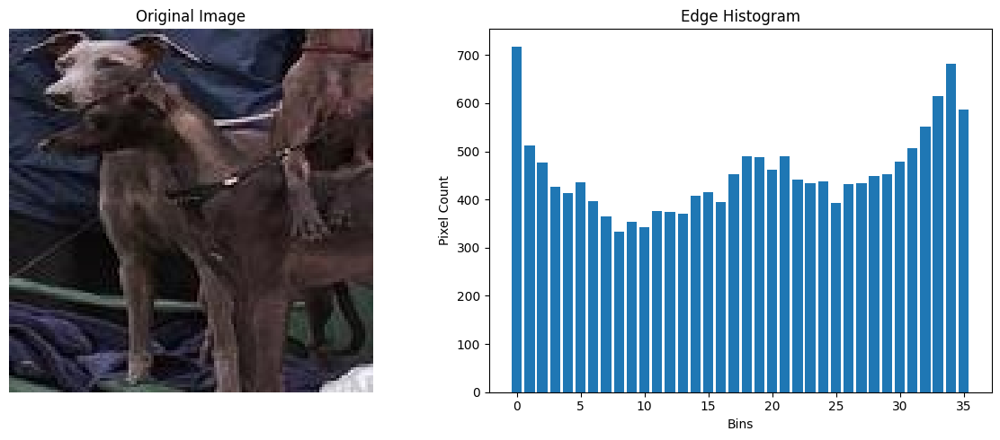

Image 106: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3886_3.jpg


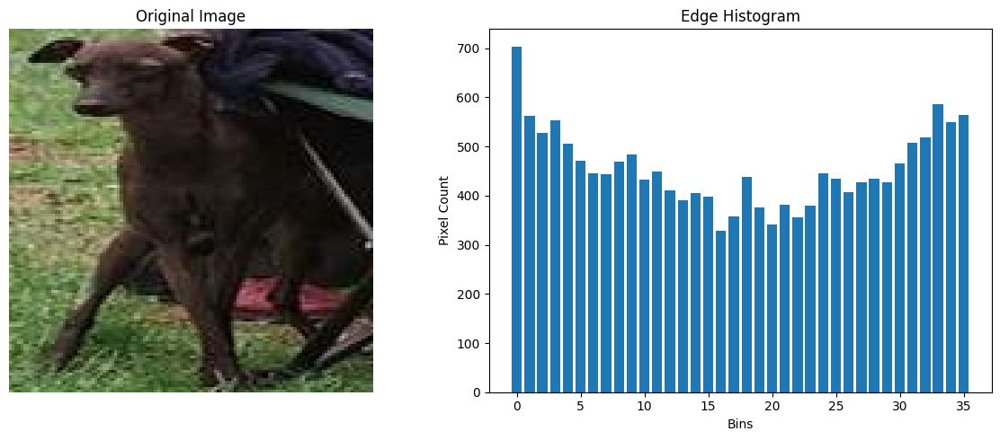

Image 107: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3965_0.jpg


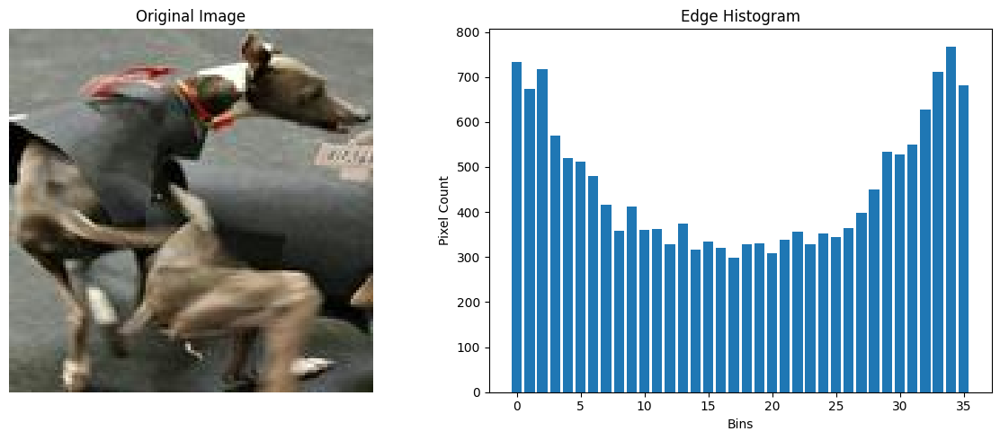

Image 108: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_3965_1.jpg


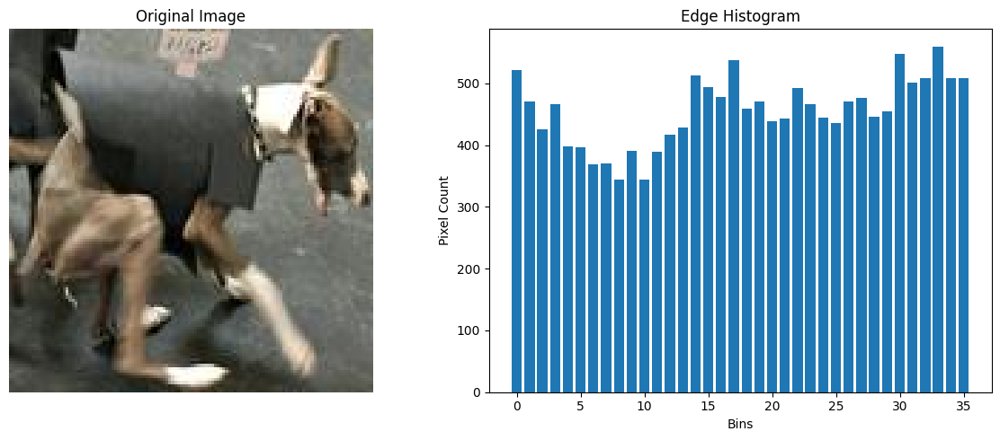

Image 109: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4004_0.jpg


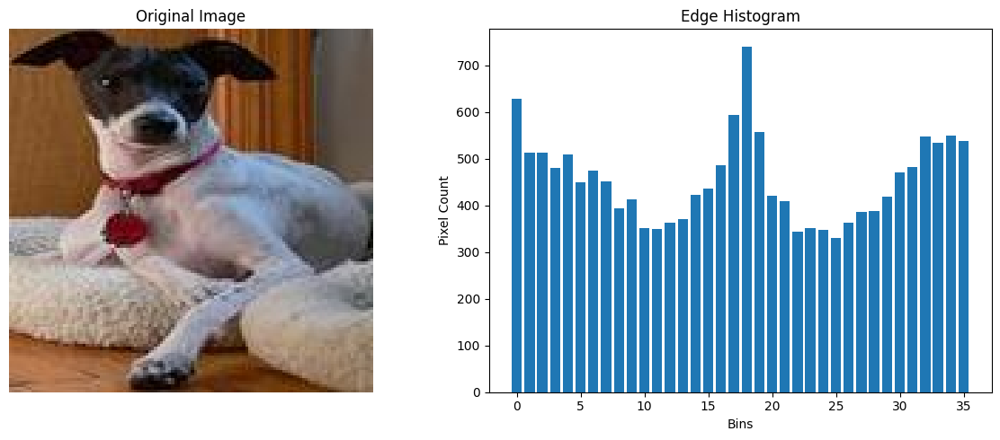

Image 110: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4004_1.jpg


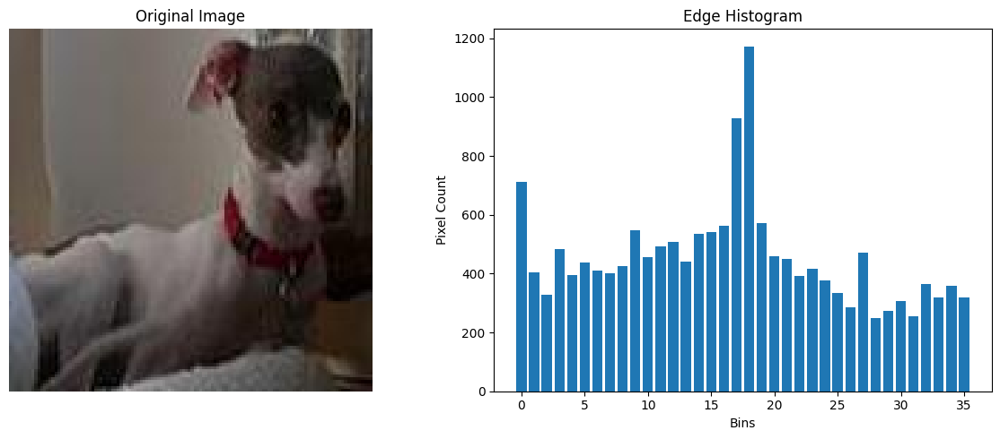

Image 111: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4012_0.jpg


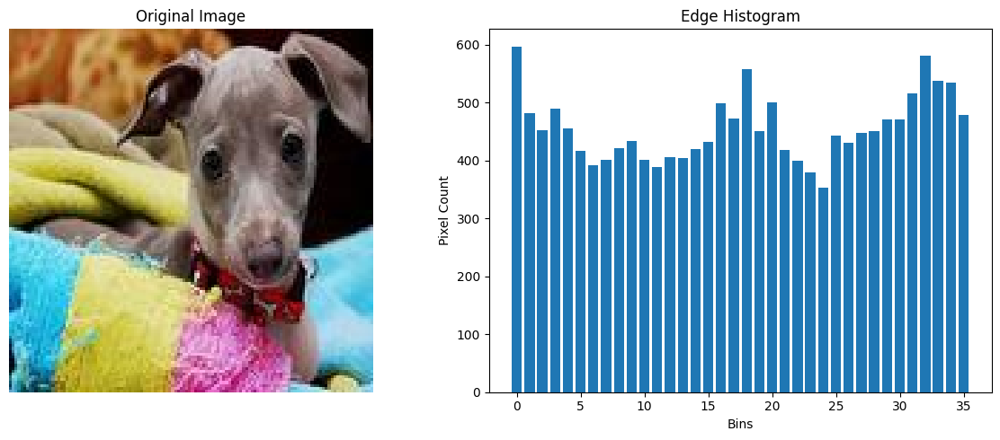

Image 112: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4087_0.jpg


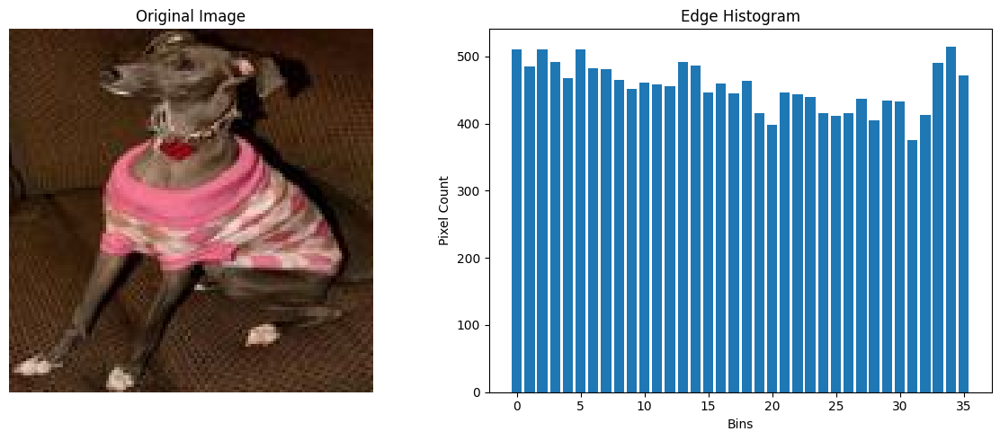

Image 113: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4210_0.jpg


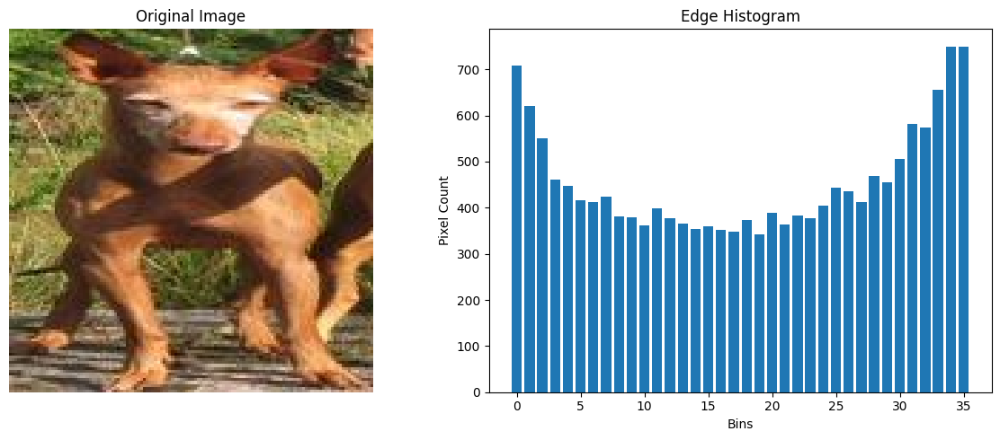

Image 114: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4210_1.jpg


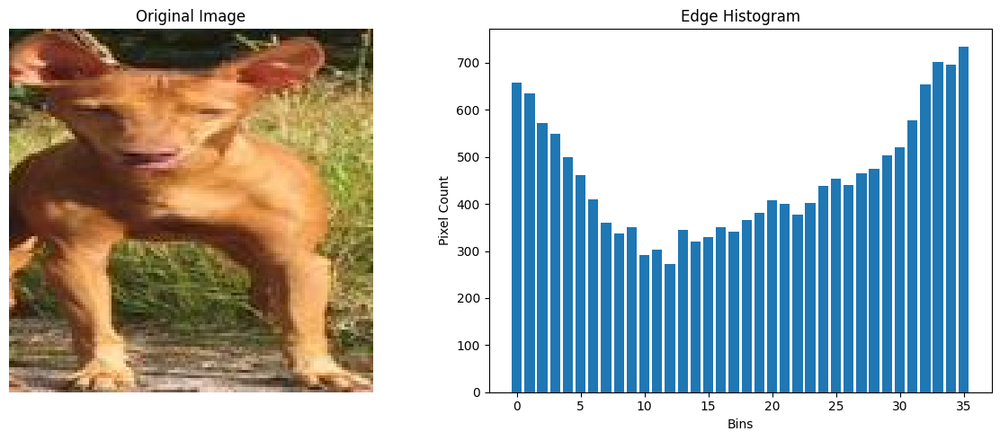

Image 115: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4245_0.jpg


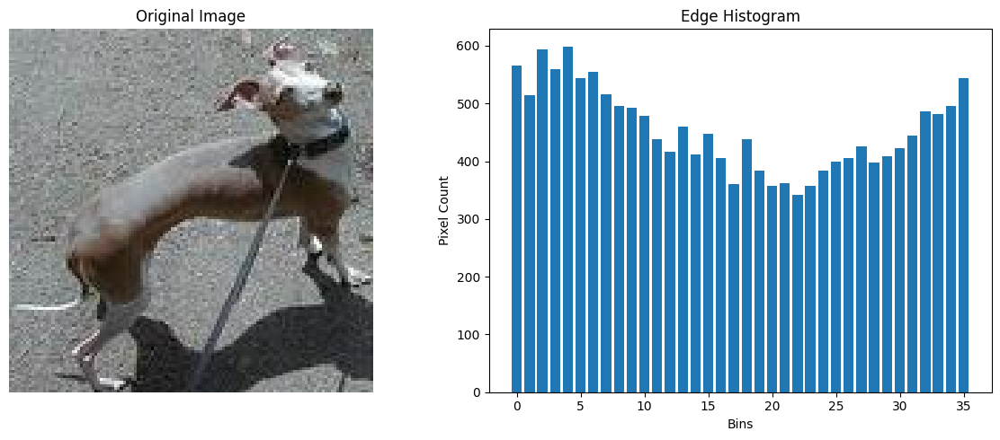

Image 116: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4323_0.jpg


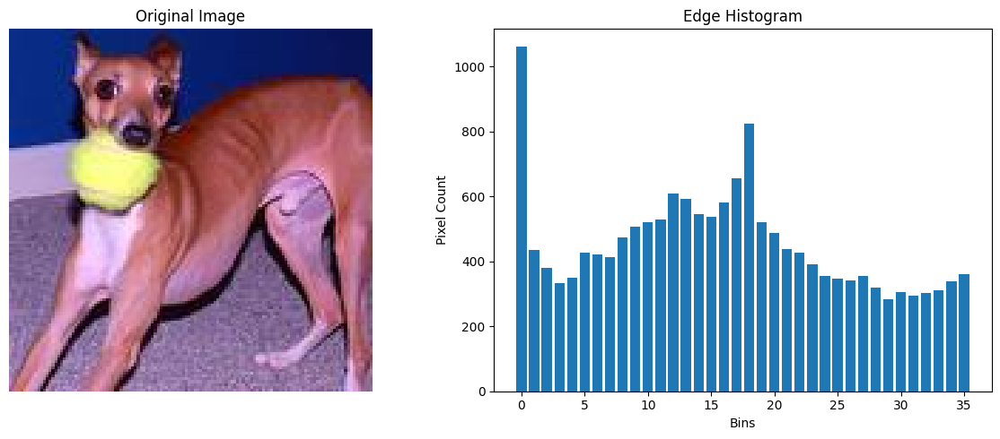

Image 117: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4458_0.jpg


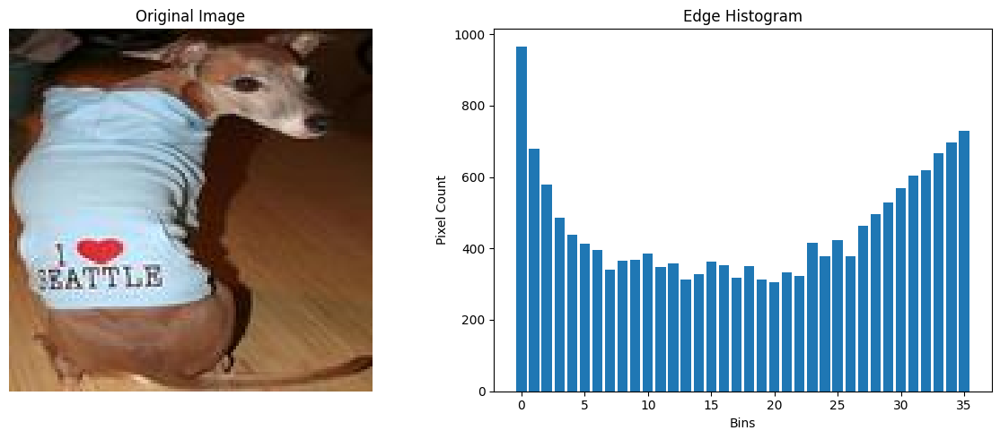

Image 118: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_458_0.jpg


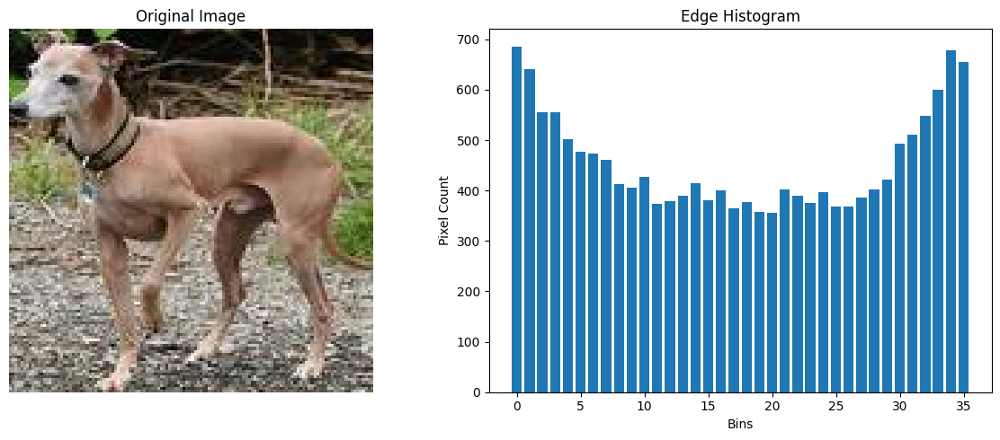

Image 119: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4653_0.jpg


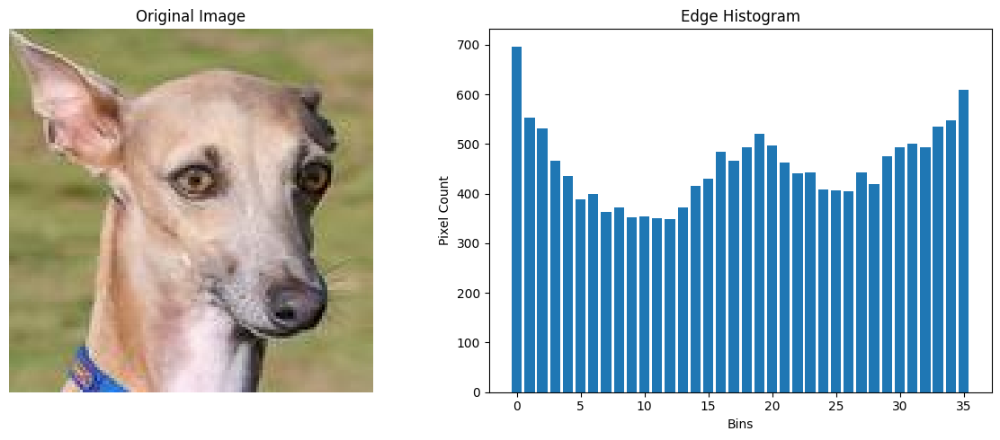

Image 120: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4659_0.jpg


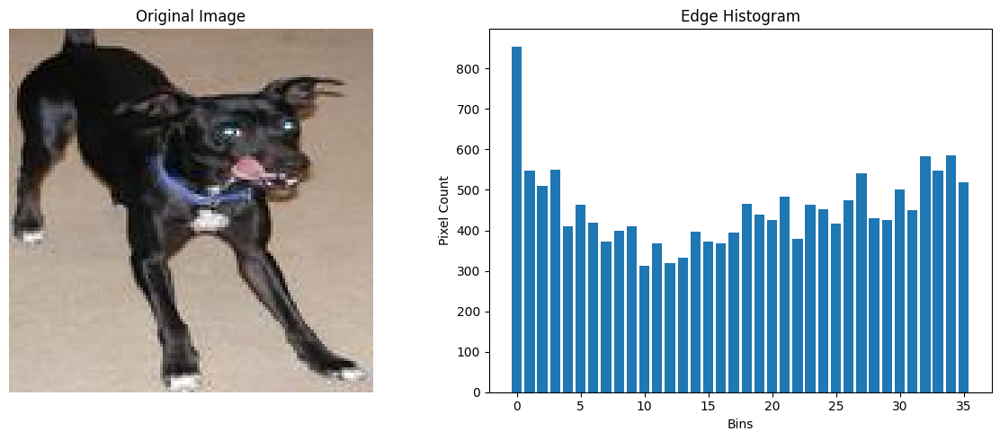

Image 121: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4705_0.jpg


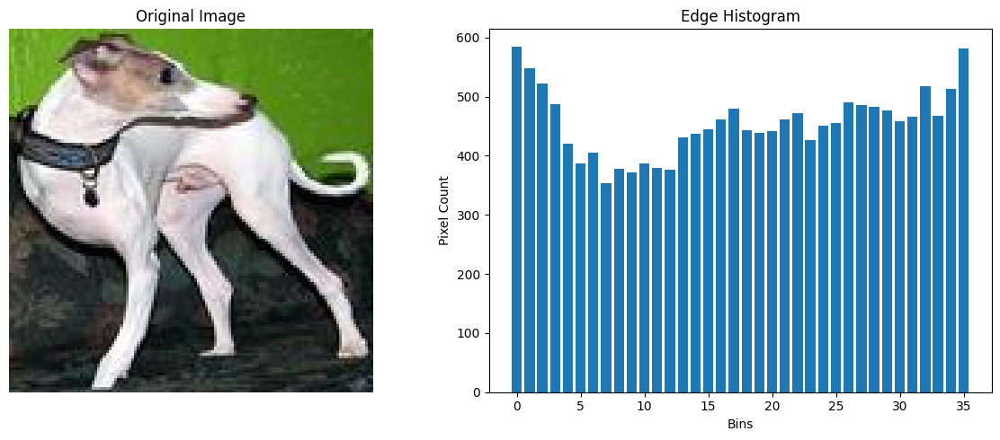

Image 122: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4731_0.jpg


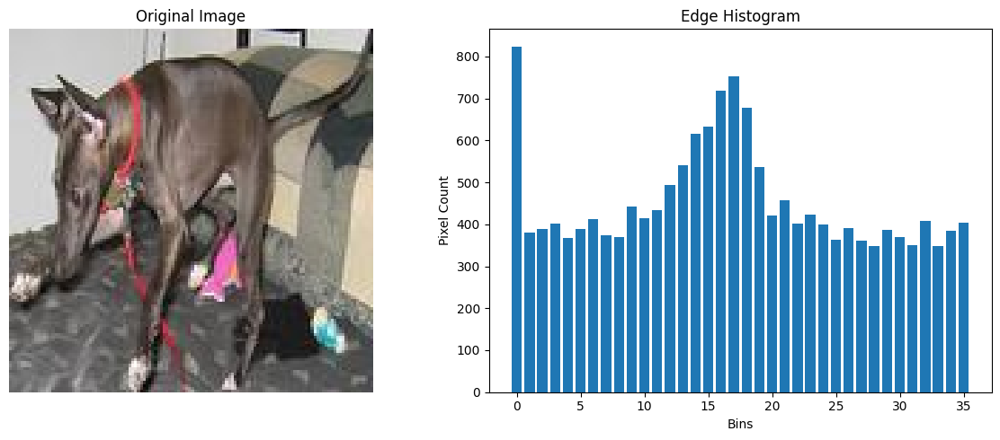

Image 123: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_490_0.jpg


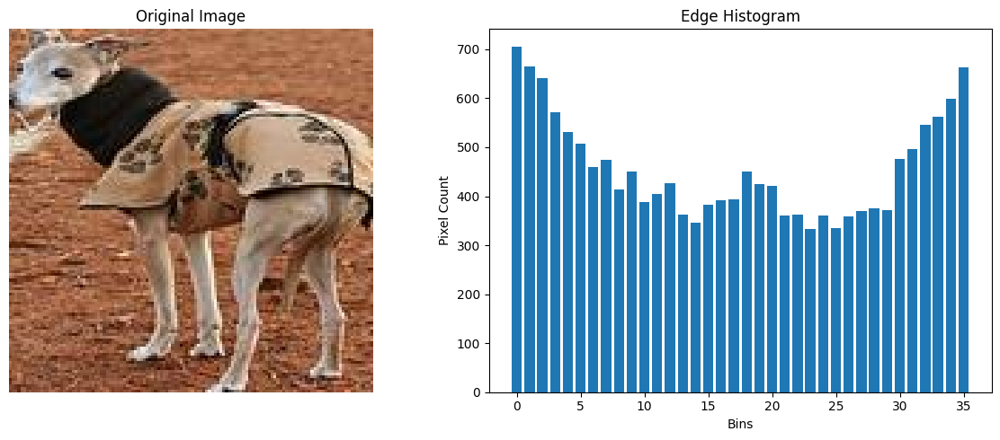

Image 124: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4970_0.jpg


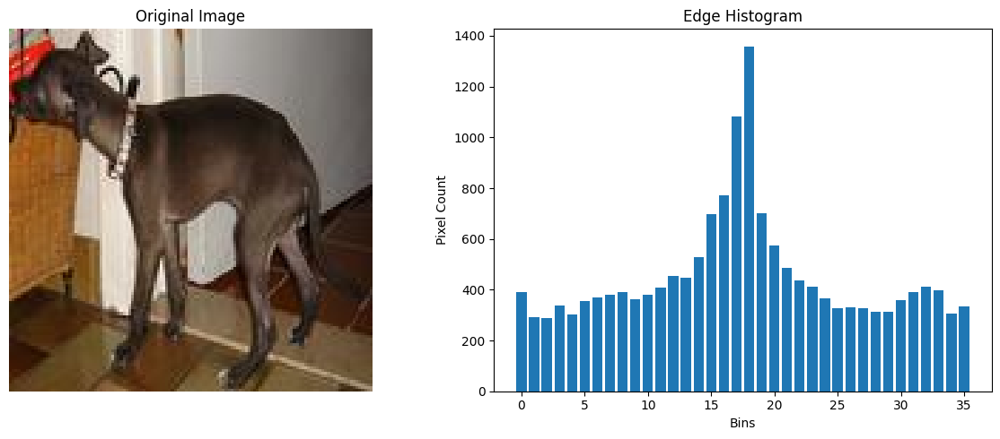

Image 125: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_4971_0.jpg


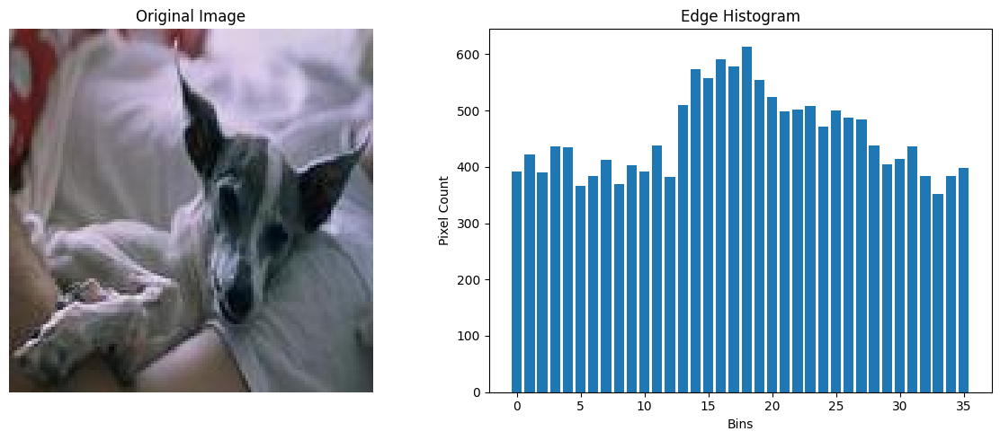

Image 126: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5093_0.jpg


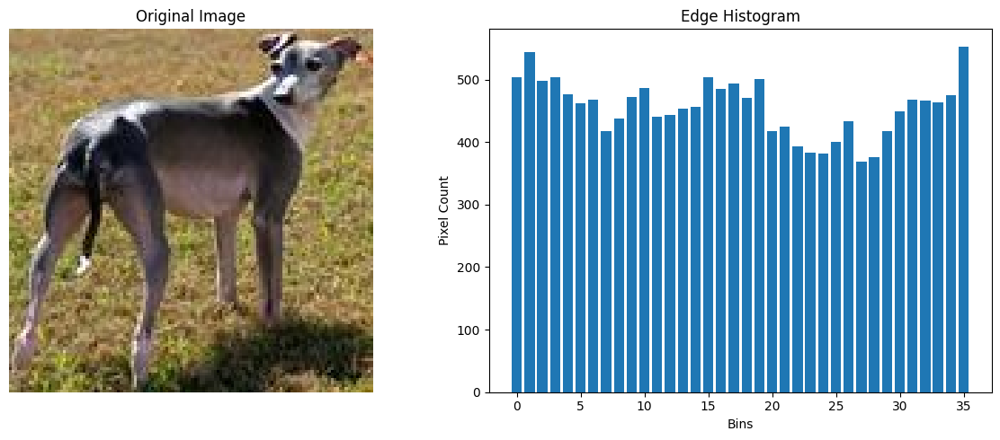

Image 127: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5134_0.jpg


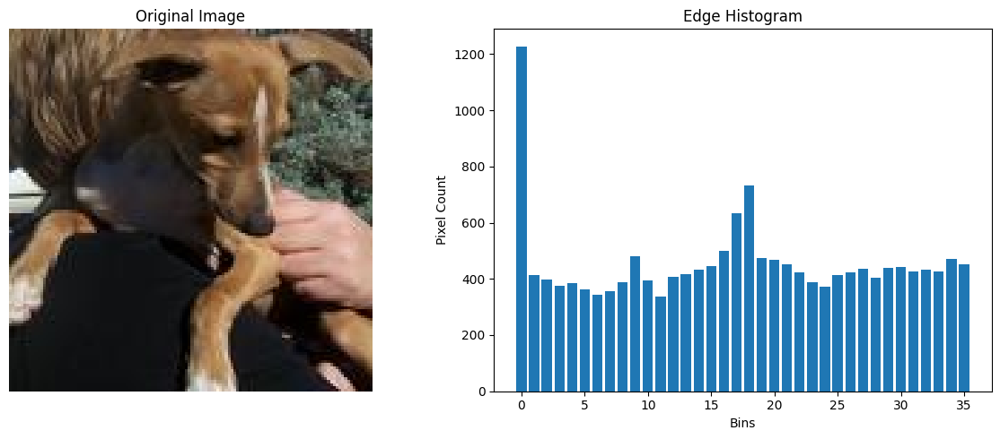

Image 128: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_526_0.jpg


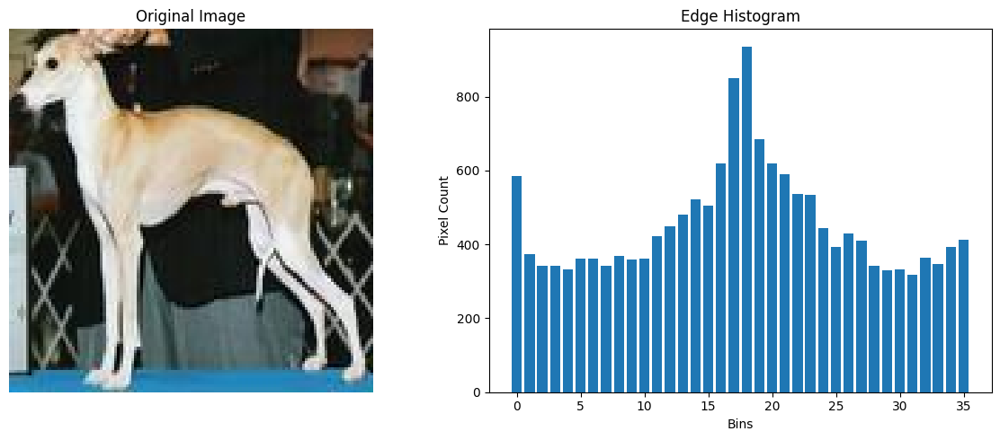

Image 129: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5383_0.jpg


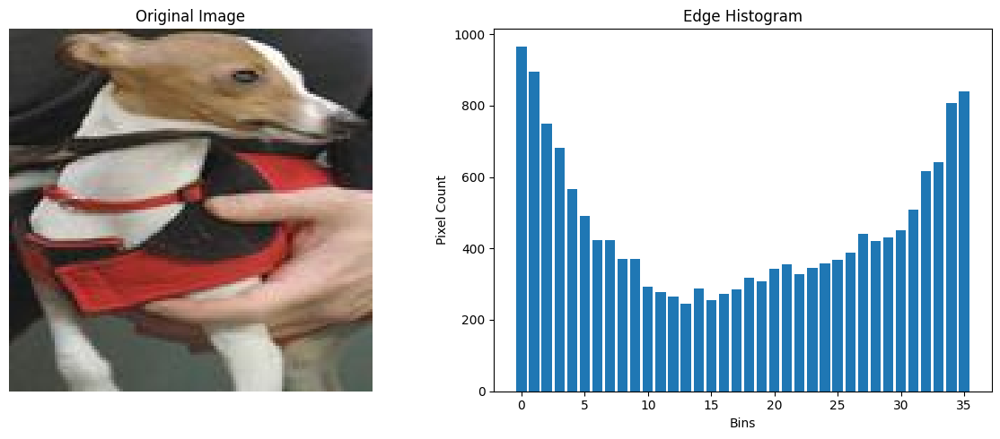

Image 130: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5431_0.jpg


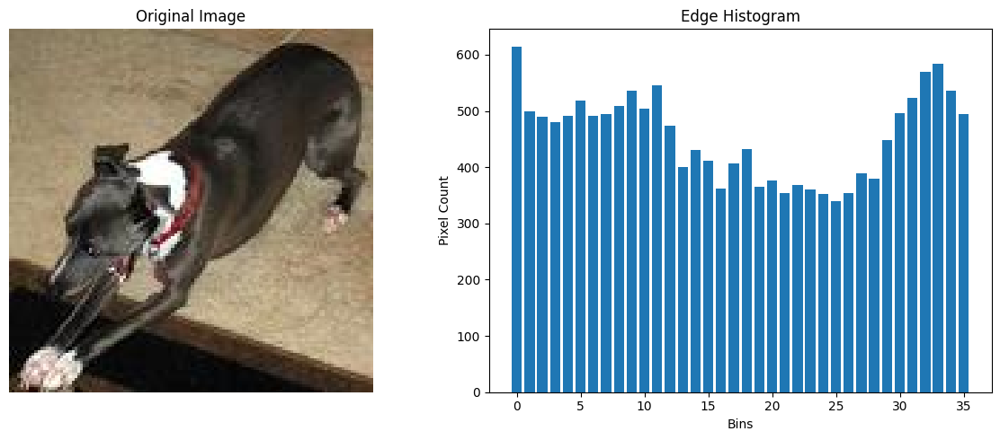

Image 131: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5435_0.jpg


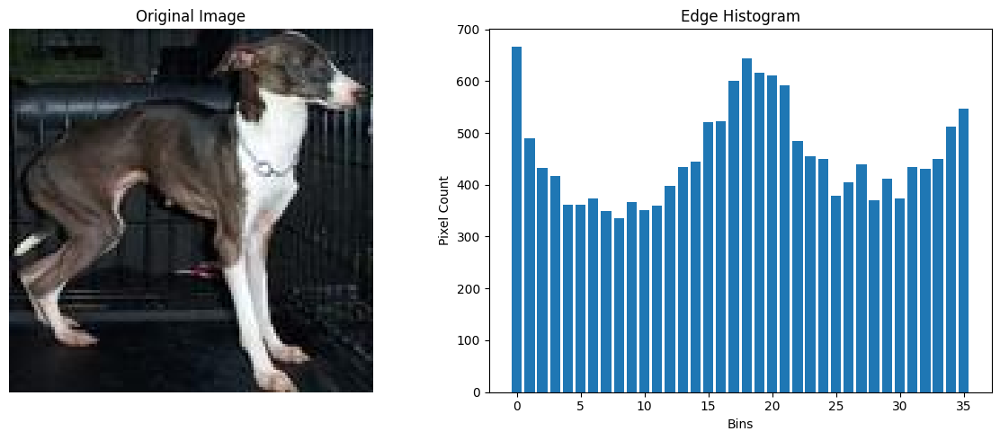

Image 132: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_551_0.jpg


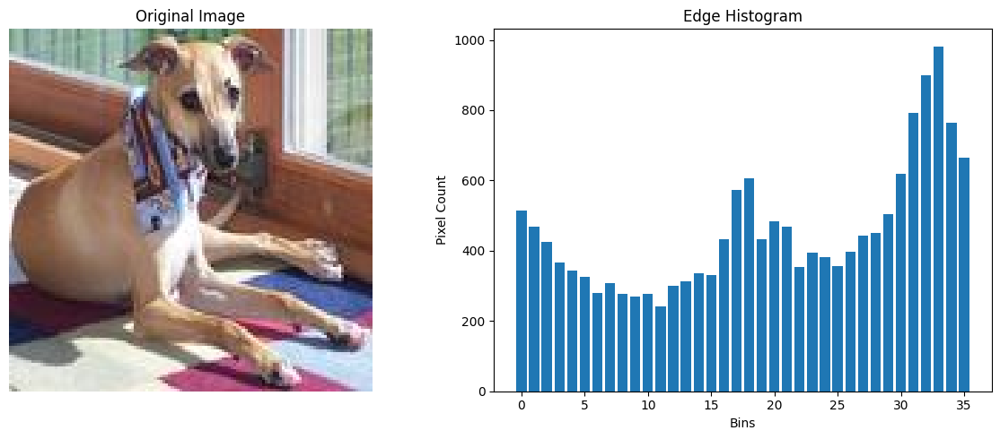

Image 133: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5526_0.jpg


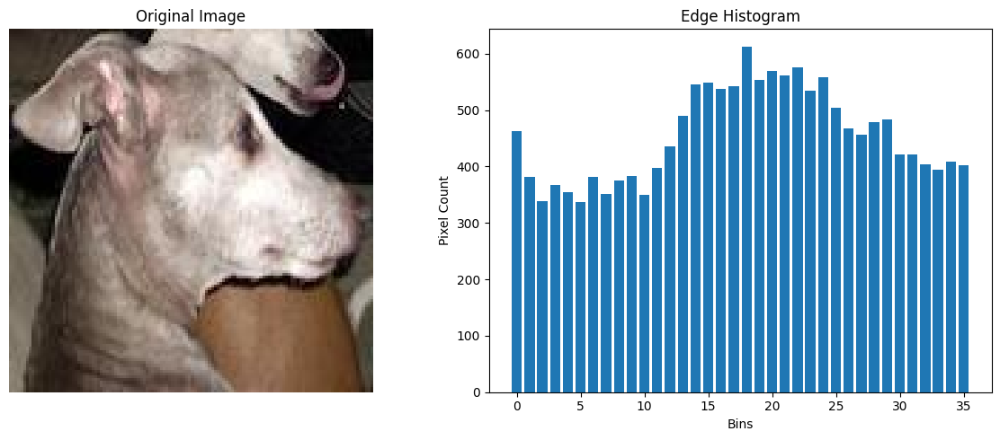

Image 134: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5526_1.jpg


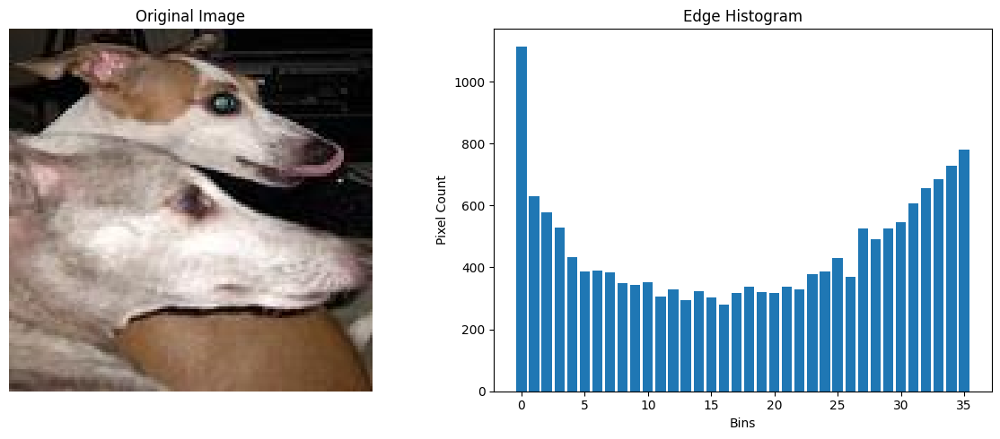

Image 135: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_55_0.jpg


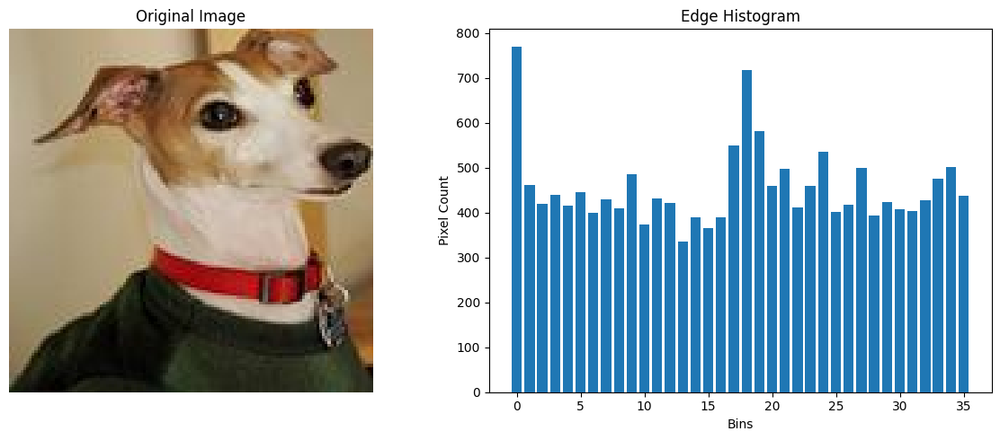

Image 136: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_561_0.jpg


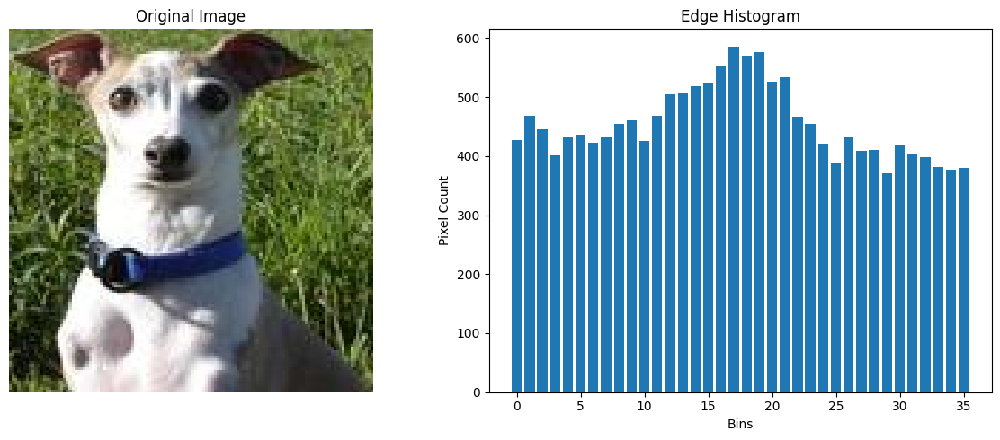

Image 137: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5638_0.jpg


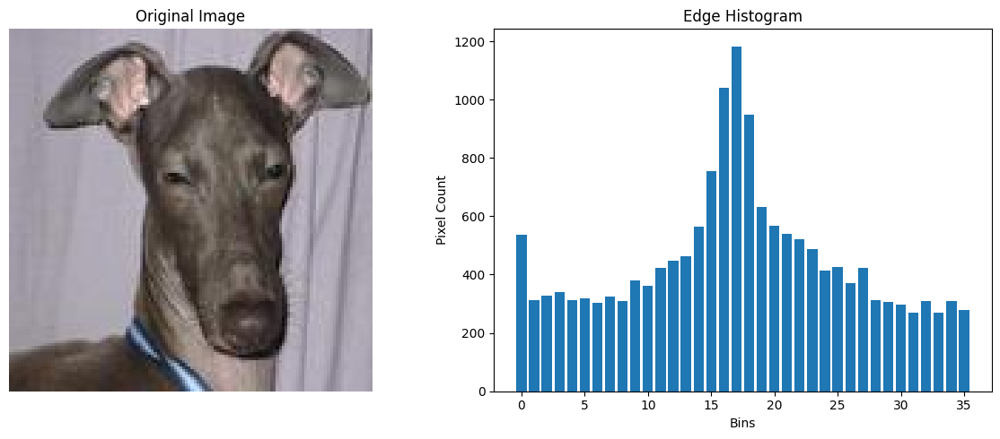

Image 138: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5678_0.jpg


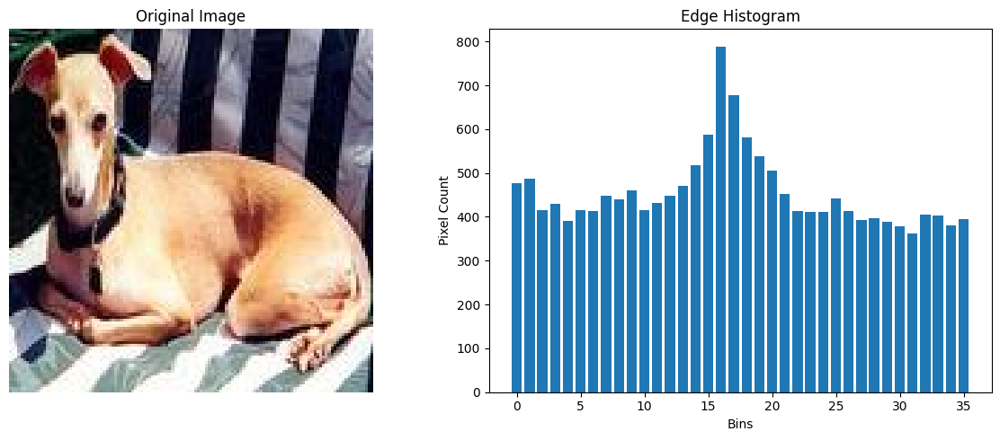

Image 139: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_570_0.jpg


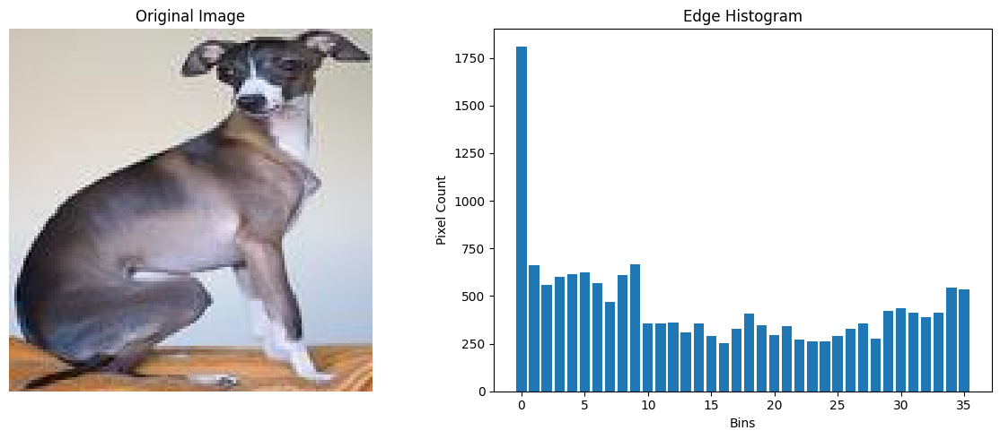

Image 140: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5872_0.jpg


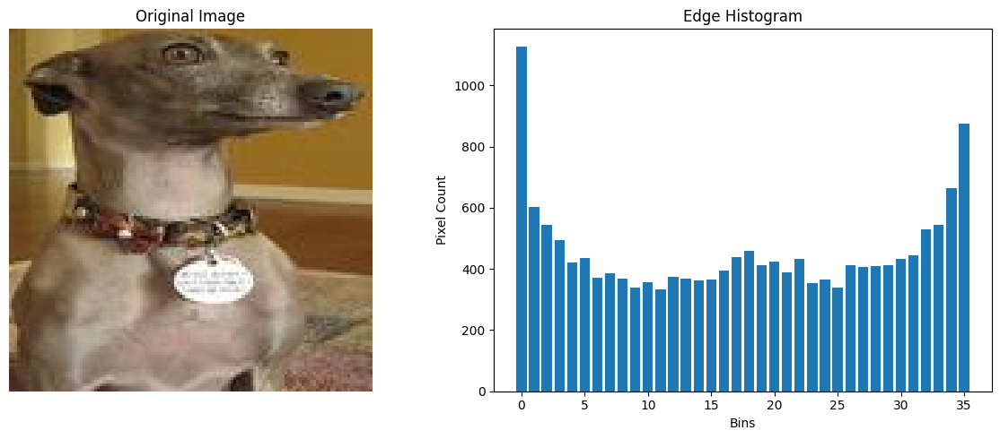

Image 141: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5904_0.jpg


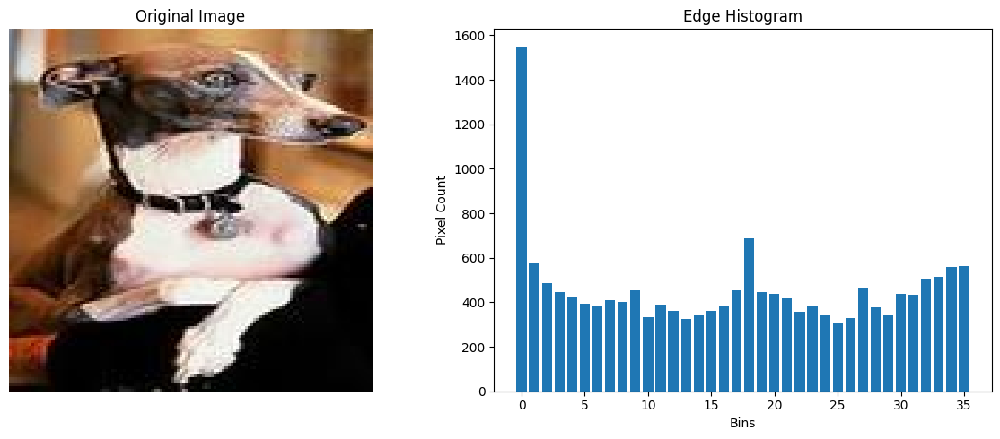

Image 142: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5942_0.jpg


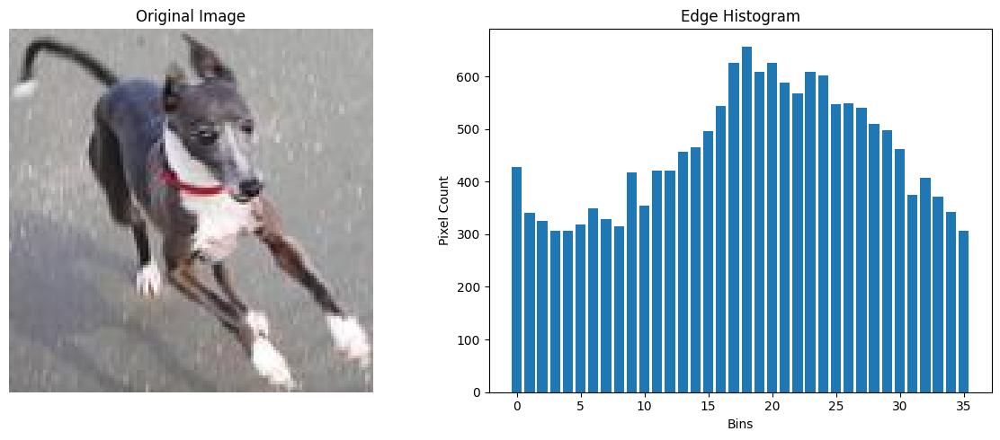

Image 143: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5975_0.jpg


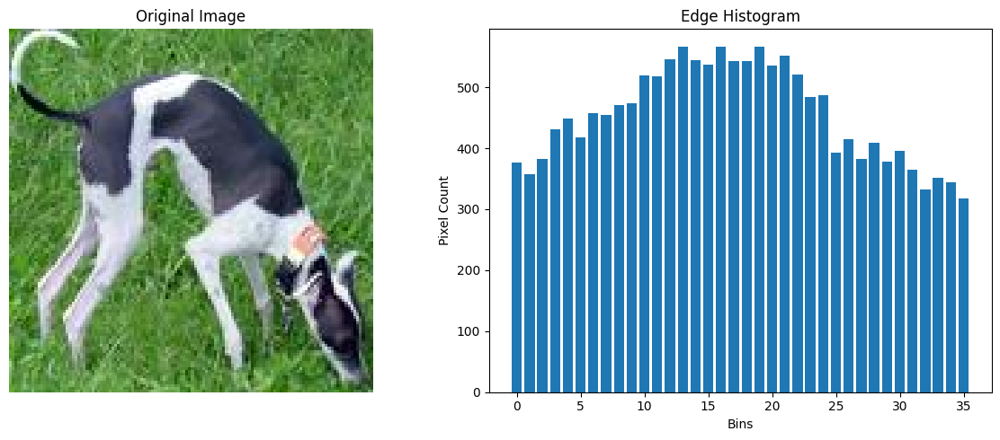

Image 144: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_5_0.jpg


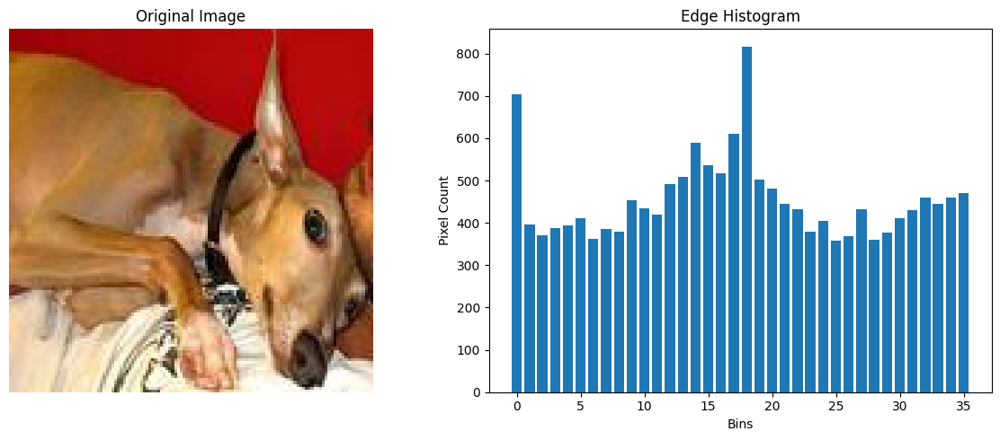

Image 145: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6037_0.jpg


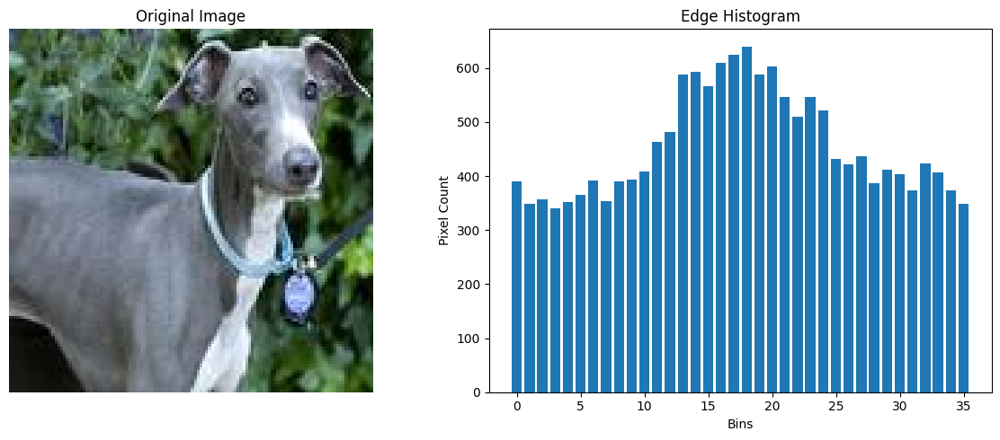

Image 146: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6179_0.jpg


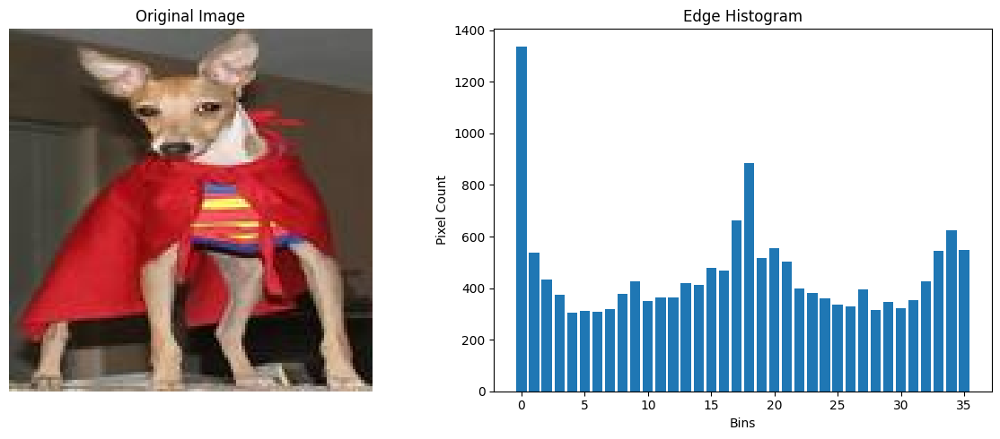

Image 147: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6179_1.jpg


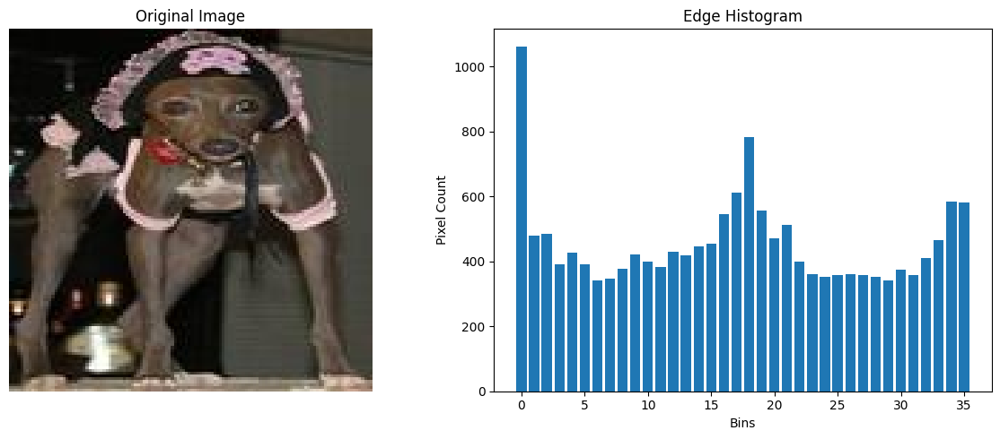

Image 148: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6223_0.jpg


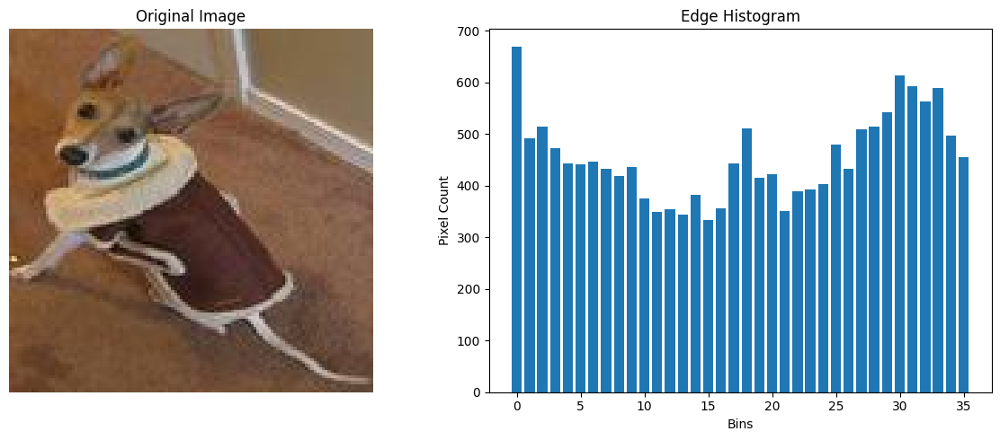

Image 149: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6345_0.jpg


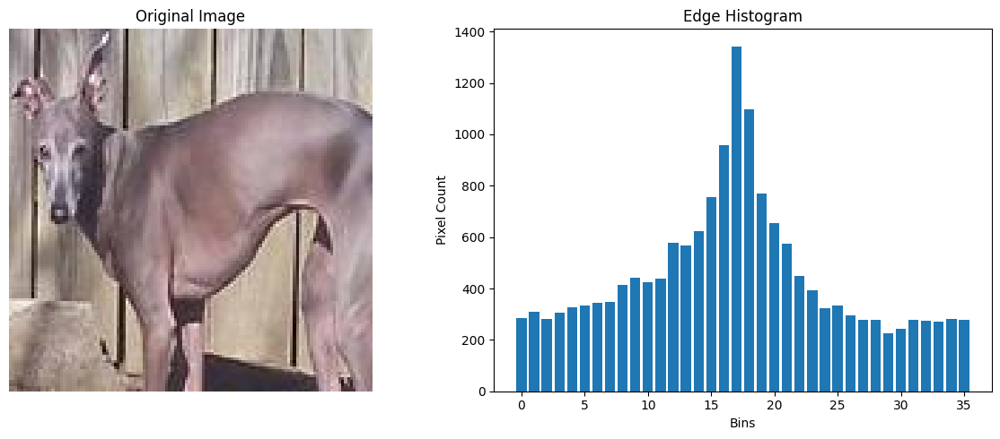

Image 150: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_636_0.jpg


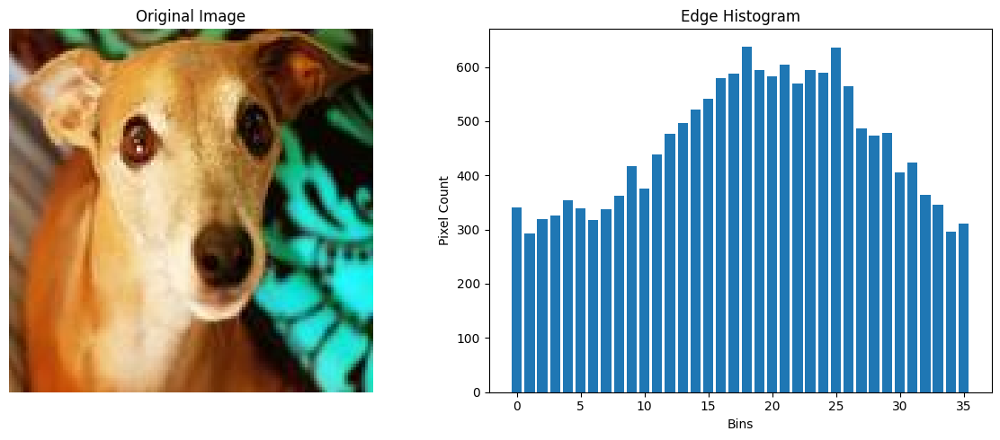

Image 151: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_651_0.jpg


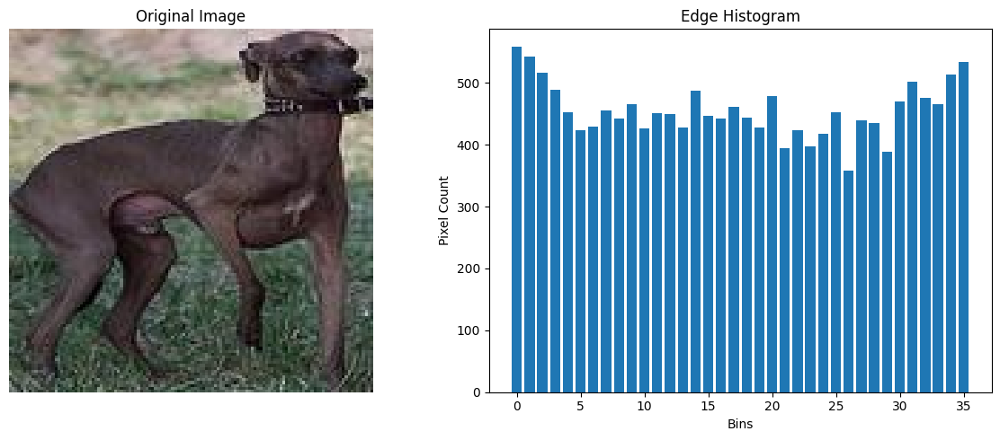

Image 152: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_652_0.jpg


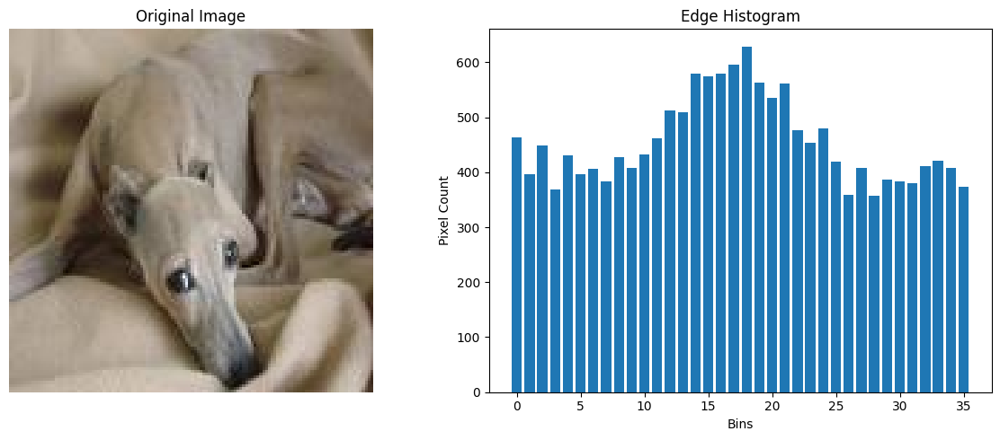

Image 153: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6537_0.jpg


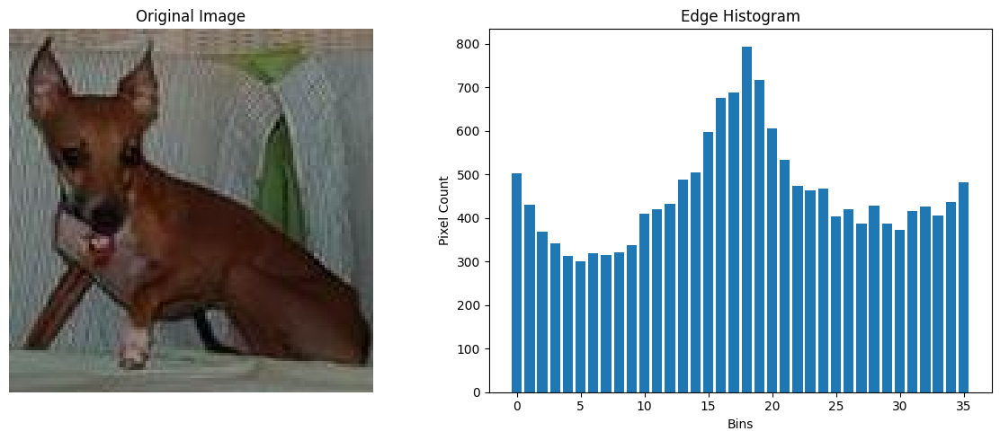

Image 154: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6587_0.jpg


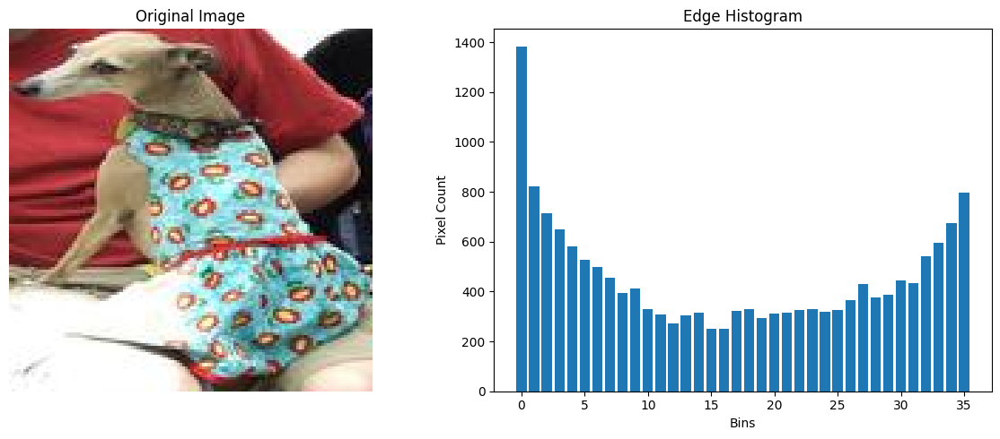

Image 155: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_658_0.jpg


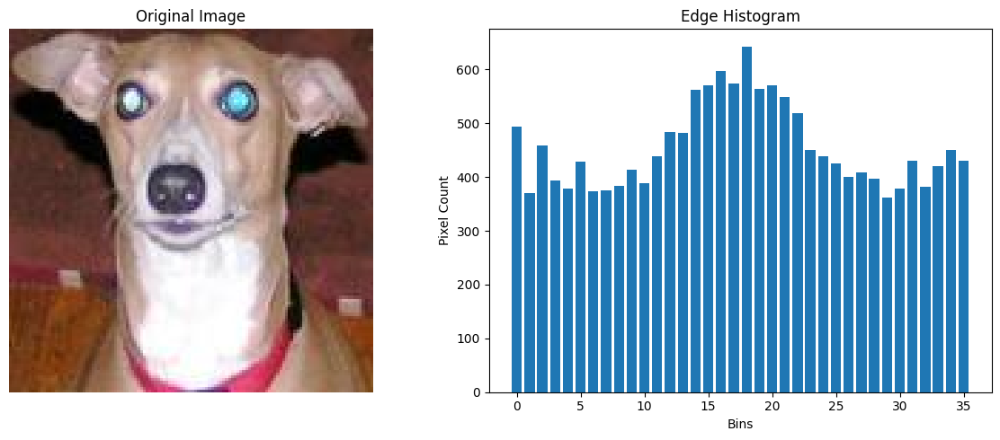

Image 156: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6728_0.jpg


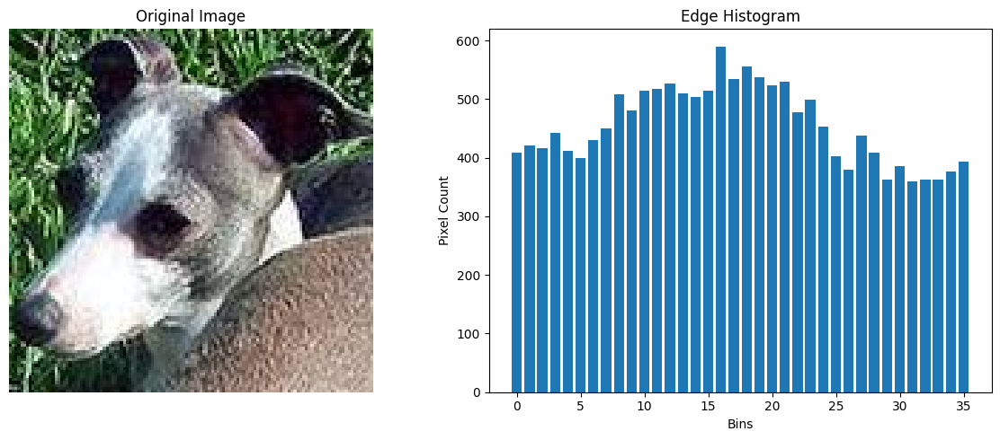

Image 157: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6728_1.jpg


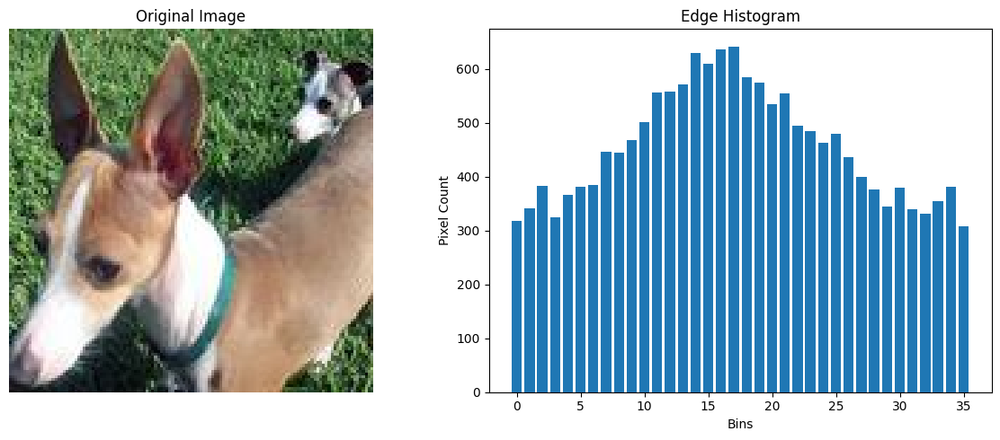

Image 158: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6817_0.jpg


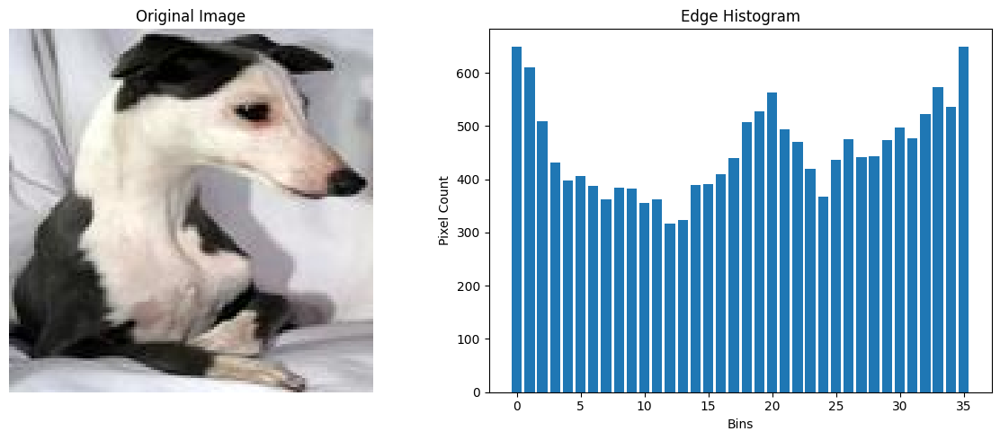

Image 159: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_6979_0.jpg


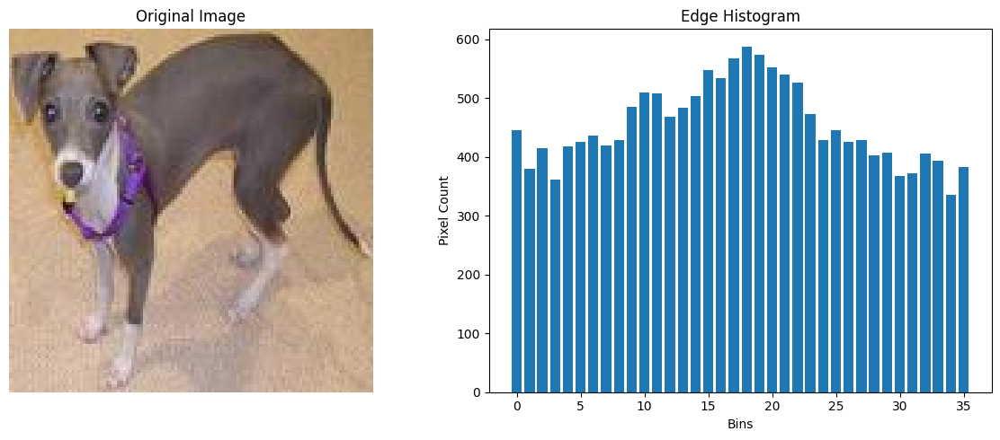

Image 160: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_708_0.jpg


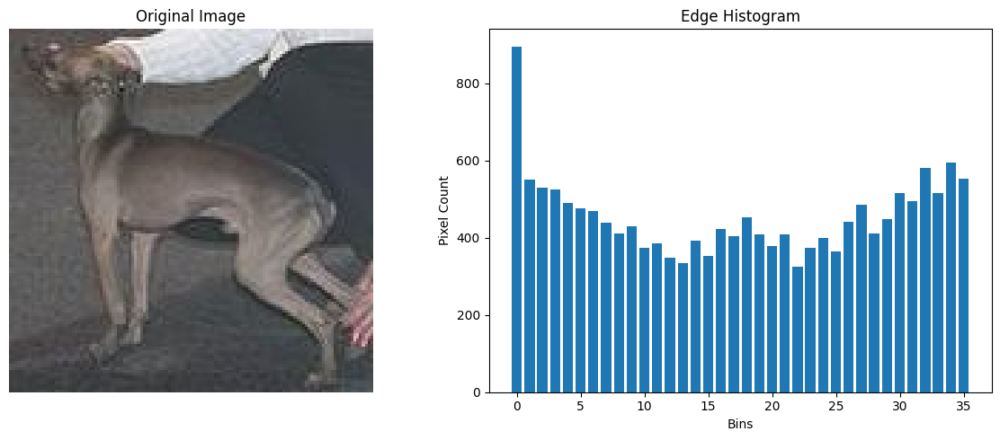

Image 161: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7147_0.jpg


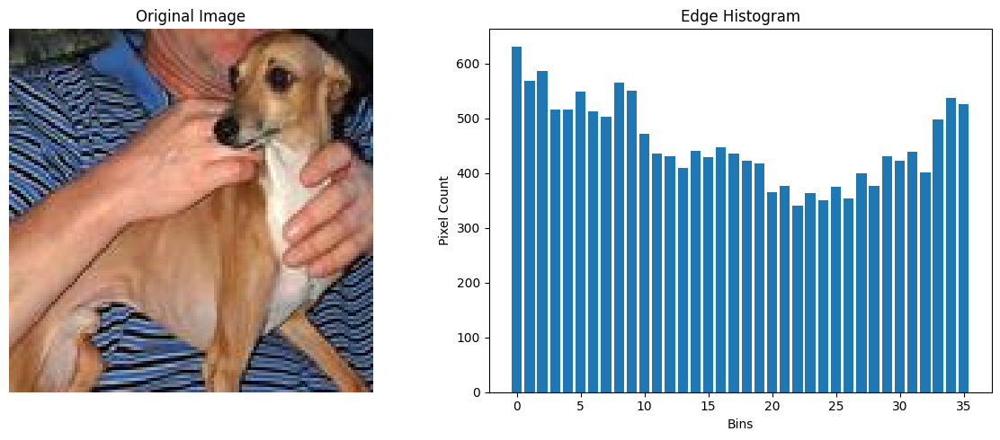

Image 162: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7188_0.jpg


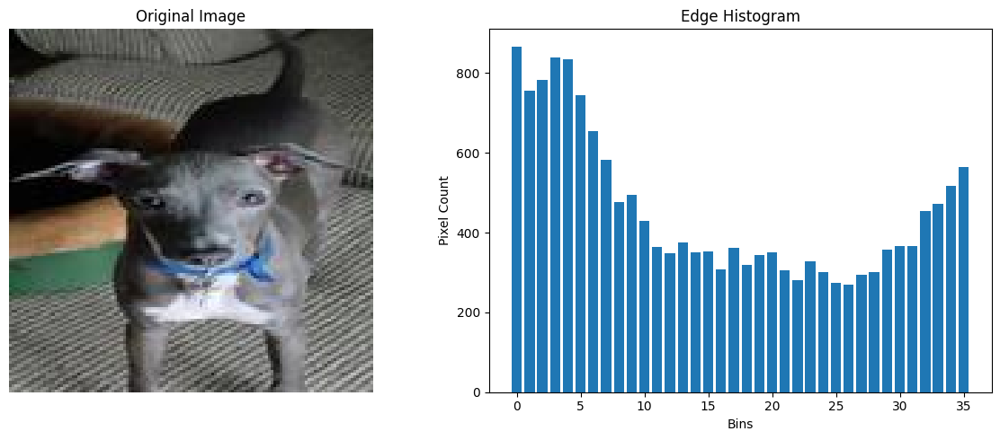

Image 163: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7200_0.jpg


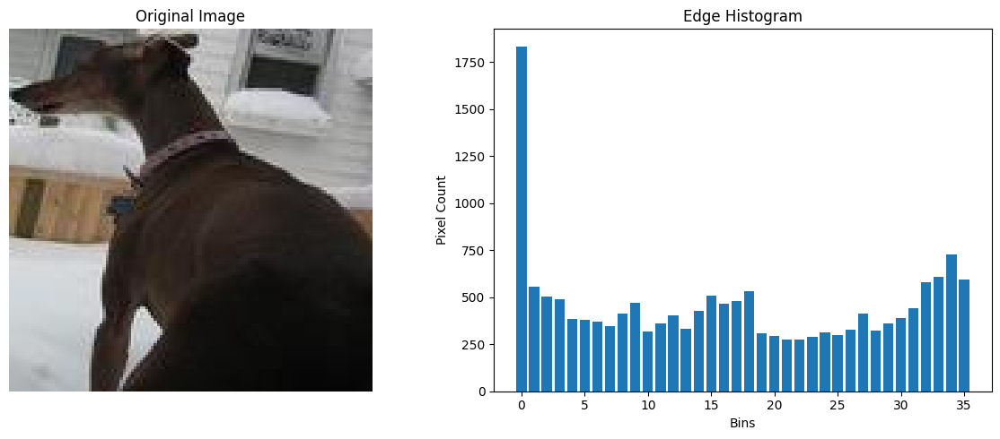

Image 164: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_722_0.jpg


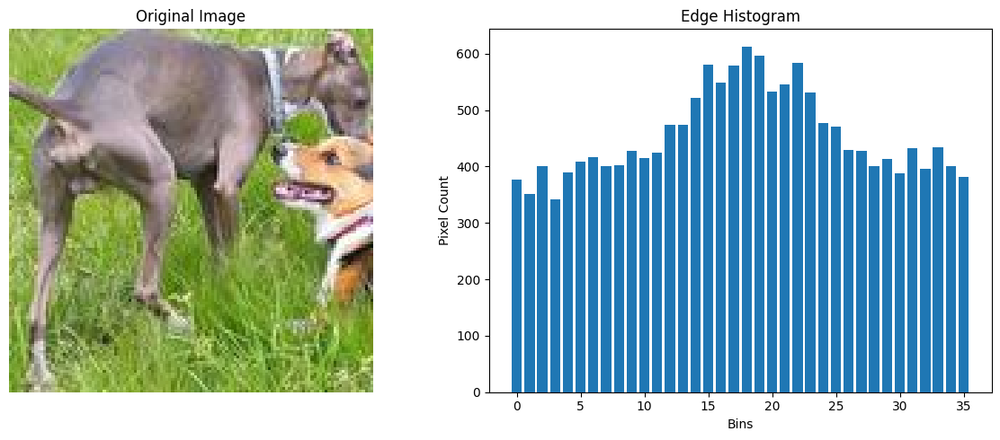

Image 165: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_722_1.jpg


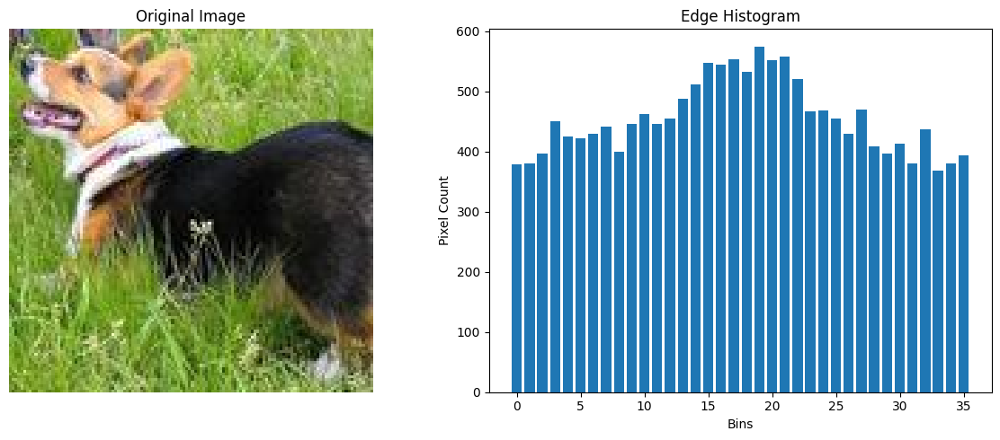

Image 166: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7406_0.jpg


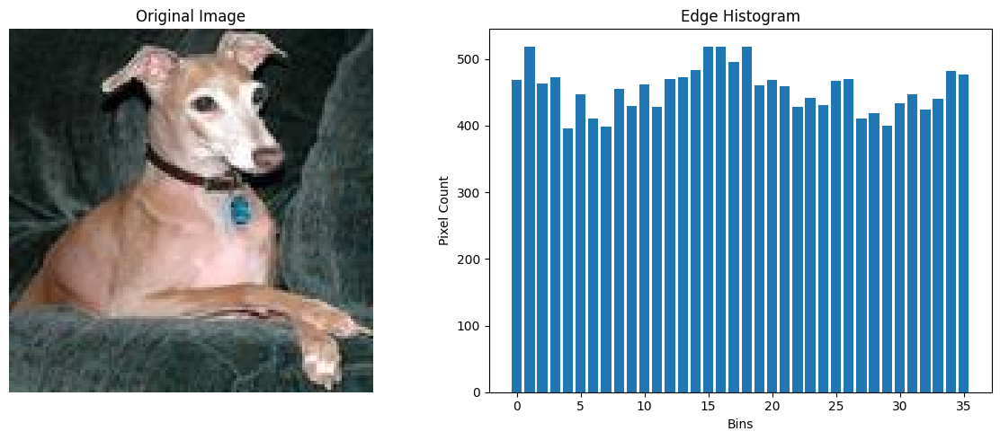

Image 167: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_745_0.jpg


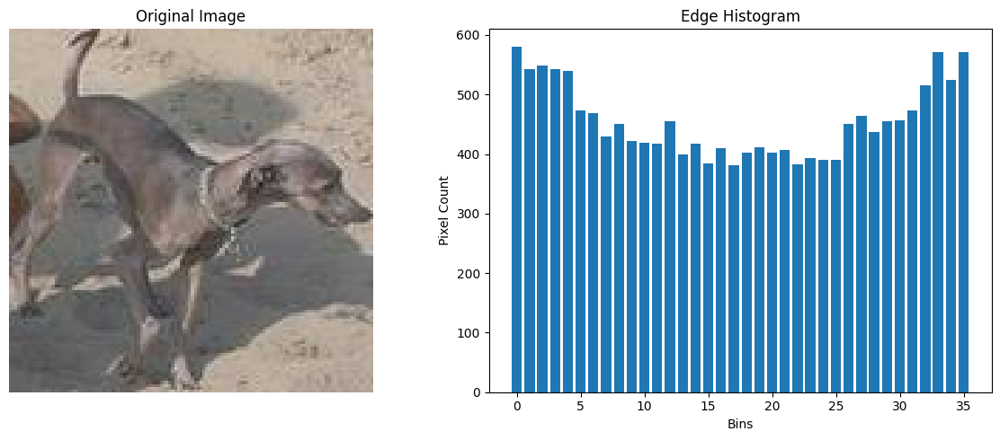

Image 168: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_745_1.jpg


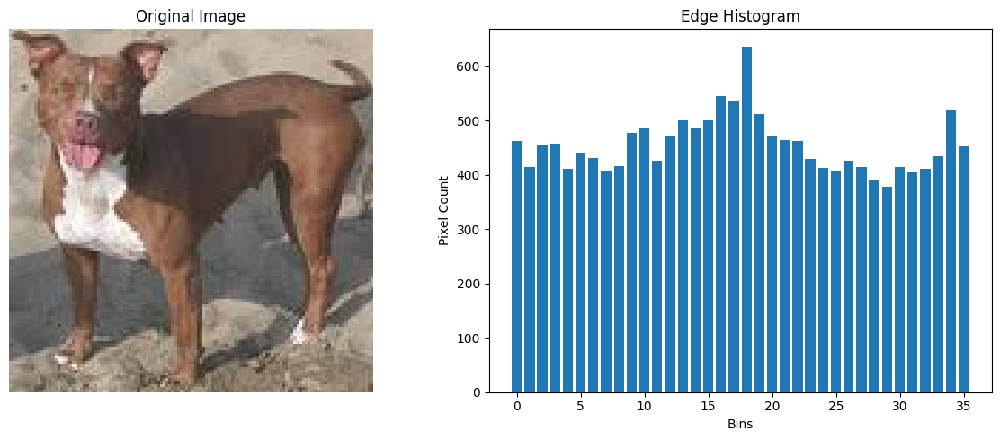

Image 169: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7499_0.jpg


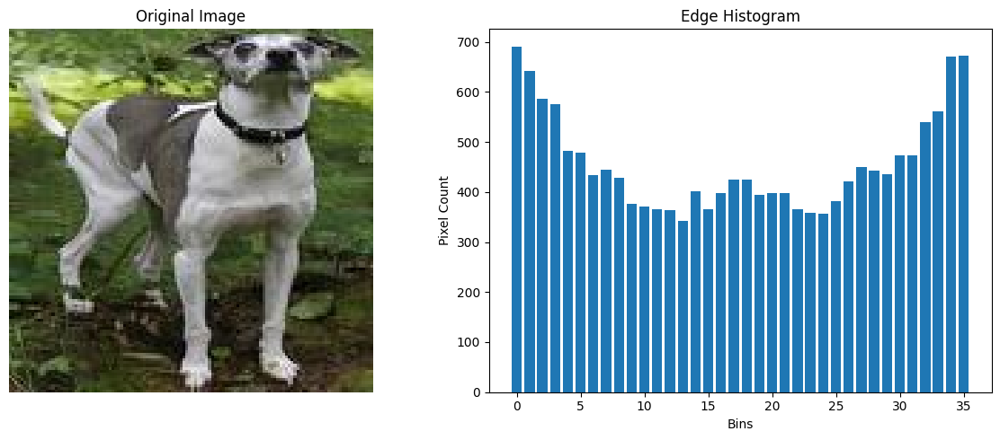

Image 170: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7548_0.jpg


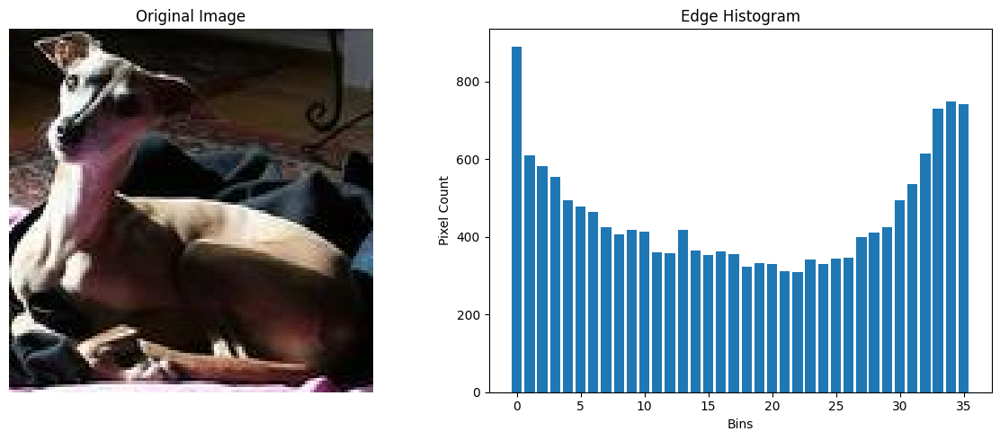

Image 171: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7548_1.jpg


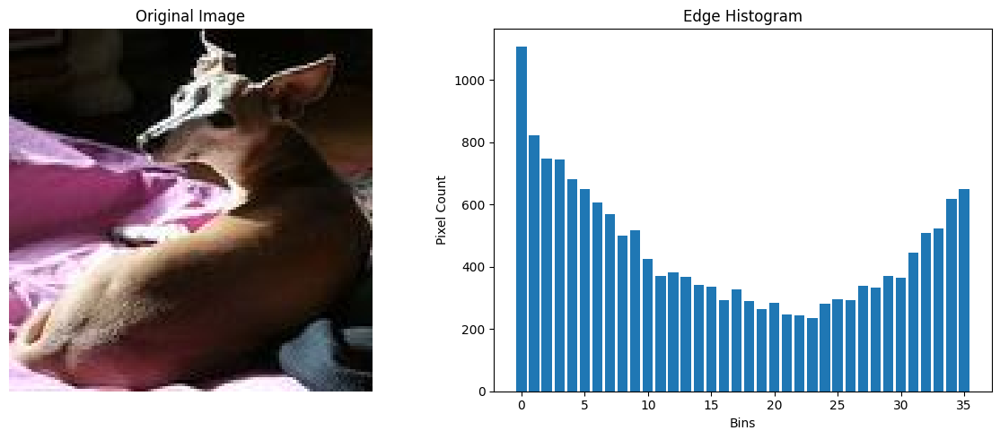

Image 172: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_75_0.jpg


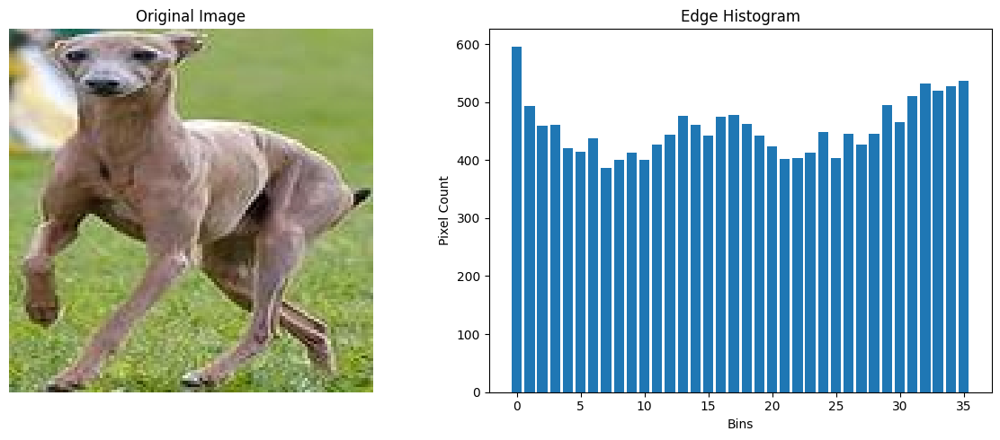

Image 173: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_769_0.jpg


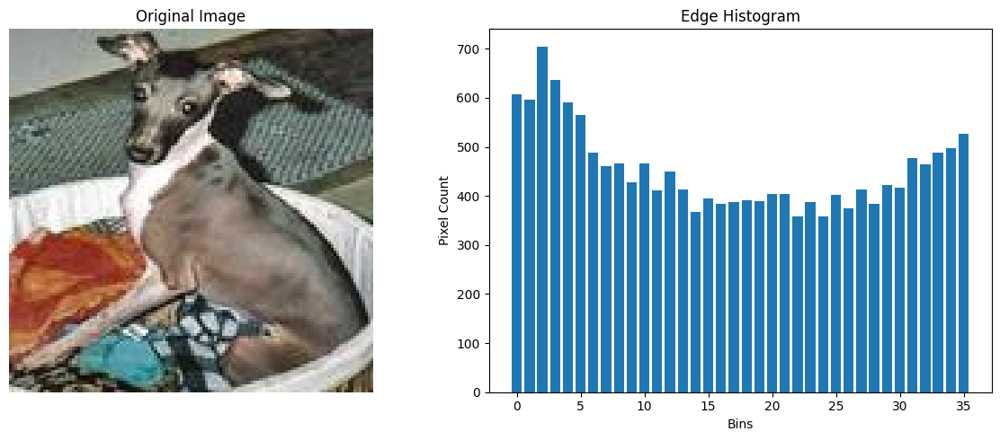

Image 174: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_770_0.jpg


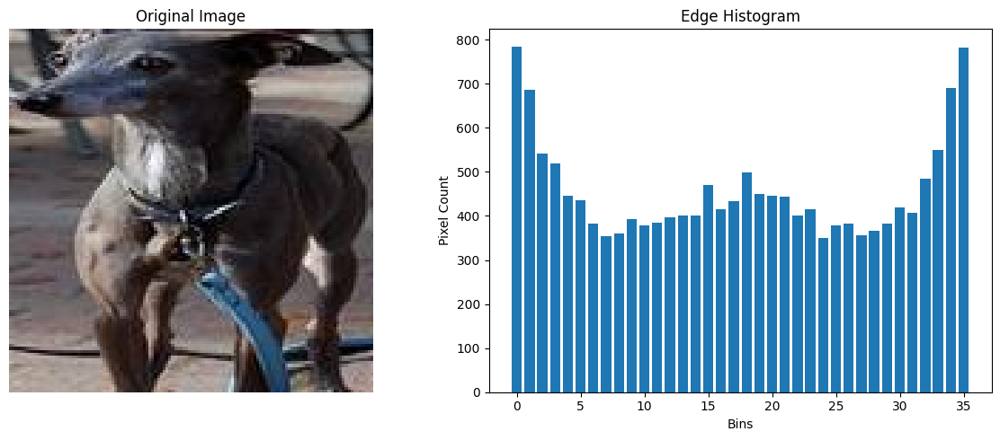

Image 175: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_770_1.jpg


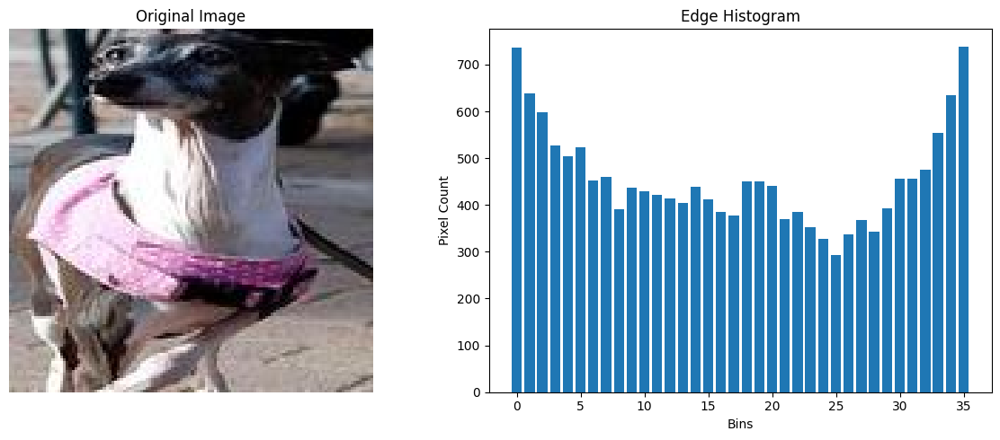

Image 176: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_774_0.jpg


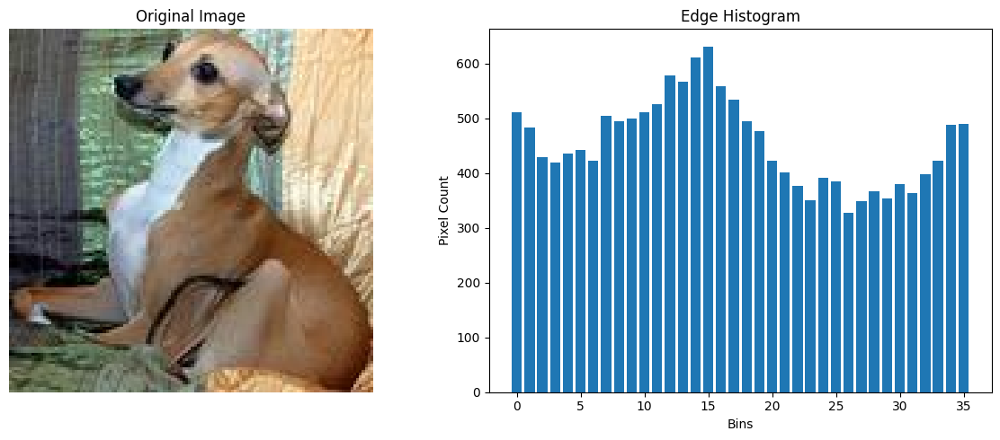

Image 177: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7813_0.jpg


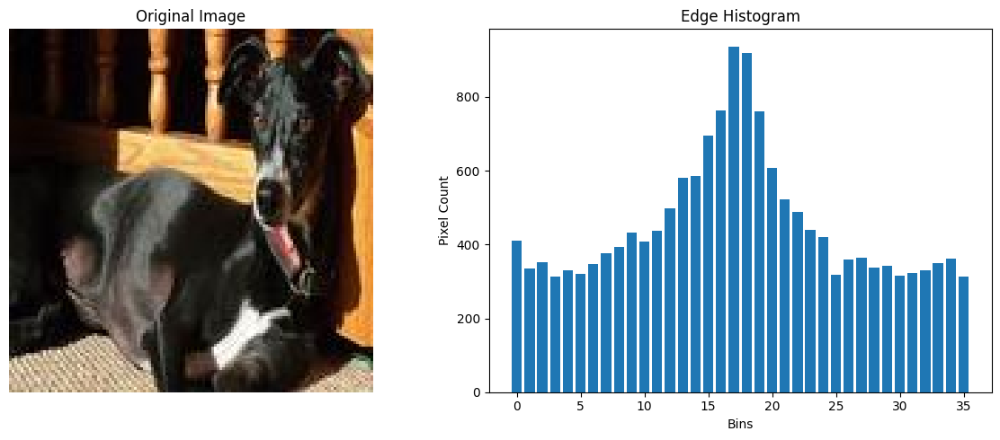

Image 178: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7831_0.jpg


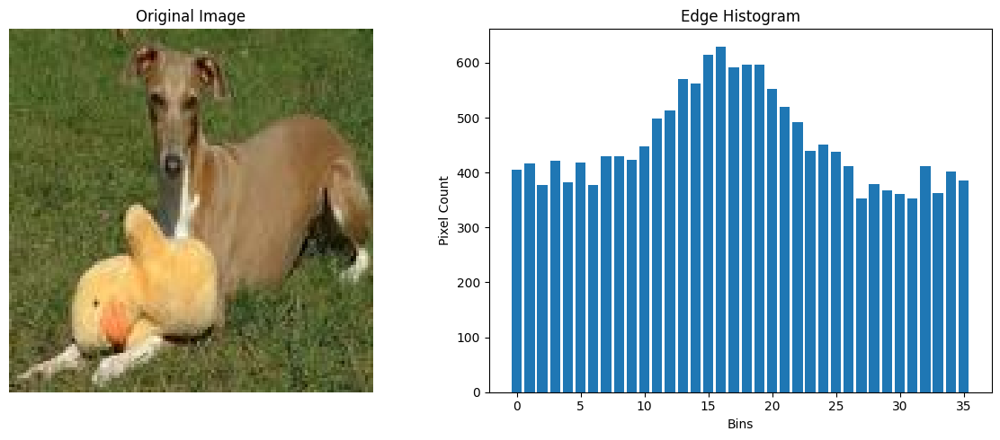

Image 179: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7838_0.jpg


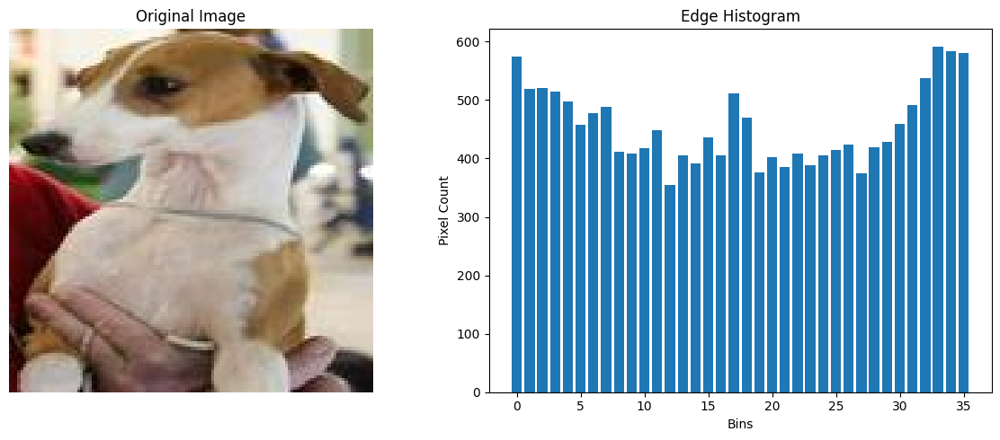

Image 180: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_7922_0.jpg


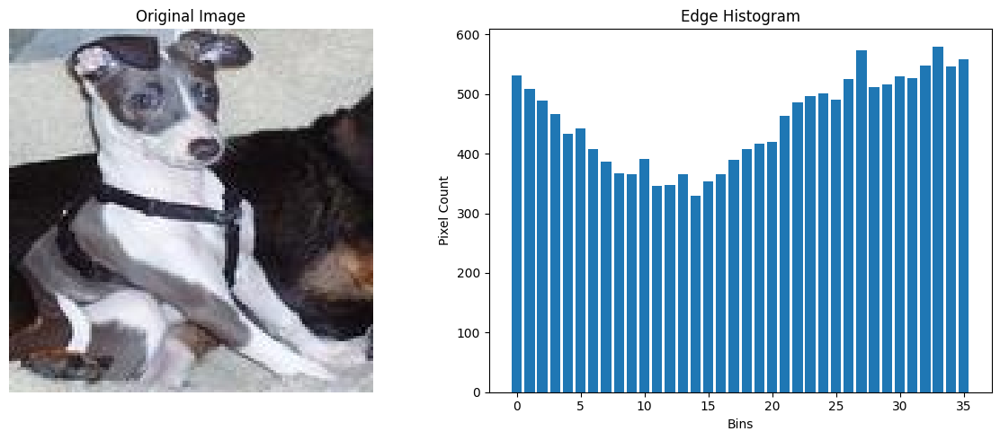

Image 181: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8093_0.jpg


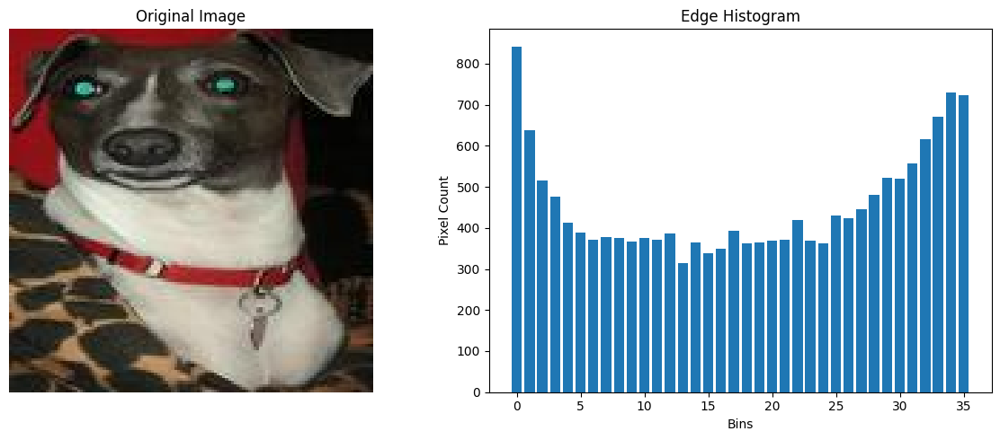

Image 182: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8150_0.jpg


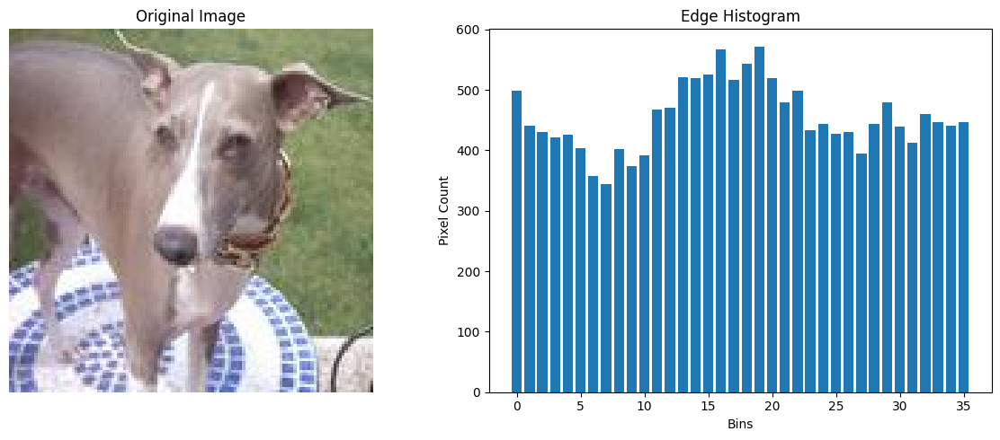

Image 183: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8244_0.jpg


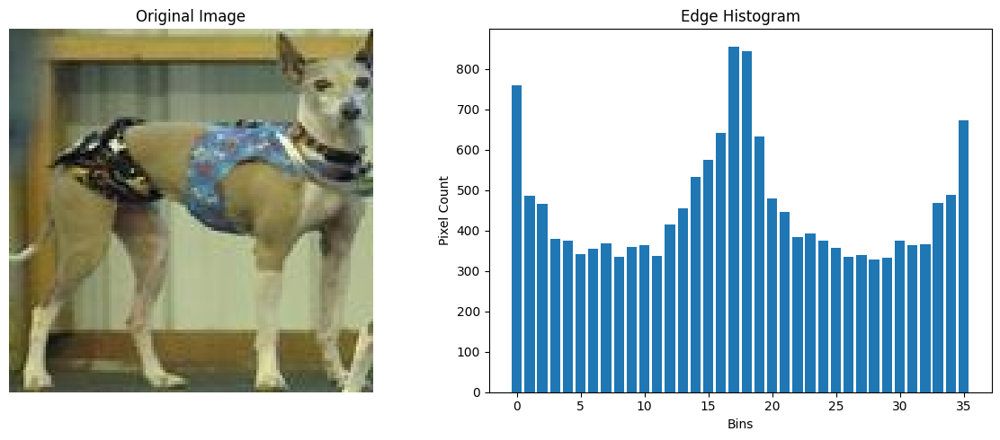

Image 184: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8244_1.jpg


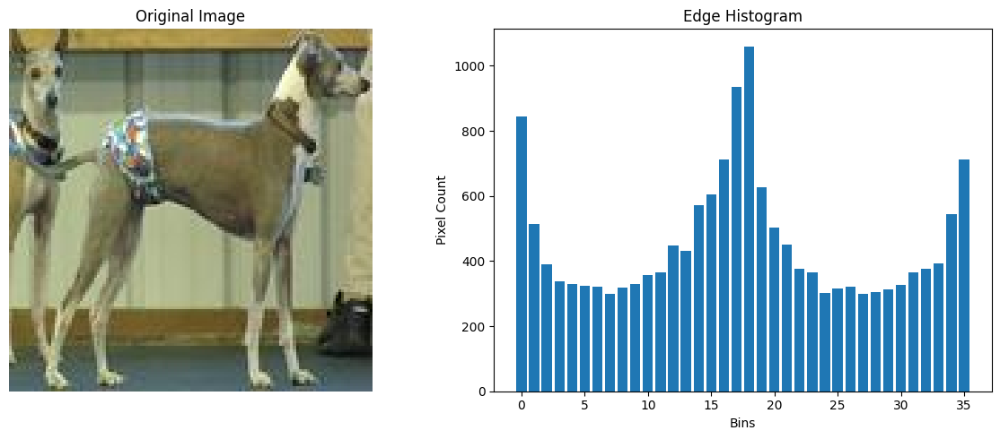

Image 185: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8265_0.jpg


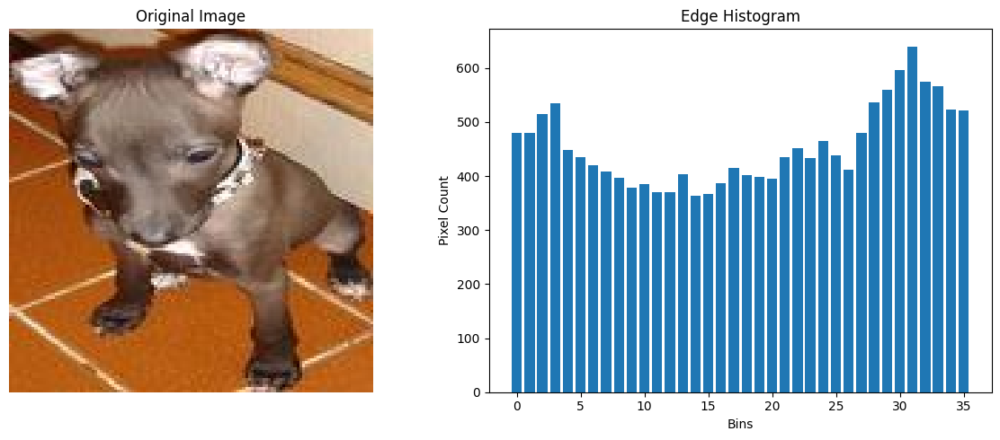

Image 186: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8298_0.jpg


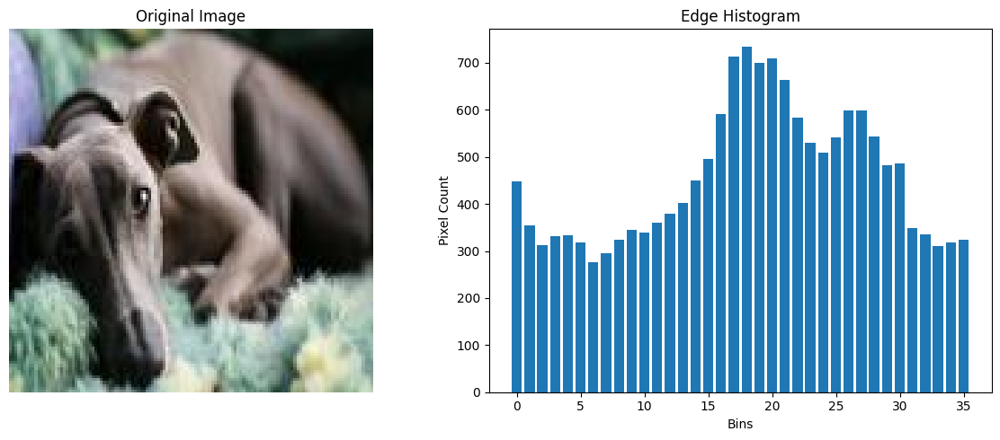

Image 187: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8369_0.jpg


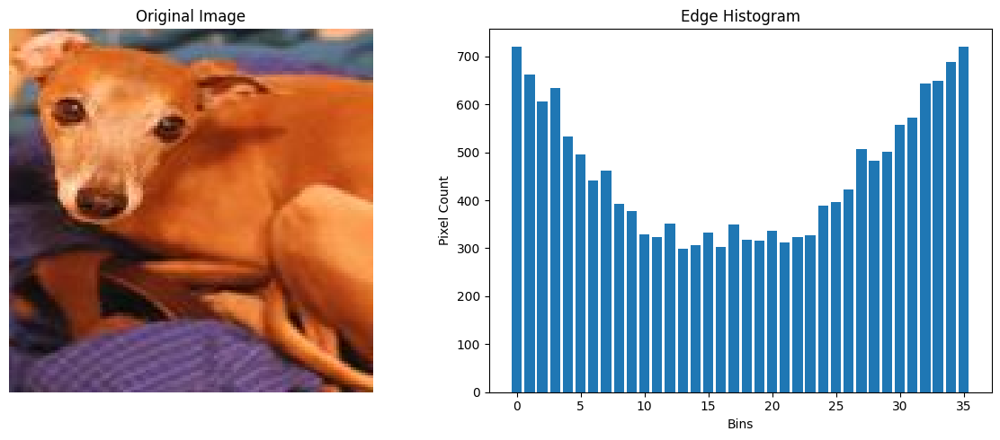

Image 188: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8411_0.jpg


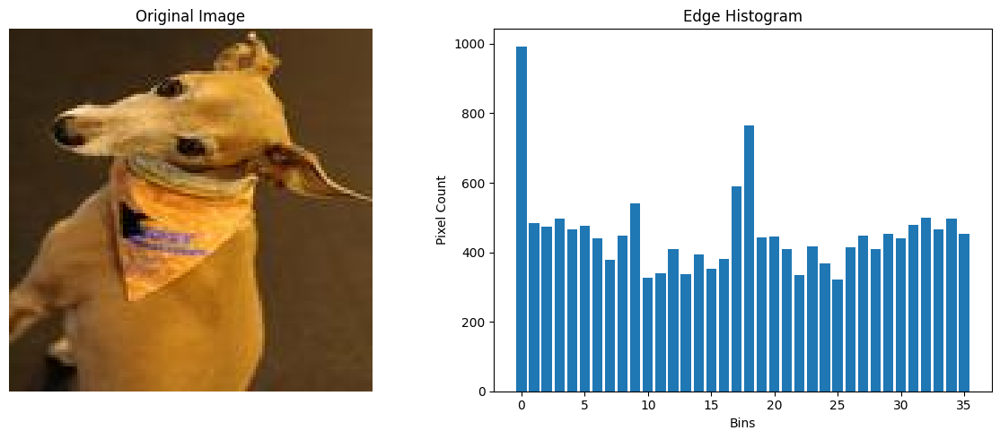

Image 189: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8428_0.jpg


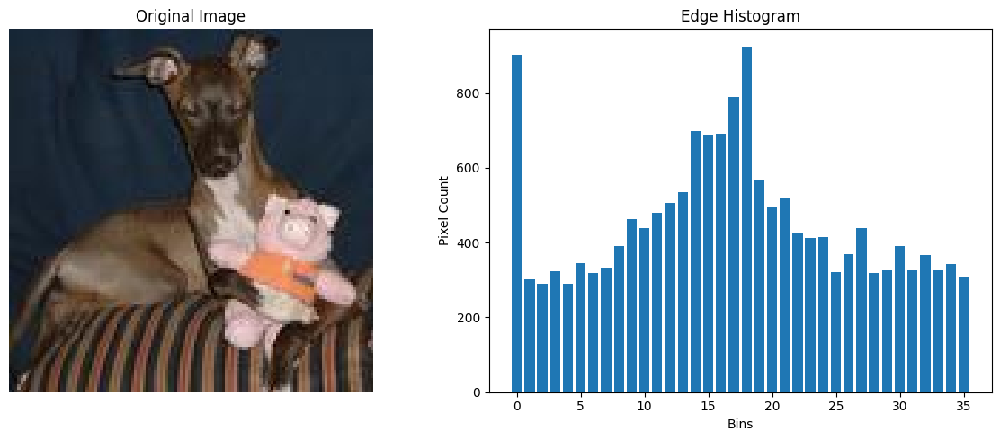

Image 190: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_870_0.jpg


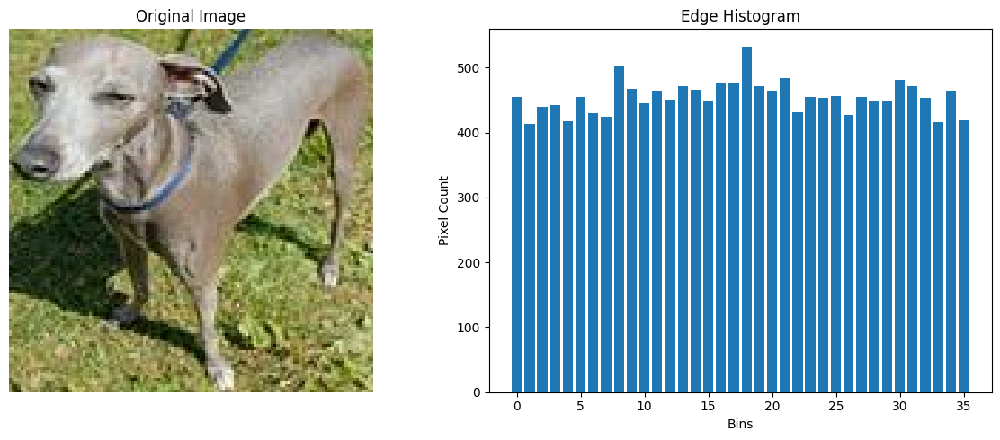

Image 191: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_877_0.jpg


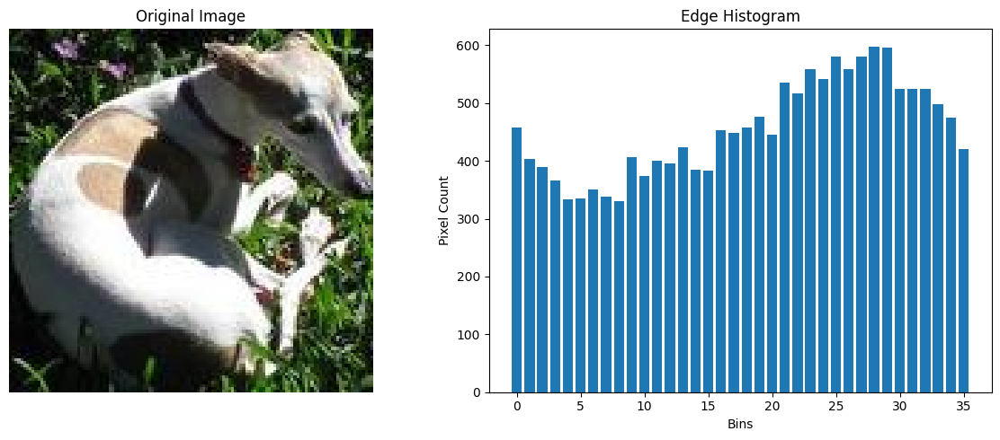

Image 192: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_8855_0.jpg


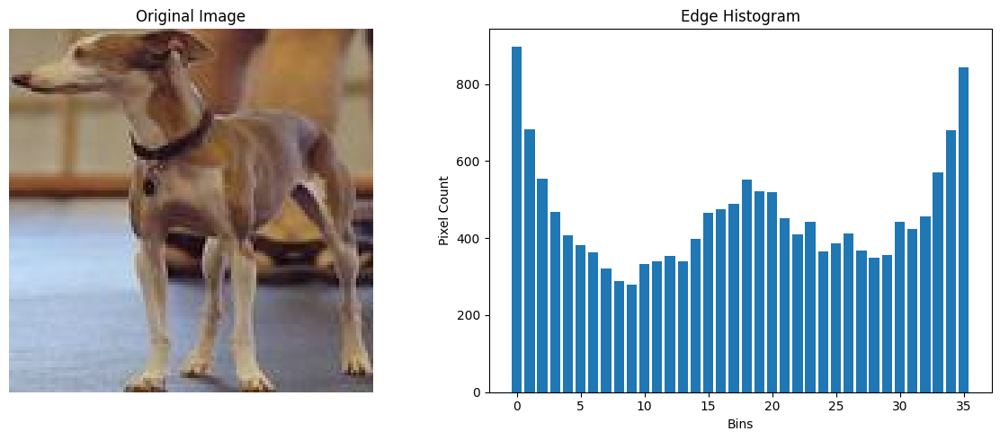

Image 193: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9018_0.jpg


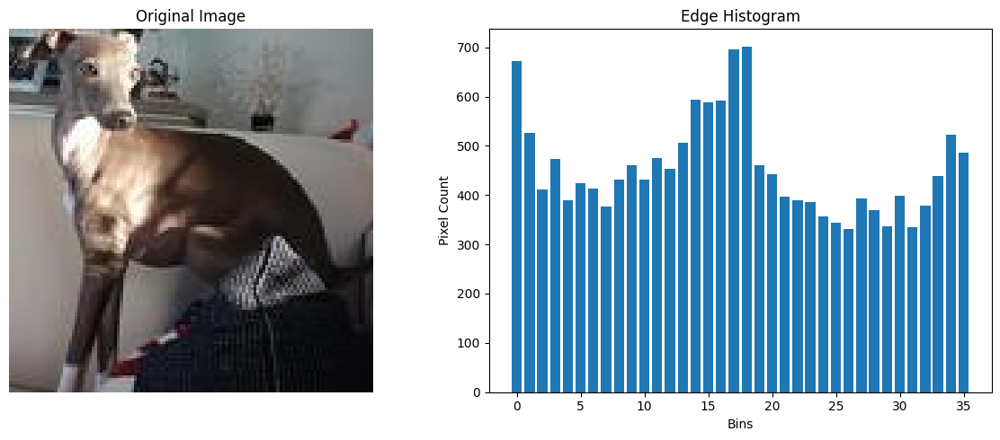

Image 194: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_904_0.jpg


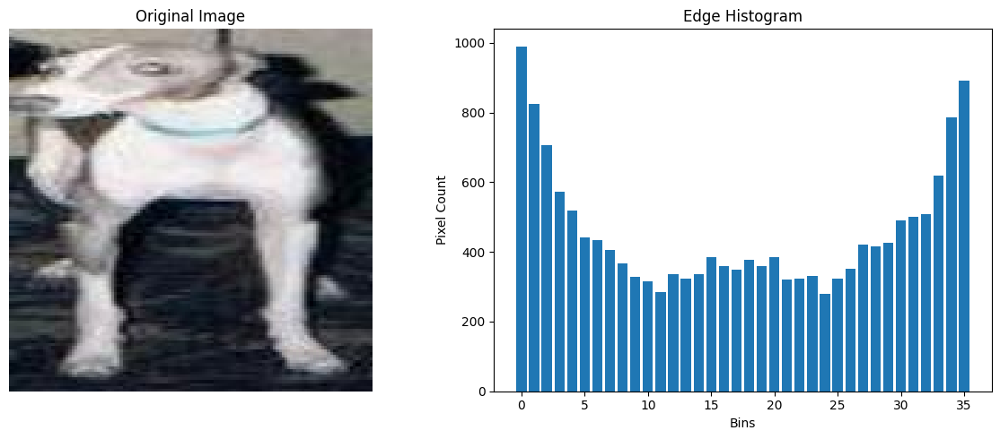

Image 195: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_904_1.jpg


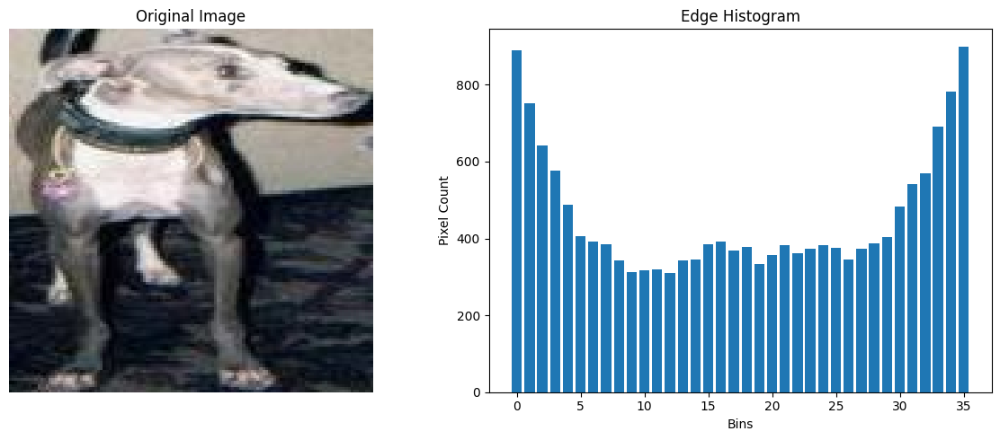

Image 196: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_907_0.jpg


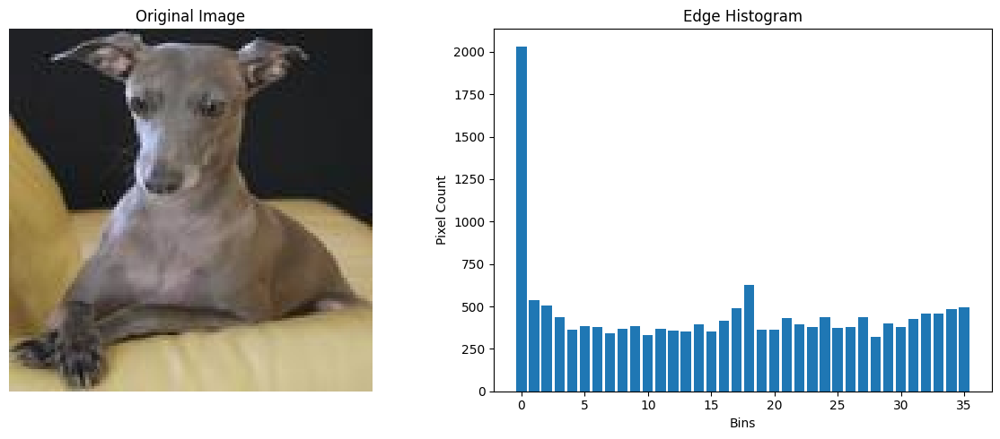

Image 197: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9115_0.jpg


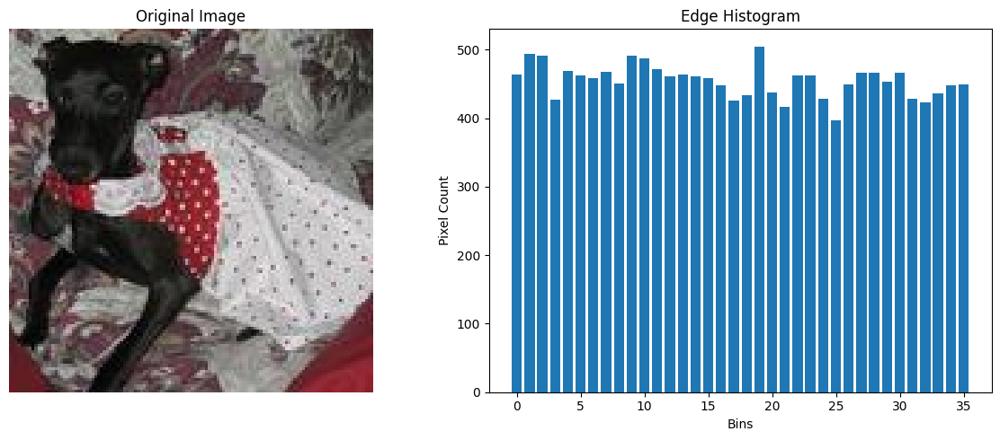

Image 198: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9131_0.jpg


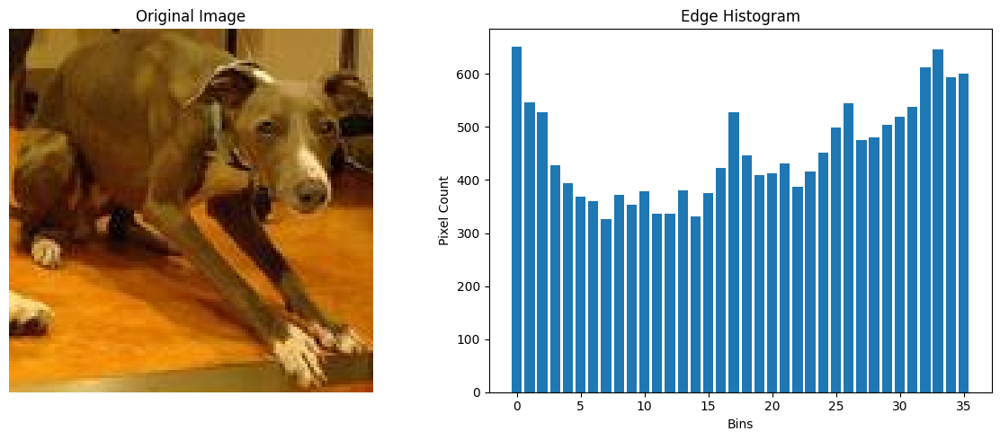

Image 199: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9183_0.jpg


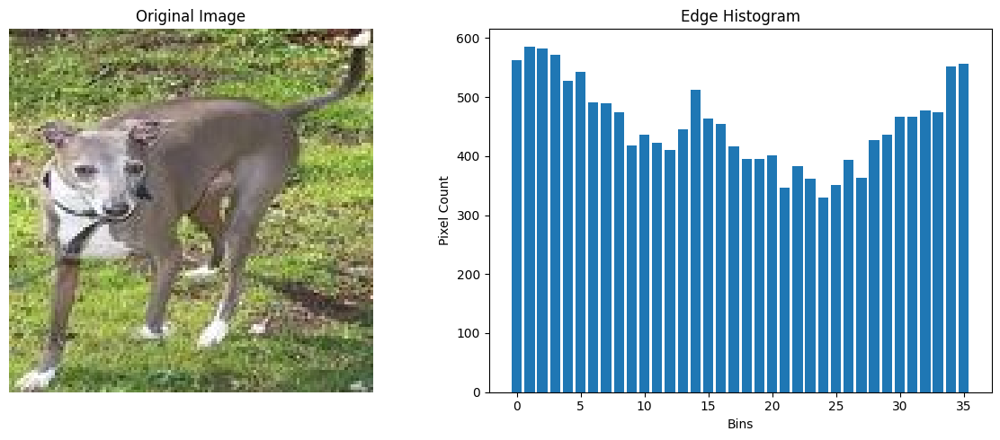

Image 200: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_923_0.jpg


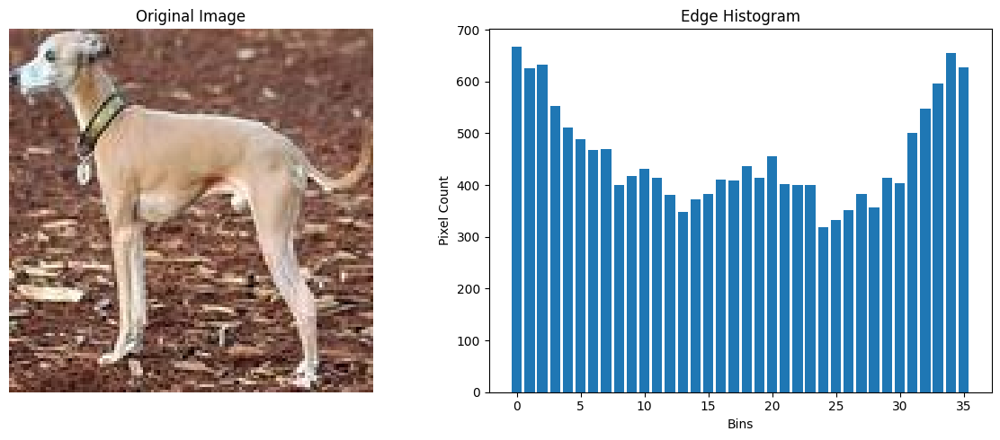

Image 201: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_924_0.jpg


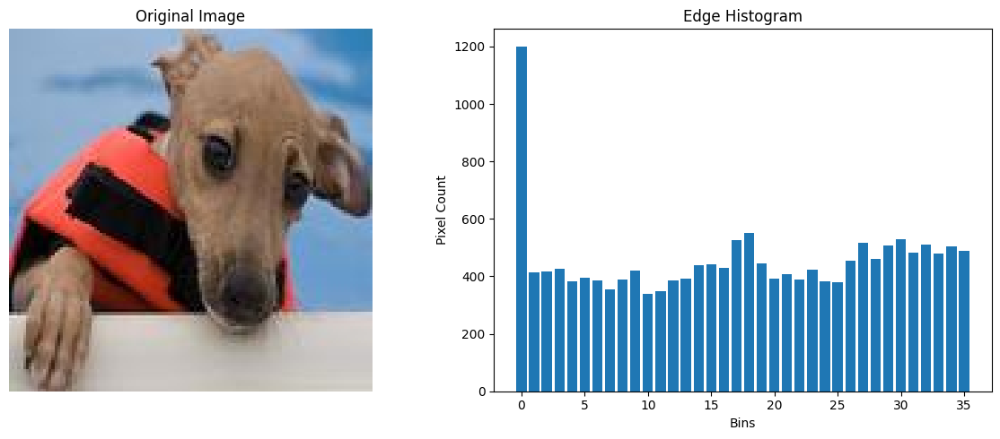

Image 202: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9405_0.jpg


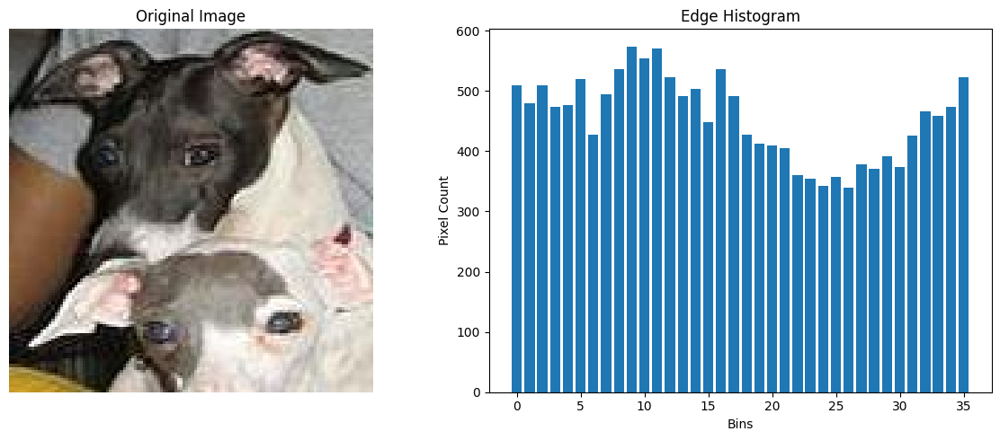

Image 203: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9405_1.jpg


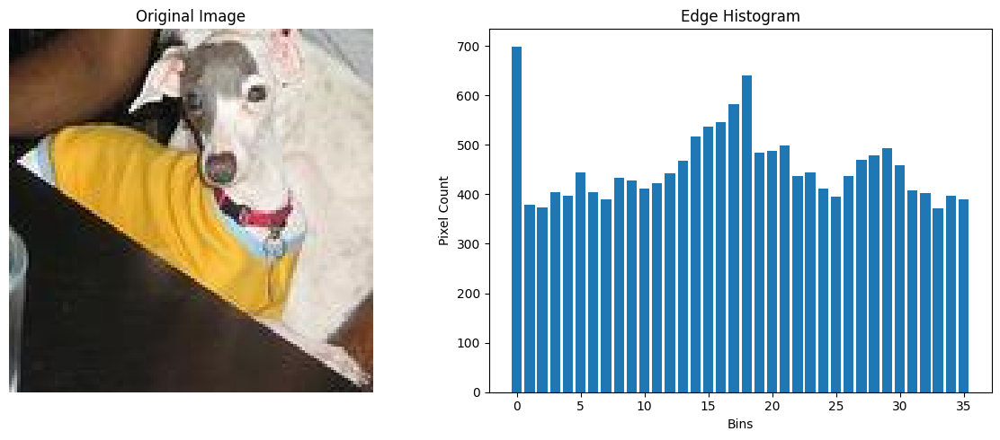

Image 204: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9491_0.jpg


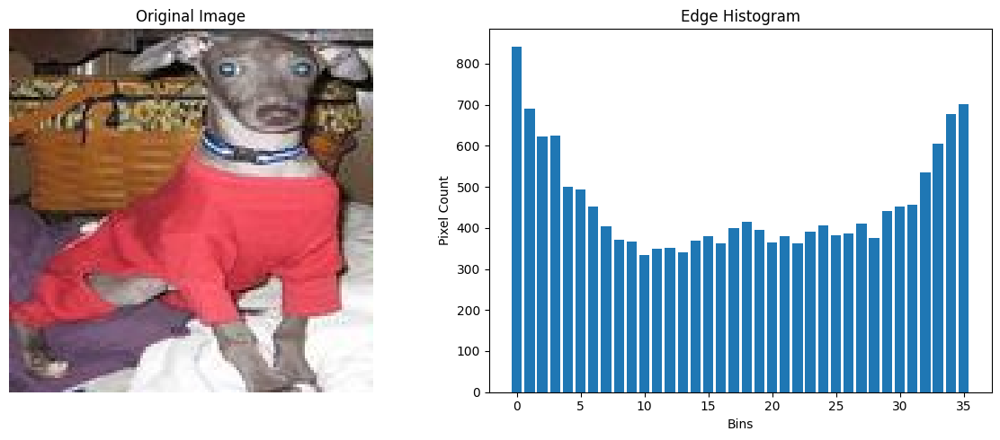

Image 205: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9517_0.jpg


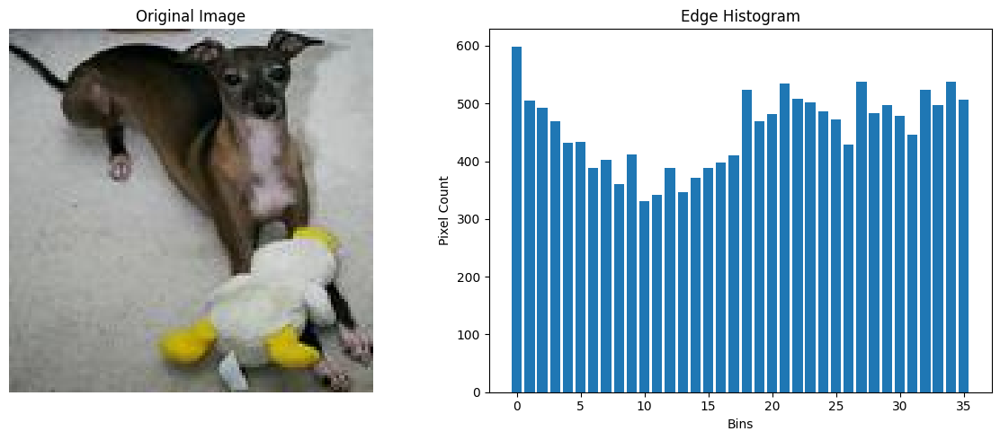

Image 206: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9592_0.jpg


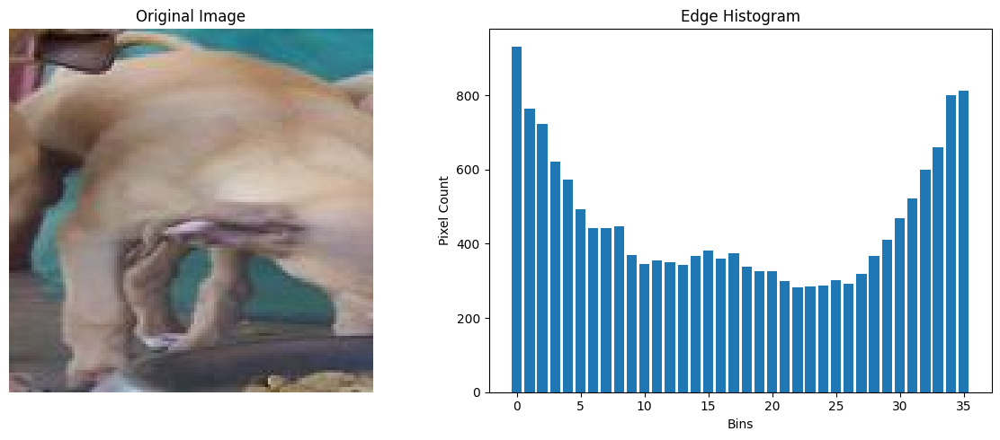

Image 207: C:\Users\David\programmingAssignment1\output\n02091032-Italian_greyhound\n02091032_9592_1.jpg


KeyboardInterrupt: 

In [5]:
import os
import numpy as np
from skimage import io, filters, exposure
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances, cosine_distances

def create_edge_histogram(image_path, num_bins=36):
    img = io.imread(image_path, as_gray=True)
    edge_angles = np.mod(np.arctan2(filters.sobel_v(img), filters.sobel_h(img)), np.pi)
    hist, _ = exposure.histogram(edge_angles, nbins=num_bins)
    return hist

def plot_image_with_histogram(image_path, hist):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # Plot image
    img = io.imread(image_path)
    ax1.imshow(img)
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    # Plot histogram
    ax2.bar(range(len(hist)), hist)
    ax2.set_xlabel('Bins')
    ax2.set_ylabel('Pixel Count')
    ax2.set_title('Edge Histogram')
    
    plt.tight_layout()
    plt.show()

def calculate_distances(hist1, hist2):
    euclidean = euclidean_distances([hist1], [hist2])[0][0]
    manhattan = manhattan_distances([hist1], [hist2])[0][0]
    cosine = cosine_distances([hist1], [hist2])[0][0]
    return euclidean, manhattan, cosine

# Use the correct path for your processed images
OUTPUT_DIR = r'C:\Users\David\programmingAssignment1\output'

# Get all jpg files from the output directory and its subdirectories
image_paths = []
for root, dirs, files in os.walk(OUTPUT_DIR):
    for file in files:
        if file.endswith('.jpg'):
            image_paths.append(os.path.join(root, file))

if not image_paths:
    print(f"No jpg files found in {OUTPUT_DIR}")
else:
    print(f"Found {len(image_paths)} images. Processing...")
    
    histograms = [create_edge_histogram(img_path) for img_path in image_paths]
    
    # Plot histograms for all images
    for i, (img_path, hist) in enumerate(zip(image_paths, histograms)):
        print(f"Image {i+1}: {img_path}")
        plot_image_with_histogram(img_path, hist)
    
    # Compare all pairs of histograms
    n = len(histograms)
    for i in range(n):
        for j in range(i+1, n):
            euclidean, manhattan, cosine = calculate_distances(histograms[i], histograms[j])
            print(f"Distances between image {i+1} and image {j+1}:")
            print(f"Euclidean distance: {euclidean}")
            print(f"Manhattan distance: {manhattan}")
            print(f"Cosine distance: {cosine}")
            print()

print("Processing completed.")